# Pre-masking pipeline

In [1]:
import os
import random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import densenet121
import pydicom
from PIL import Image
import ast
import torch.nn.functional as F
import matplotlib.pyplot as plt
import zipfile
import io



## Loading in images and setting up device

In [2]:
## don't change
jiwoo_stem = '/Users/jiwoo_noh/Downloads' 
df_preds        = pd.read_csv('best_model_pred_final.csv')

## IMPORTANT
## change for your computer/ your list
local_path_stem = "/Users/Kyra_1/Desktop/local_ADS_data/physionet.org/files/mimic-cxr/2.1.0/"
## need the exclamation point here: needs to end in ".zip!test_data/"
my_data_path = "/Users/Kyra_1/Desktop/test_data.zip!test_data/" 
my_list = pd.read_csv('third_1.csv')
'''
my_list = pd.concat(
    (pd.read_csv(f"third_{i}.csv") for i in range(1,4)),
    ignore_index=True
)

my_list = my_list.stack().reset_index(drop=True).to_frame(name='value')
print(my_list.shape) 
'''

# should return the folder before physionet.org
split_key = local_path_stem.split('/')[-6]
print(split_key)


# where you want a new folder to be created 
output_dir = "/Users/Kyra_1/Desktop/local_ADS_data/results_final"

os.makedirs(output_dir, exist_ok=True)

local_ADS_data


In [3]:
# ─── 1) FIX ALL SOURCES OF RANDOMNESS ────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
def load_jpg_as_pil(path):
    img = Image.open(path).convert("L")  # ensure grayscale
    return img

In [6]:
# ─── 2) DEVICE ───────────────────────────────────────────────────────
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("Using device:", device)

Using device: mps


In [7]:
# CHANGE FOR NEW DATA WHEN WE HAVE THE NEW MODEL --> ASK JIWOO FOR IT
# ─── 3) HARD-CODE TRAINING MEAN & STD ────────────────────────────────
TRAIN_MEAN = 0.5007
TRAIN_STD  = 0.2508

In [8]:
# ─── 4) TRANSFORM FOR TEST IMAGES ────────────────────────────────────
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t.float()),
    transforms.Normalize([TRAIN_MEAN], [TRAIN_STD])
])

In [ ]:
class JPGDataset(Dataset):
    def __init__(self, items, labels_dict, label2idx, transform=None):
        self.items = items
        self.labels_dict = labels_dict
        self.label2idx = label2idx
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        pid, path = self.items[idx]
        img = Image.open(path).convert("L")
        if self.transform:
            img = self.transform(img)
        label_str = self.labels_dict[(pid, path)]
        return img, self.label2idx[label_str]


In [ ]:
import os, io, zipfile, pydicom, torch
from PIL import Image
from torch.utils.data import Dataset

class ZippedJPGDataset(Dataset):
    def __init__(self, items, labels_dict, label2idx, transform=None):
        self.items = items
        self.labels_dict = labels_dict
        self.label2idx = label2idx
        self.transform = transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        pid, path = self.items[idx]
        archive_path, inner_path = path.split("!", 1)
        inner_path = inner_path.lstrip("/")

        with zipfile.ZipFile(archive_path, 'r') as zf:
            with zf.open(inner_path, 'r') as file:
                img = Image.open(file).convert("L")

        if self.transform:
            img = self.transform(img)

        label_str = self.labels_dict[(pid, path)]
        return img, self.label2idx[label_str]



In [ ]:
# build label mapping
all_labels   = df_preds['true_label']
unique_labels = sorted(all_labels.unique())
label2idx     = {lab: i for i, lab in enumerate(unique_labels)}

# collect (pid, full_path) and labels_dict
test_items  = []
labels_dict = {}
for _, row in my_list.iterrows():
    dicom_id = row.iloc[0].split('/')[-1]

    matches = df_preds[df_preds['dicom_path'].str.contains(dicom_id, na=False)]
    if matches.empty:
        print(f"⚠️  DICOM ID {dicom_id!r} not found in df_preds.path_column; skipping.")
        continue

    matched_str = matches.iloc[0]['dicom_path']
    pid        = matches.iloc[0]['subject_id']
    other_path = matched_str.split('/')[-1]
    full_path  = os.path.join(my_data_path, dicom_id)
    '''
    if not os.path.exists(full_path):
        continue
    '''
    test_items.append((pid, full_path))
    labels_dict[(pid, full_path)] = matches.iloc[0]['predicted']

# create DataLoader
'''
test_loader = DataLoader(
    DicomDataset(test_items, labels_dict, label2idx, test_transform),
    batch_size=8,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)
'''
test_loader = DataLoader(
    ZippedJPGDataset(test_items, labels_dict, label2idx, test_transform),
    batch_size=8, shuffle=False, num_workers=0
)



In [12]:
# ─── 7) BUILD MODEL & LOAD WEIGHTS ─────────────────────────────────
num_classes = len(unique_labels)

model = densenet121(pretrained=True)
# swap first conv to accept 1 channel
old = model.features.conv0
new = nn.Conv2d(
    1, old.out_channels,
    old.kernel_size, old.stride, old.padding,
    bias=(old.bias is not None)
)
with torch.no_grad():
    new.weight[:] = old.weight.mean(dim=1, keepdim=True)
    if old.bias is not None:
        new.bias[:] = old.bias
model.features.conv0 = new

# replace classifier
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model = model.to(device)

# load your trained weights
model.load_state_dict(torch.load("reproduceable_densenet.pt", map_location=device))
model.eval()

/opt/anaconda3/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/anaconda3/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [13]:
'''
results = []
batch_size = test_loader.batch_size

with torch.no_grad():
    for batch_idx, (imgs, labs) in enumerate(test_loader):
        imgs  = imgs.to(device)
        logits = model(imgs)
        probs  = torch.softmax(logits, dim=1)
        preds  = probs.argmax(dim=1)

        for b in range(imgs.size(0)):
            global_idx = batch_idx * batch_size + b
            pid, path  = test_items[global_idx]
            true_lbl   = unique_labels[labs[b].item()]
            pred_lbl   = unique_labels[preds[b].item()]
            prob_vals  = probs[b].cpu().numpy().tolist()

            row = {
                "patient_id":      pid,
                "full_path":       path,
                "true_label":      true_lbl,
                "predicted_label": pred_lbl,
            }
            for j, p in enumerate(prob_vals):
                row[f"prob_class_{j}"] = p

            results.append(row)

# write out
out_df = pd.DataFrame(results)
out_df.to_csv("predictions.csv", index=False)
print(f"Saved {len(out_df)} predictions to predictions.csv")
'''

'\nresults = []\nbatch_size = test_loader.batch_size\n\nwith torch.no_grad():\n    for batch_idx, (imgs, labs) in enumerate(test_loader):\n        imgs  = imgs.to(device)\n        logits = model(imgs)\n        probs  = torch.softmax(logits, dim=1)\n        preds  = probs.argmax(dim=1)\n\n        for b in range(imgs.size(0)):\n            global_idx = batch_idx * batch_size + b\n            pid, path  = test_items[global_idx]\n            true_lbl   = unique_labels[labs[b].item()]\n            pred_lbl   = unique_labels[preds[b].item()]\n            prob_vals  = probs[b].cpu().numpy().tolist()\n\n            row = {\n                "patient_id":      pid,\n                "full_path":       path,\n                "true_label":      true_lbl,\n                "predicted_label": pred_lbl,\n            }\n            for j, p in enumerate(prob_vals):\n                row[f"prob_class_{j}"] = p\n\n            results.append(row)\n\n# write out\nout_df = pd.DataFrame(results)\nout_df.to_csv

## Checking for variability

In [14]:
'''
from_test = pd.read_csv('best_model_pred.csv')
from_loading = pd.read_csv('predictions.csv')
jiwoo_stem = '/Users/jiwoo_noh/Downloads'

# New: list to hold updated rows
updated_rows = []

# Track count of threshold exceedances
threshold = 0.001
count_exceeds = 0
total_checked = 0

for _, row in from_loading.iterrows():
    dicom_id = row['full_path'].split(split_key)[1]
    search_path = jiwoo_stem + dicom_id

    ds = pydicom.dcmread(row['full_path'], stop_before_pixels=True)

    prob_list = [row['prob_class_0'], row['prob_class_1'], row['prob_class_2'], row['prob_class_3']]

    mask = from_test['dicom_path'] == search_path
    if not mask.any():
        print(f"{search_path!r} not found in from_test")
        continue
    
    total_checked += 1  # ✅ Count how many valid comparisons we made

    # grab the packed‐string out of your test set
    raw = from_test.loc[mask, 'probabilities'].iloc[0]

    # if it’s a string, turn it into a Python list
    if isinstance(raw, str):
        raw = ast.literal_eval(raw)

    # make numpy arrays
    a = np.array(raw, dtype=float)
    b = np.array(prob_list, dtype=float)

    diffs = a - b
    max_abs = np.max(np.abs(diffs))

    # New: check if threshold is exceeded
    exceeds = int(max_abs > threshold)
    if exceeds:
        count_exceeds += 1

    # Add flag to row and save it
    updated_row = row.copy()
    updated_row["exceeds_threshold"] = exceeds
    updated_rows.append(updated_row)

# Save updated DataFrame
updated_df = pd.DataFrame(updated_rows)
updated_df.to_csv("predictions_with_threshold_check.csv", index=False)
print(f"Total predictions compared: {total_checked}")
print(f"Saved predictions_with_threshold_check.csv with {count_exceeds} threshold violations (max_abs > {threshold})")
'''


'\nfrom_test = pd.read_csv(\'best_model_pred.csv\')\nfrom_loading = pd.read_csv(\'predictions.csv\')\njiwoo_stem = \'/Users/jiwoo_noh/Downloads\'\n\n# New: list to hold updated rows\nupdated_rows = []\n\n# Track count of threshold exceedances\nthreshold = 0.001\ncount_exceeds = 0\ntotal_checked = 0\n\nfor _, row in from_loading.iterrows():\n    dicom_id = row[\'full_path\'].split(split_key)[1]\n    search_path = jiwoo_stem + dicom_id\n\n    ds = pydicom.dcmread(row[\'full_path\'], stop_before_pixels=True)\n\n    prob_list = [row[\'prob_class_0\'], row[\'prob_class_1\'], row[\'prob_class_2\'], row[\'prob_class_3\']]\n\n    mask = from_test[\'dicom_path\'] == search_path\n    if not mask.any():\n        print(f"{search_path!r} not found in from_test")\n        continue\n\n    total_checked += 1  # ✅ Count how many valid comparisons we made\n\n    # grab the packed‐string out of your test set\n    raw = from_test.loc[mask, \'probabilities\'].iloc[0]\n\n    # if it’s a string, turn it into

In [13]:
import os
import ast
import torch
import pydicom
import numpy as np
import pandas as pd

def run_prediction_and_threshold_pipeline(
    test_loader,
    test_items,
    unique_labels,
    model,
    device,
    split_key,
    jiwoo_stem,
    pred_csv="predictions.csv",
    compare_csv="predictions_with_threshold_check.csv",
    threshold=0.001
):
    """
    1) Runs model on test_loader, saves predictions to pred_csv.
    2) Compares those to 'best_model_pred_final.csv' in CWD,
       flags any max-abs-diff > threshold, and writes compare_csv.
    Skips any sample whose image file isn't found on disk.
    Returns: (out_df, updated_df)
    """
    results = []
    batch_size = test_loader.batch_size

    model.eval()
    with torch.no_grad():
        for batch_idx, (imgs, labs) in enumerate(test_loader):
            # imgs are assumed already loaded by your Dataset; we just move them to device
            imgs = imgs.to(device)
            logits = model(imgs)
            probs  = torch.softmax(logits, dim=1)
            preds  = probs.argmax(dim=1)

            for b in range(imgs.size(0)):
                global_idx = batch_idx * batch_size + b
                pid, path  = test_items[global_idx]

                # → NEW: skip if the DICOM isn't on disk
                '''
                if not os.path.exists(path):
                    print(f"⚠️  Missing image for sample {pid!r} at {path!r}. Skipping.")
                    continue
                '''

                true_lbl  = unique_labels[labs[b].item()]
                pred_lbl  = unique_labels[preds[b].item()]
                prob_vals = probs[b].cpu().numpy().tolist()

                row = {
                    "patient_id":      pid,
                    "full_path":       path,
                    "true_label":      true_lbl,
                    "predicted_label": pred_lbl,
                }
                for j, p in enumerate(prob_vals):
                    row[f"prob_class_{j}"] = p

                results.append(row)

    out_df = pd.DataFrame(results)
    out_df.to_csv(pred_csv, index=False)
    print(f"✅ Saved {len(out_df)} predictions to {pred_csv}")

    # ------ PART 2: compare to reference and flag diffs -------
    try:
        from_test = pd.read_csv("best_model_pred_final.csv")
    except FileNotFoundError:
        raise FileNotFoundError("Reference CSV 'best_model_pred_final.csv' not found in working dir.")

    updated_rows  = []
    count_exceeds = 0
    total_checked = 0

    for _, row in out_df.iterrows():
        # reconstruct the reference path
        dicom_id    = row['full_path'].split('/')[-1]
        search_path = os.path.join(jiwoo_stem, dicom_id)

        # build a boolean mask: does dicom_path contain this substring?
        mask = from_test['dicom_path'].str.contains(
            dicom_id,
            regex=False,   # treat dicom_id literally (no regex metachars)
            na=False       # False where dicom_path is NaN
        )

        if not mask.any():
            print(f"🔍 '{dicom_id}' not found in reference CSV. Skipping.")
            continue

        # grab the matching rows
        matched = from_test[mask]
        # e.g. pick the first one
        raw = matched['probabilities'].iloc[0]
        if isinstance(raw, str):
            raw = ast.literal_eval(raw)
        a = np.array(raw, dtype=float)
        total_checked +=1
        '''
        # → NEW: skip if the reference DICOM isn't on disk either
        if not os.path.exists(search_path):
            print(f"⚠️  Reference image not found at {search_path!r}. Skipping comparison.")
            continue
        
        # look up in the reference CSV by its dicom_path column
        mask = from_test['dicom_path'] == search_path
        if not mask.any():
            print(f"🔍  {search_path!r} not in reference CSV. Skipping.")
            continue

        total_checked += 1
        raw = from_test.loc[mask, 'probabilities'].iloc[0]
        if isinstance(raw, str):
            raw = ast.literal_eval(raw)

        a = np.array(raw, dtype=float)
        '''
        b = np.array([row[f"prob_class_{i}"] for i in range(a.shape[0])], dtype=float)

        max_abs = np.max(np.abs(a - b))
        exceeds = int(max_abs > threshold)
        count_exceeds += exceeds

        updated_row = row.copy()
        updated_row["exceeds_threshold"] = exceeds
        updated_rows.append(updated_row)

    updated_df = pd.DataFrame(updated_rows)
    updated_df.to_csv(compare_csv, index=False)
    print(f"🔢 Total comparisons made: {total_checked}")
    print(f"✅ Saved {compare_csv} with {count_exceeds} violations (> {threshold})")

    return out_df, updated_df


# Masking

## Apply mask

In [14]:
def apply_mask(x, mask, background, mode='keep'):
    """
    Composites either:
      - keep  : x * mask + background * (1-mask)
      - remove: background * mask + x * (1-mask)
    """
    if mode == 'keep':
        return x * mask + (background * (1 - mask))
    elif mode == 'remove':
        return background * mask + x * (1 - mask)
    else:
        raise ValueError(f"Unknown mode {mode}")

'''
def apply_mask(x, mask, mode='keep'):
    noise = torch.randn_like(x)
    if mode == 'keep':
        return x * mask + noise * (1 - mask)
    elif mode == 'remove':
        return x * (1 - mask) + noise * mask
'''

"\ndef apply_mask(x, mask, mode='keep'):\n    noise = torch.randn_like(x)\n    if mode == 'keep':\n        return x * mask + noise * (1 - mask)\n    elif mode == 'remove':\n        return x * (1 - mask) + noise * mask\n"

## Explanation loss

In [ ]:
# based on his suggestion for a conditional background, but will need the training images

def conditional_background(x, mask, train_images, k=5):
    # x: [B, C, H, W], mask: [B, 1, H, W], train_images: [N, C, H, W]
    B, C, H, W = x.shape
    masked_flat = (x * mask).flatten(1)  # shape [B, C*H*W]
    train_flat = (train_images * mask[0]).flatten(1)

    # compute L2 distances between masked region and each train sample's masked region
    dists = torch.cdist(masked_flat, train_flat)  # shape [B, N]

    # get k-nearest neighbors for each example
    _, knn_indices = torch.topk(dists, k=k, largest=False)
    knn_samples = train_images[knn_indices]  # shape [B, k, C, H, W]
    conditional_fill = knn_samples.mean(dim=1)  # shape [B, C, H, W]
    return conditional_fill


In [ ]:
def explanation_loss(model, x, mask, background_path, alpha=0.5, return_components=False):
    with torch.no_grad():
        y_orig = model(x)

    #background = torch.load(background_path).to(device)
    background = conditional_background(x, mask, train_images)
    x_keep = apply_mask(x, mask, background, mode='keep')
    x_remove = apply_mask(x, mask, background, mode='remove')

    y_keep = model(x_keep)
    y_remove = model(x_remove)

    #loss_suf = F.mse_loss(y_keep, y_orig)
    with torch.no_grad():
        probs_orig  = torch.softmax(y_orig, dim=1)             # shape [B, C]
        pred_class  = probs_orig.argmax(dim=1, keepdim=True)  # shape [B, 1]

    # 2) get the kept‐image probabilities
    probs_keep = torch.softmax(y_keep, dim=1)                # shape [B, C]

    # 3) gather the probability of that original class
    keep_conf  = probs_keep.gather(1, pred_class).squeeze()  # shape [B]

    # 4) define sufficiency as (1 − confidence)²
    orig_conf = probs_orig.gather(1, pred_class).squeeze()  # shape [B]
    loss_suf = ((orig_conf - keep_conf) ** 2).mean()



    probs_remove = torch.softmax(y_remove, dim=1)
    remove_conf  = probs_remove.gather(1, pred_class).squeeze()
    loss_nec     = (remove_conf ** 2).mean()
    #loss_nec = F.mse_loss(y_remove, torch.mean(y_orig, dim=0, keepdim=True))
    '''
    # once we have the expected logits for each class:

    y_remove_logits = y_remove  # logits, not softmax
    expected_class_logit = expected_logits[pred_class.squeeze()]  # shape [B]
    actual_logit = y_remove_logits.gather(1, pred_class).squeeze()

    loss_nec = ((actual_logit - expected_class_logit) ** 2).mean()

    '''

    l1_penalty = mask.abs().mean()

    tv_penalty = (torch.abs(mask[:, :, :, :-1] - mask[:, :, :, 1:]).mean()+
        torch.abs(mask[:, :, :-1, :] - mask[:, :, 1:, :]).mean()
    )

    loss = alpha * loss_suf + (1 - alpha) * loss_nec + 0.1 * l1_penalty + 0.01 * tv_penalty

    if return_components:
        pred_orig = y_orig.argmax(dim=1).item()
        pred_keep = y_keep.argmax(dim=1).item()
        pred_remove = y_remove.argmax(dim=1).item()

        return loss, {
            'loss': loss.item(),
            'sufficiency': loss_suf.item(),
            'necessity': loss_nec.item(),
            'l1': l1_penalty.item(),
            'tv': tv_penalty.item(),
            'changed_with_keep': pred_keep != pred_orig,
            'changed_with_remove': pred_remove != pred_orig
        }
    return loss

## Evaluate Explanation Loss

In [16]:
def evaluate_explanation_loss(model, x, alpha=0.5, mask_init="ones", return_components=True):
    device = x.device
    if isinstance(mask_init, str):
        if mask_init == "random":
            mask = torch.rand_like(x).to(device)
        elif mask_init == "ones":
            mask = torch.ones_like(x).to(device)
        elif mask_init == "zeros":
            mask = torch.zeros_like(x).to(device)
        else:
            raise ValueError(f"Unknown mask_init: {mask_init}")
    else:
        mask = mask_init.to(device)
    return explanation_loss(model, x, mask, background_path = "mean_image.pt", alpha=alpha, return_components = return_components), mask

## Optimize Loss

In [17]:
def optimize_mask(model, x, alpha=1.0, lr=0.5, log_every=10, tol=1e-5, max_no_improve=5, init_mask=None, output_dir=None, prefix=None):
    """
    Optimize a mask with learning rate decay and safe return on interrupt.
    """
    mask = torch.nn.Parameter(init_mask.clone().detach() if init_mask is not None else torch.ones_like(x), requires_grad=True)
    optimizer = torch.optim.Adam([mask], lr=lr)

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.9)
    #scheduler = torch.optim.lr_scheduler.ExponentialLRS(optimizer, gamma=0.9)

    mask_history = []
    suff_history = []
    nec_history  = []
    sparsity_history = []
    tv_history = []
    prev_loss = float('inf')
    no_improve_count = 0
    step = 0
    changed_class = False
    best_loss = float('inf')
    best_mask = None   

    try:
        while True:
            optimizer.zero_grad()
            loss, components = explanation_loss(model, x, mask, background_path= "mean_image.pt", alpha=alpha, return_components=True)
            
            if components['loss'] < best_loss:
                best_loss = components['loss']
                best_mask = mask.detach().clone()
            loss.backward()
            optimizer.step()
            scheduler.step()
            mask.data.clamp_(0, 1)

            if (step + 1) % log_every == 0 or step == 0:
                current_lr = scheduler.get_last_lr()[0]
                print(f"Step {step+1:4d}: "
                      f"Loss={components['loss']:.6f} | "
                      f"Suff={components['sufficiency']:.6f} | "
                      f"Nec={components['necessity']:.6f} | "
                      f"L1={components['l1']:.6f} | "
                      f"TV={components['tv']:.6f} | "
                      f"Changed (keep): {components['changed_with_keep']} | "
                      f"Changed (remove): {components['changed_with_remove']} | "
                      f"LR={current_lr:.6e}")
                mask_history.append(mask.detach().cpu().clone())
                suff_history.append(components['sufficiency'])
                nec_history.append( components['necessity'] )
                sparsity_history.append( mask.abs().mean().item() )
                tv_history.append(components['tv'])

                if alpha == 1.0 and components['changed_with_keep']:
                    changed_class = True
                elif alpha == 0.0 and components['changed_with_remove']:
                    changed_class = True

            loss_delta = abs(prev_loss - components['loss'])
            if loss_delta < tol:
                no_improve_count += 1
                if no_improve_count >= max_no_improve:
                    print(f"Converged at step {step+1} (loss change < {tol} for {max_no_improve} steps)")
                    break
            else:
                no_improve_count = 0

            prev_loss = components['loss']
            step += 1

    except KeyboardInterrupt:
        print(f"\n⏹️ Optimization manually interrupted at step {step+1}. Returning current mask.")
    
    final_mask = best_mask

    fig, ax = plt.subplots()
    ax.plot(suff_history,      label='Sufficiency', linewidth=2)
    ax.plot(nec_history,       label='Necessity',    linewidth=2)
    ax.plot(sparsity_history,  label='Sparsity',     linewidth=2)
    ax.plot(tv_history, label = 'Smoothness', linewidth = 2)

    ax.set_xlabel("Step")
    ax.set_ylabel("Metric Value")
    ax.set_title("Sufficiency, Necessity & Sparsity over Optimization")
    ax.legend(loc='best')
    plt.tight_layout()
    
    if output_dir and prefix:
        os.makedirs(output_dir, exist_ok=True)
        # 1) final mask
        torch.save(final_mask.cpu(),
                   os.path.join(output_dir, f"{prefix}_final_mask.pt"))
        # 2) mask history
        torch.save([m.cpu() for m in mask_history],
                   os.path.join(output_dir, f"{prefix}_mask_history.pt"))
        # 3) metric plot
        fig.savefig(os.path.join(output_dir, f"{prefix}_metrics.png"))
        plt.close(fig)
    else:
        plt.show()
    
    return mask.detach(), mask_history, changed_class


In [20]:
out_df, updated_df = run_prediction_and_threshold_pipeline(
     test_loader=test_loader,
     test_items=test_items,
     unique_labels=unique_labels,
     model=model,
     device=device,
     split_key=split_key,
     jiwoo_stem=jiwoo_stem,
     pred_csv="predictions.csv",
     compare_csv="predictions_with_threshold_check.csv",
     threshold=0.001
 )

✅ Saved 119 predictions to predictions.csv
🔢 Total comparisons made: 119
✅ Saved predictions_with_threshold_check.csv with 0 violations (> 0.001)


Step    1: Loss=0.102812 | Suff=0.000002 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062379 | Suff=0.007506 | Nec=0.000002 | L1=0.499486 | TV=0.867662 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057761 | Suff=0.000192 | Nec=0.000000 | L1=0.487833 | TV=0.888165 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056361 | Suff=0.000032 | Nec=0.000000 | L1=0.475379 | TV=0.880754 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054344 | Suff=0.000012 | Nec=0.000000 | L1=0.457167 | TV=0.862109 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051098 | Suff=0.000008 | Nec=0.000000 | L1=0.428444 | TV=0.824949 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.046638 | Suff=0.000013 | Nec=0.000001 | L1=0.389722 | TV=0.765910 | Changed 

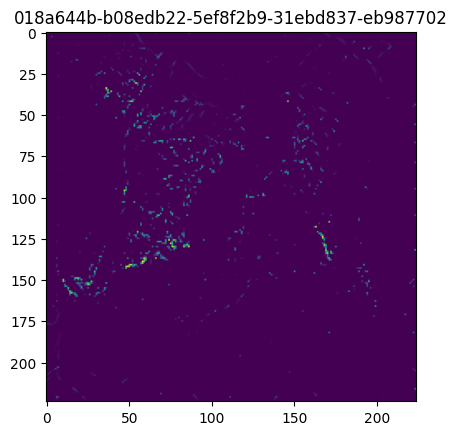

Step    1: Loss=0.117931 | Suff=0.005995 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061221 | Suff=0.000446 | Nec=0.000126 | L1=0.521612 | TV=0.877351 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059756 | Suff=0.000089 | Nec=0.000055 | L1=0.508058 | TV=0.887796 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058763 | Suff=0.000017 | Nec=0.000033 | L1=0.498922 | TV=0.884558 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057469 | Suff=0.000006 | Nec=0.000015 | L1=0.487110 | TV=0.874685 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055459 | Suff=0.000003 | Nec=0.000007 | L1=0.469112 | TV=0.854226 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052539 | Suff=0.000004 | Nec=0.000006 | L1=0.443481 | TV=0.818566 | Changed 

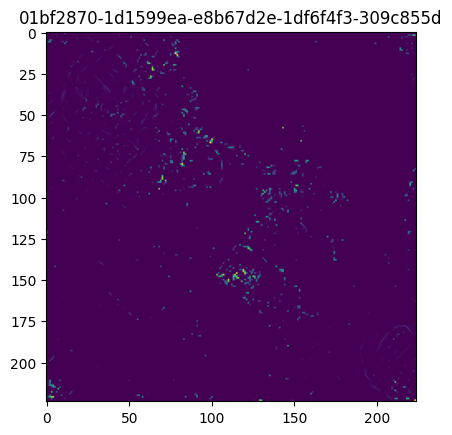

Step    1: Loss=0.153983 | Suff=0.102344 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.509512 | Suff=0.902233 | Nec=0.000000 | L1=0.494404 | TV=0.895477 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058286 | Suff=0.001102 | Nec=0.000016 | L1=0.489602 | TV=0.876652 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056972 | Suff=0.000144 | Nec=0.000022 | L1=0.481593 | TV=0.872983 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055623 | Suff=0.000053 | Nec=0.000014 | L1=0.469785 | TV=0.861061 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053610 | Suff=0.000027 | Nec=0.000006 | L1=0.451931 | TV=0.840044 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050811 | Suff=0.000025 | Nec=0.000004 | L1=0.427219 | TV=0.807484 | Changed (

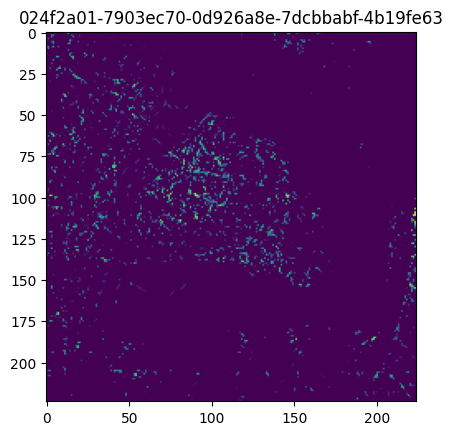

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061348 | Suff=0.000004 | Nec=0.000001 | L1=0.523370 | TV=0.900811 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060198 | Suff=0.000022 | Nec=0.000002 | L1=0.511366 | TV=0.904872 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059371 | Suff=0.000026 | Nec=0.000002 | L1=0.503391 | TV=0.901767 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058335 | Suff=0.000021 | Nec=0.000002 | L1=0.493810 | TV=0.894254 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056803 | Suff=0.000012 | Nec=0.000003 | L1=0.479981 | TV=0.879732 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054615 | Suff=0.000006 | Nec=0.000003 | L1=0.460616 | TV=0.854899 | Changed 

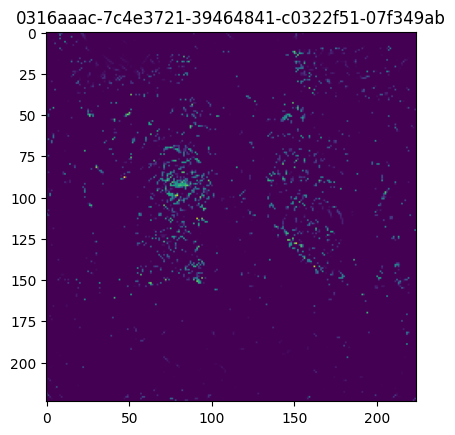

Step    1: Loss=0.114946 | Suff=0.000024 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061652 | Suff=0.000007 | Nec=0.000410 | L1=0.525688 | TV=0.887390 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060229 | Suff=0.000183 | Nec=0.000060 | L1=0.511298 | TV=0.897702 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059269 | Suff=0.000048 | Nec=0.000023 | L1=0.502760 | TV=0.895778 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058062 | Suff=0.000009 | Nec=0.000011 | L1=0.491750 | TV=0.887670 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056081 | Suff=0.000003 | Nec=0.000008 | L1=0.473963 | TV=0.867949 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053125 | Suff=0.000002 | Nec=0.000010 | L1=0.447990 | TV=0.831949 | Changed 

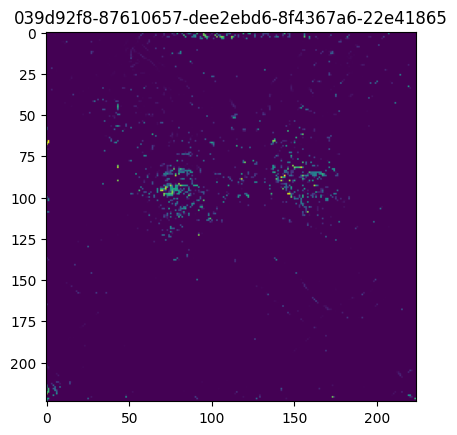

Step    1: Loss=0.115206 | Suff=0.000544 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061481 | Suff=0.000028 | Nec=0.000166 | L1=0.524273 | TV=0.895710 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060453 | Suff=0.000105 | Nec=0.000175 | L1=0.512831 | TV=0.902987 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059818 | Suff=0.000076 | Nec=0.000083 | L1=0.507133 | TV=0.902487 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.059085 | Suff=0.000031 | Nec=0.000034 | L1=0.500654 | TV=0.898705 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.058009 | Suff=0.000010 | Nec=0.000015 | L1=0.491000 | TV=0.889670 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.056324 | Suff=0.000005 | Nec=0.000010 | L1=0.476076 | TV=0.870921 | Changed 

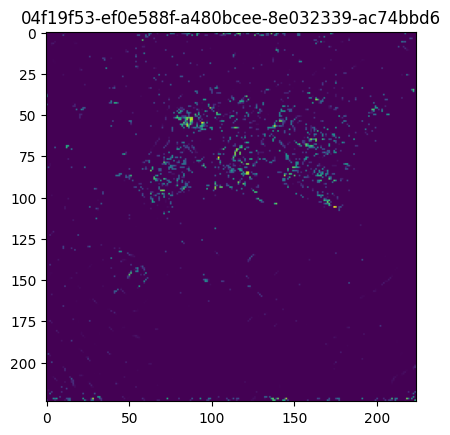

Step    1: Loss=0.114948 | Suff=0.000028 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061998 | Suff=0.000980 | Nec=0.000389 | L1=0.525217 | TV=0.879177 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060311 | Suff=0.000182 | Nec=0.000120 | L1=0.512773 | TV=0.888304 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059495 | Suff=0.000057 | Nec=0.000053 | L1=0.505655 | TV=0.887463 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058610 | Suff=0.000024 | Nec=0.000024 | L1=0.497639 | TV=0.882183 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057285 | Suff=0.000010 | Nec=0.000013 | L1=0.485682 | TV=0.870617 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055223 | Suff=0.000005 | Nec=0.000009 | L1=0.467410 | TV=0.847493 | Changed 

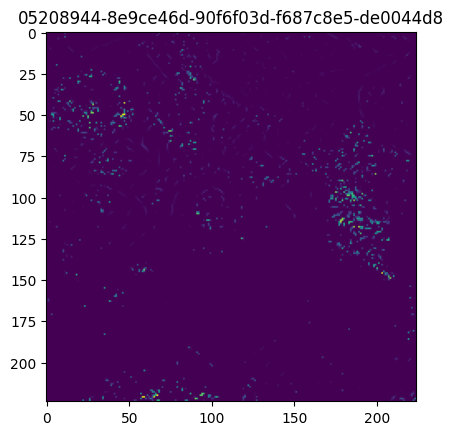

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061026 | Suff=0.000310 | Nec=0.000001 | L1=0.519065 | TV=0.896349 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059634 | Suff=0.000070 | Nec=0.000001 | L1=0.505570 | TV=0.904103 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058619 | Suff=0.000025 | Nec=0.000002 | L1=0.496019 | TV=0.900342 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057253 | Suff=0.000010 | Nec=0.000002 | L1=0.483523 | TV=0.889501 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055107 | Suff=0.000004 | Nec=0.000002 | L1=0.464350 | TV=0.866863 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052006 | Suff=0.000003 | Nec=0.000002 | L1=0.437203 | TV=0.828294 | Changed 

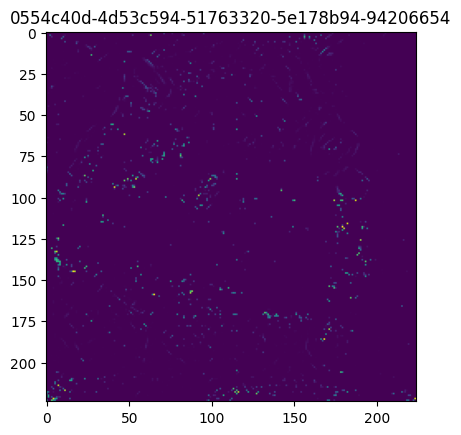

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062845 | Suff=0.002095 | Nec=0.000718 | L1=0.526192 | TV=0.881906 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060420 | Suff=0.000104 | Nec=0.000146 | L1=0.513965 | TV=0.889909 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059776 | Suff=0.000034 | Nec=0.000058 | L1=0.508294 | TV=0.889998 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.059070 | Suff=0.000014 | Nec=0.000025 | L1=0.501779 | TV=0.887286 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057808 | Suff=0.000006 | Nec=0.000013 | L1=0.490252 | TV=0.877332 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055592 | Suff=0.000004 | Nec=0.000012 | L1=0.470596 | TV=0.852466 | Changed 

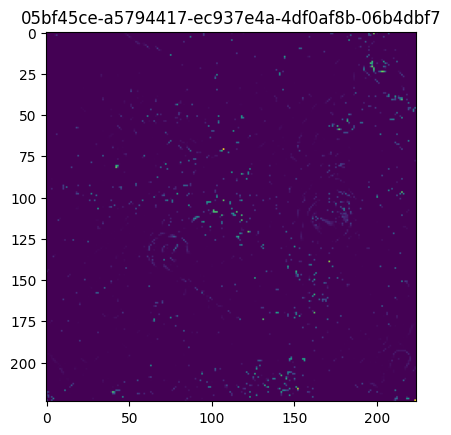

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059753 | Suff=0.000022 | Nec=0.000094 | L1=0.508997 | TV=0.879577 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058297 | Suff=0.000073 | Nec=0.000015 | L1=0.493589 | TV=0.889388 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056522 | Suff=0.000007 | Nec=0.000011 | L1=0.477448 | TV=0.876795 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054010 | Suff=0.000003 | Nec=0.000008 | L1=0.454875 | TV=0.851680 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050267 | Suff=0.000003 | Nec=0.000006 | L1=0.421908 | TV=0.807165 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.045490 | Suff=0.000006 | Nec=0.000005 | L1=0.380487 | TV=0.743600 | Changed 

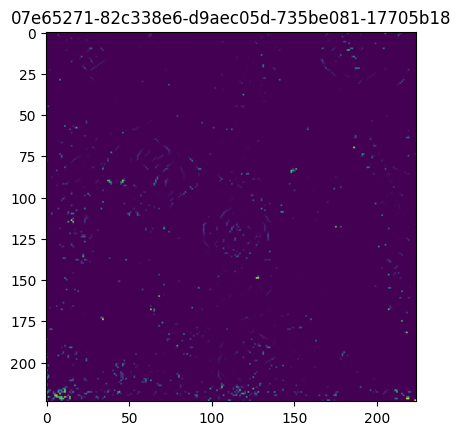

Step    1: Loss=0.114954 | Suff=0.000041 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061601 | Suff=0.002441 | Nec=0.000172 | L1=0.514966 | TV=0.879818 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058822 | Suff=0.000055 | Nec=0.000077 | L1=0.499132 | TV=0.884282 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057358 | Suff=0.000027 | Nec=0.000029 | L1=0.485799 | TV=0.875017 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055402 | Suff=0.000015 | Nec=0.000014 | L1=0.468132 | TV=0.857422 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052601 | Suff=0.000009 | Nec=0.000009 | L1=0.443280 | TV=0.826396 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048918 | Suff=0.000012 | Nec=0.000009 | L1=0.411112 | TV=0.779673 | Changed 

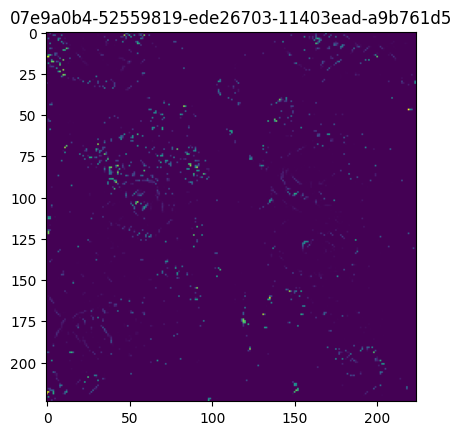

Step    1: Loss=0.114940 | Suff=0.000013 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061485 | Suff=0.000193 | Nec=0.000057 | L1=0.524535 | TV=0.890572 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060259 | Suff=0.000192 | Nec=0.000044 | L1=0.511418 | TV=0.899877 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059424 | Suff=0.000024 | Nec=0.000036 | L1=0.504201 | TV=0.897392 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058505 | Suff=0.000008 | Nec=0.000025 | L1=0.495812 | TV=0.890726 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057117 | Suff=0.000004 | Nec=0.000014 | L1=0.483360 | TV=0.877246 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055002 | Suff=0.000002 | Nec=0.000008 | L1=0.464732 | TV=0.852380 | Changed 

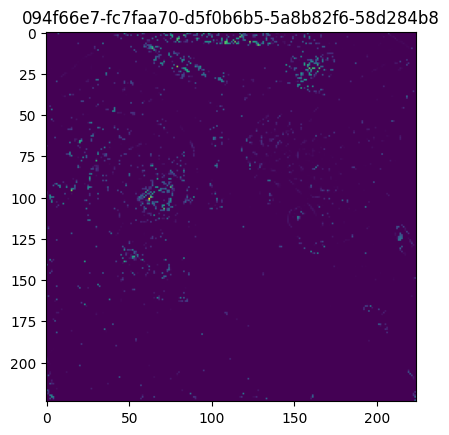

Step    1: Loss=0.114985 | Suff=0.000101 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061874 | Suff=0.000670 | Nec=0.000002 | L1=0.525719 | TV=0.896603 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060490 | Suff=0.000097 | Nec=0.000003 | L1=0.514350 | TV=0.900564 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059677 | Suff=0.000030 | Nec=0.000003 | L1=0.506831 | TV=0.897679 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058634 | Suff=0.000012 | Nec=0.000004 | L1=0.497227 | TV=0.890292 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057102 | Suff=0.000006 | Nec=0.000004 | L1=0.483337 | TV=0.876363 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054949 | Suff=0.000004 | Nec=0.000004 | L1=0.464142 | TV=0.853032 | Changed 

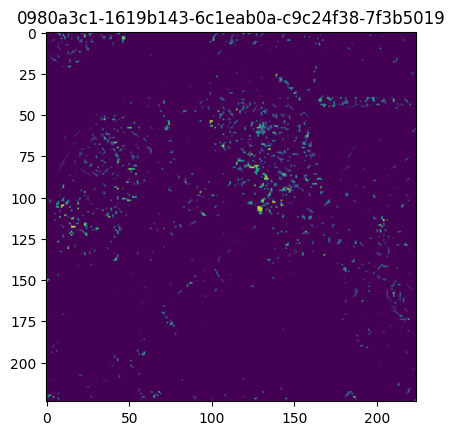

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060474 | Suff=0.000000 | Nec=0.000156 | L1=0.515730 | TV=0.882272 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058819 | Suff=0.000000 | Nec=0.000044 | L1=0.499207 | TV=0.887617 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057494 | Suff=0.000001 | Nec=0.000019 | L1=0.486725 | TV=0.881127 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055605 | Suff=0.000001 | Nec=0.000009 | L1=0.469514 | TV=0.864871 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052627 | Suff=0.000001 | Nec=0.000006 | L1=0.443134 | TV=0.831015 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048591 | Suff=0.000001 | Nec=0.000007 | L1=0.407954 | TV=0.779168 | Changed 

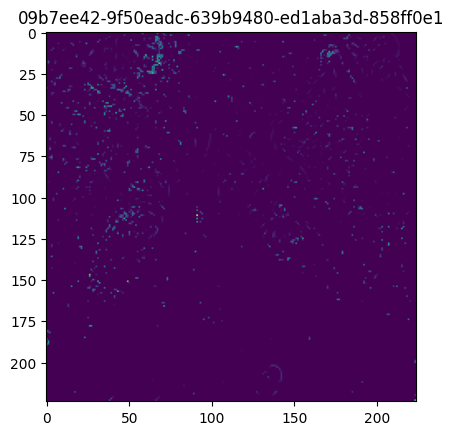

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061350 | Suff=0.000056 | Nec=0.000002 | L1=0.524659 | TV=0.885473 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059472 | Suff=0.000044 | Nec=0.000003 | L1=0.505456 | TV=0.890343 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057451 | Suff=0.000005 | Nec=0.000003 | L1=0.486791 | TV=0.876812 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054586 | Suff=0.000003 | Nec=0.000004 | L1=0.460928 | TV=0.849017 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050333 | Suff=0.000003 | Nec=0.000004 | L1=0.423439 | TV=0.798515 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.045053 | Suff=0.000009 | Nec=0.000004 | L1=0.377579 | TV=0.728872 | Changed 

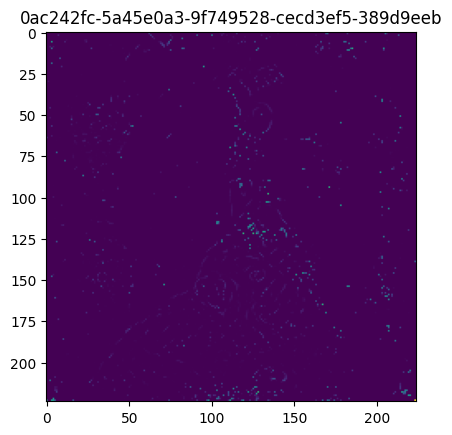

Step    1: Loss=0.114980 | Suff=0.000092 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061524 | Suff=0.000000 | Nec=0.000034 | L1=0.525663 | TV=0.894099 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060252 | Suff=0.000000 | Nec=0.000052 | L1=0.512398 | TV=0.898667 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059233 | Suff=0.000000 | Nec=0.000040 | L1=0.502616 | TV=0.895160 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057850 | Suff=0.000000 | Nec=0.000028 | L1=0.489894 | TV=0.884646 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055939 | Suff=0.000000 | Nec=0.000016 | L1=0.472786 | TV=0.865219 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053421 | Suff=0.000000 | Nec=0.000011 | L1=0.450614 | TV=0.835405 | Changed 

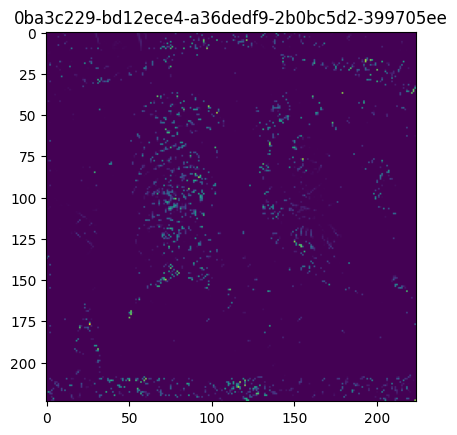

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061899 | Suff=0.000035 | Nec=0.000002 | L1=0.529248 | TV=0.895558 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060630 | Suff=0.000221 | Nec=0.000002 | L1=0.514914 | TV=0.902665 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059641 | Suff=0.000077 | Nec=0.000002 | L1=0.506087 | TV=0.899265 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058509 | Suff=0.000024 | Nec=0.000002 | L1=0.495870 | TV=0.890913 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056945 | Suff=0.000008 | Nec=0.000002 | L1=0.481842 | TV=0.875551 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054789 | Suff=0.000005 | Nec=0.000002 | L1=0.462830 | TV=0.850224 | Changed 

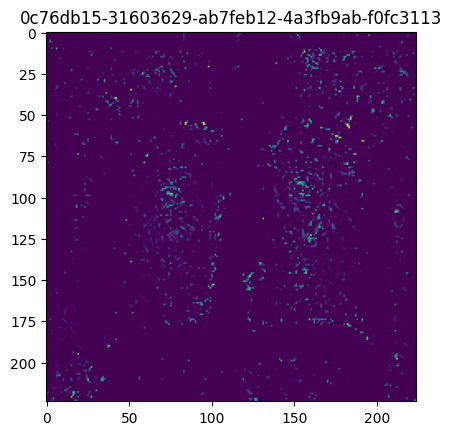

Step    1: Loss=0.114944 | Suff=0.000019 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061662 | Suff=0.000312 | Nec=0.000387 | L1=0.525241 | TV=0.878889 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060315 | Suff=0.000247 | Nec=0.000154 | L1=0.512531 | TV=0.886187 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059392 | Suff=0.000075 | Nec=0.000062 | L1=0.504973 | TV=0.882648 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058399 | Suff=0.000026 | Nec=0.000026 | L1=0.496224 | TV=0.875064 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056982 | Suff=0.000010 | Nec=0.000013 | L1=0.483555 | TV=0.861455 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054875 | Suff=0.000006 | Nec=0.000010 | L1=0.464927 | TV=0.837423 | Changed 

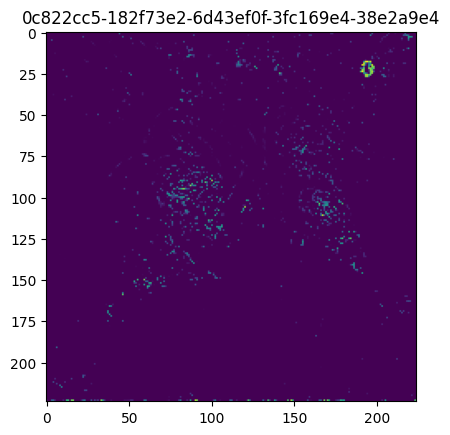

Step    1: Loss=0.114955 | Suff=0.000043 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061369 | Suff=0.000837 | Nec=0.000022 | L1=0.520653 | TV=0.887446 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059737 | Suff=0.000121 | Nec=0.000025 | L1=0.506692 | TV=0.899517 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058846 | Suff=0.000033 | Nec=0.000028 | L1=0.498496 | TV=0.896560 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057730 | Suff=0.000011 | Nec=0.000020 | L1=0.488334 | TV=0.888127 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056004 | Suff=0.000004 | Nec=0.000011 | L1=0.472853 | TV=0.871122 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053427 | Suff=0.000002 | Nec=0.000007 | L1=0.450204 | TV=0.840126 | Changed 

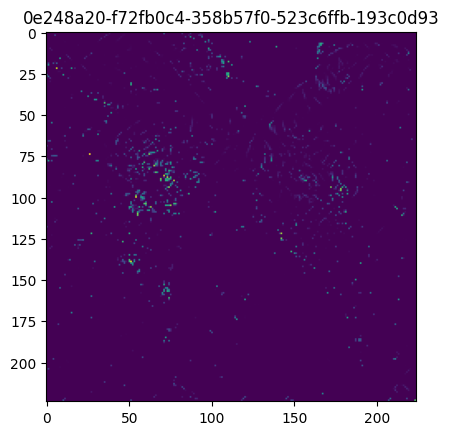

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061829 | Suff=0.001973 | Nec=0.000051 | L1=0.519442 | TV=0.887261 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059465 | Suff=0.000102 | Nec=0.000075 | L1=0.504603 | TV=0.891660 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058242 | Suff=0.000042 | Nec=0.000045 | L1=0.493562 | TV=0.884238 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056656 | Suff=0.000020 | Nec=0.000020 | L1=0.479406 | TV=0.869508 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054361 | Suff=0.000011 | Nec=0.000010 | L1=0.459091 | TV=0.844117 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.051266 | Suff=0.000010 | Nec=0.000006 | L1=0.432032 | TV=0.805428 | Changed 

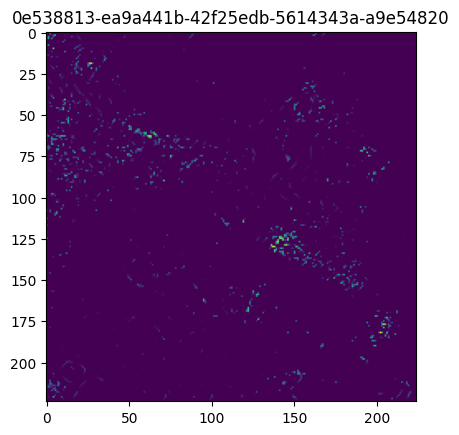

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061172 | Suff=0.000411 | Nec=0.000036 | L1=0.520186 | TV=0.892931 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059971 | Suff=0.000172 | Nec=0.000041 | L1=0.509148 | TV=0.894960 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059186 | Suff=0.000040 | Nec=0.000032 | L1=0.502292 | TV=0.892133 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058234 | Suff=0.000014 | Nec=0.000021 | L1=0.493640 | TV=0.885321 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056736 | Suff=0.000006 | Nec=0.000011 | L1=0.480168 | TV=0.871120 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054533 | Suff=0.000004 | Nec=0.000006 | L1=0.460650 | TV=0.846282 | Changed 

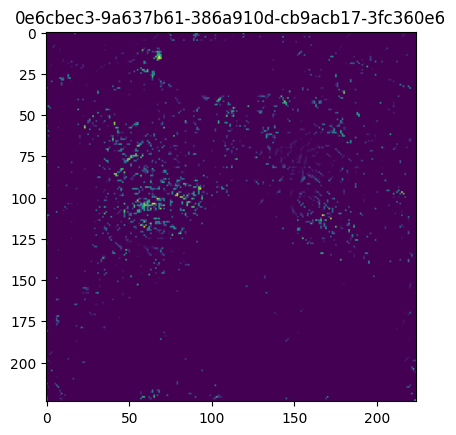

Step    1: Loss=0.114940 | Suff=0.000012 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062224 | Suff=0.001429 | Nec=0.000887 | L1=0.523572 | TV=0.870829 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060007 | Suff=0.000173 | Nec=0.000117 | L1=0.510471 | TV=0.881507 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059285 | Suff=0.000040 | Nec=0.000051 | L1=0.504247 | TV=0.881463 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058483 | Suff=0.000015 | Nec=0.000024 | L1=0.496837 | TV=0.877949 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057038 | Suff=0.000007 | Nec=0.000014 | L1=0.483672 | TV=0.866085 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054585 | Suff=0.000005 | Nec=0.000017 | L1=0.461903 | TV=0.838361 | Changed 

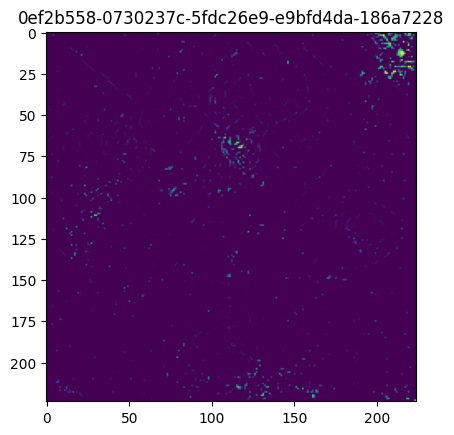

Step    1: Loss=0.114995 | Suff=0.000122 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059197 | Suff=0.000039 | Nec=0.000001 | L1=0.504068 | TV=0.877051 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057828 | Suff=0.000006 | Nec=0.000001 | L1=0.489914 | TV=0.883247 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056179 | Suff=0.000011 | Nec=0.000001 | L1=0.474574 | TV=0.871522 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053645 | Suff=0.000011 | Nec=0.000001 | L1=0.451627 | TV=0.847606 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.049766 | Suff=0.000011 | Nec=0.000002 | L1=0.417215 | TV=0.803801 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.044867 | Suff=0.000014 | Nec=0.000002 | L1=0.374451 | TV=0.741450 | Changed 

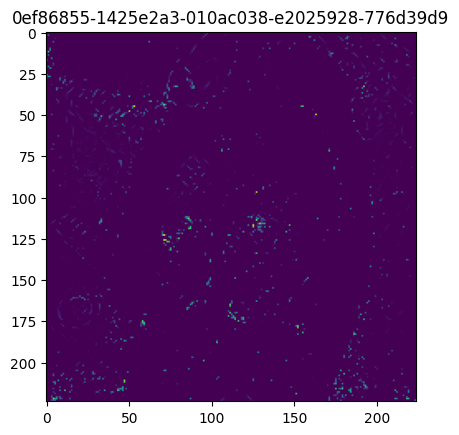

Step    1: Loss=0.115002 | Suff=0.000135 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061803 | Suff=0.002272 | Nec=0.000050 | L1=0.517827 | TV=0.885937 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059201 | Suff=0.000061 | Nec=0.000042 | L1=0.502506 | TV=0.889826 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057797 | Suff=0.000027 | Nec=0.000025 | L1=0.489625 | TV=0.880819 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055919 | Suff=0.000011 | Nec=0.000014 | L1=0.472720 | TV=0.863408 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053194 | Suff=0.000007 | Nec=0.000007 | L1=0.448555 | TV=0.833177 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.049601 | Suff=0.000008 | Nec=0.000005 | L1=0.417178 | TV=0.787688 | Changed 

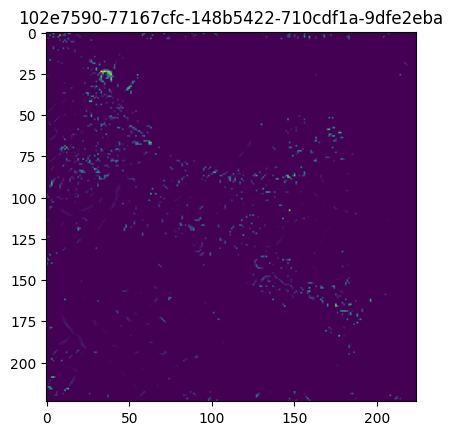

Step    1: Loss=0.115019 | Suff=0.000169 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061918 | Suff=0.000417 | Nec=0.000006 | L1=0.526123 | TV=0.909391 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060426 | Suff=0.000036 | Nec=0.000008 | L1=0.512574 | TV=0.914703 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059368 | Suff=0.000018 | Nec=0.000008 | L1=0.502463 | TV=0.910806 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057895 | Suff=0.000009 | Nec=0.000009 | L1=0.488877 | TV=0.899879 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055603 | Suff=0.000005 | Nec=0.000010 | L1=0.468277 | TV=0.876829 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052414 | Suff=0.000006 | Nec=0.000009 | L1=0.440213 | TV=0.838547 | Changed 

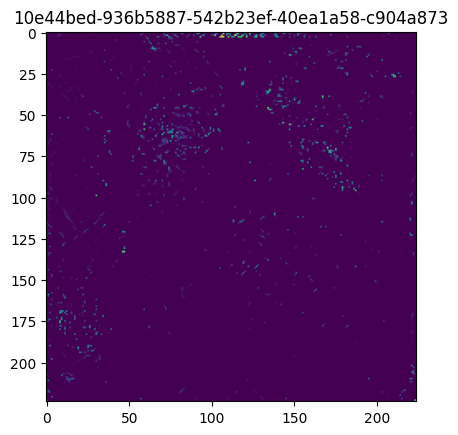

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062102 | Suff=0.001275 | Nec=0.000017 | L1=0.525890 | TV=0.886719 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060175 | Suff=0.000062 | Nec=0.000012 | L1=0.512183 | TV=0.891991 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059198 | Suff=0.000023 | Nec=0.000013 | L1=0.503084 | TV=0.887220 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058001 | Suff=0.000011 | Nec=0.000011 | L1=0.492113 | TV=0.877792 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056171 | Suff=0.000006 | Nec=0.000008 | L1=0.475685 | TV=0.859574 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053554 | Suff=0.000005 | Nec=0.000005 | L1=0.452626 | TV=0.828675 | Changed 

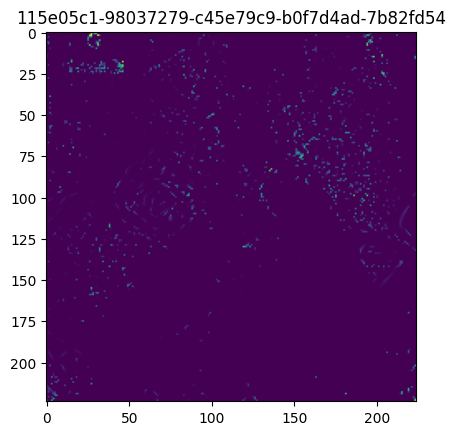

Step    1: Loss=0.114977 | Suff=0.000086 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061294 | Suff=0.000494 | Nec=0.000022 | L1=0.521503 | TV=0.888567 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059642 | Suff=0.000073 | Nec=0.000018 | L1=0.506386 | TV=0.895849 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058514 | Suff=0.000018 | Nec=0.000019 | L1=0.495965 | TV=0.889845 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057024 | Suff=0.000008 | Nec=0.000015 | L1=0.482365 | TV=0.877563 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054742 | Suff=0.000006 | Nec=0.000009 | L1=0.461927 | TV=0.854120 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.051520 | Suff=0.000007 | Nec=0.000007 | L1=0.433625 | TV=0.815031 | Changed 

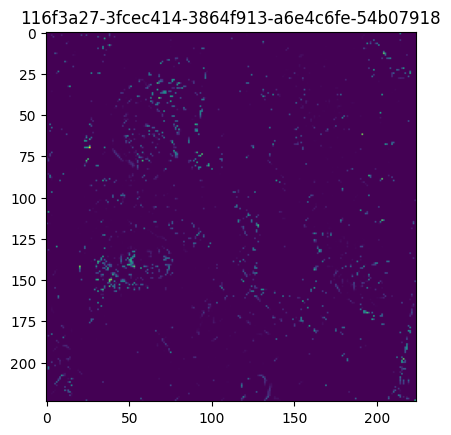

Step    1: Loss=0.102811 | Suff=0.000000 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.057067 | Suff=0.000336 | Nec=0.000000 | L1=0.481793 | TV=0.872008 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.053138 | Suff=0.000023 | Nec=0.000000 | L1=0.446290 | TV=0.849774 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.047261 | Suff=0.000019 | Nec=0.000000 | L1=0.393604 | TV=0.789069 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.038331 | Suff=0.000029 | Nec=0.000000 | L1=0.315886 | TV=0.672820 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.028204 | Suff=0.000037 | Nec=0.000001 | L1=0.229786 | TV=0.520584 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.019312 | Suff=0.000033 | Nec=0.000002 | L1=0.155630 | TV=0.373154 | Changed 

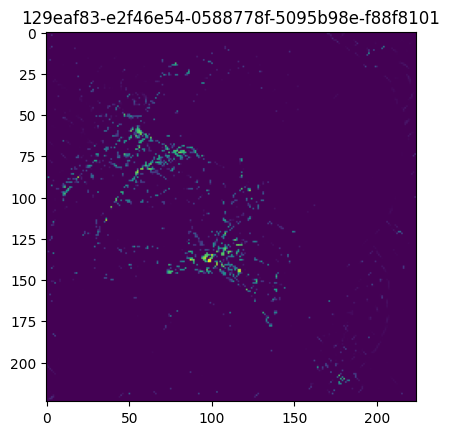

Step    1: Loss=0.102878 | Suff=0.000135 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061776 | Suff=0.003227 | Nec=0.000307 | L1=0.512950 | TV=0.871432 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058555 | Suff=0.000299 | Nec=0.000045 | L1=0.495667 | TV=0.881659 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057116 | Suff=0.000073 | Nec=0.000010 | L1=0.483072 | TV=0.876685 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054973 | Suff=0.000024 | Nec=0.000005 | L1=0.463529 | TV=0.860520 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051062 | Suff=0.000017 | Nec=0.000005 | L1=0.428862 | TV=0.816458 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.045543 | Suff=0.000029 | Nec=0.000006 | L1=0.380863 | TV=0.743937 | Changed 

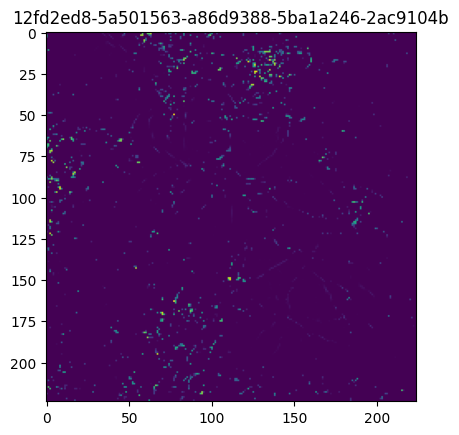

Step    1: Loss=0.114955 | Suff=0.000042 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060442 | Suff=0.000434 | Nec=0.000027 | L1=0.512170 | TV=0.899455 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059085 | Suff=0.000077 | Nec=0.000023 | L1=0.499995 | TV=0.903501 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057959 | Suff=0.000023 | Nec=0.000022 | L1=0.489591 | TV=0.897674 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056317 | Suff=0.000009 | Nec=0.000014 | L1=0.474651 | TV=0.884042 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053631 | Suff=0.000006 | Nec=0.000008 | L1=0.450692 | TV=0.855486 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.049837 | Suff=0.000008 | Nec=0.000006 | L1=0.417446 | TV=0.808516 | Changed 

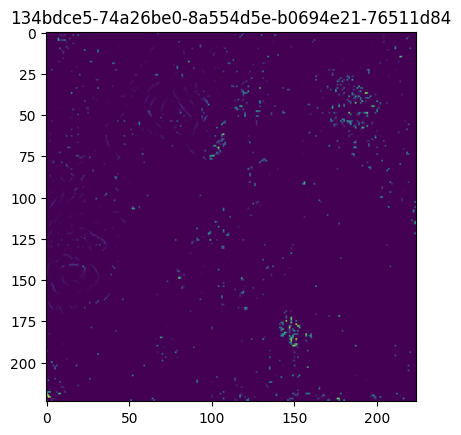

Step    1: Loss=0.115208 | Suff=0.000548 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061377 | Suff=0.000000 | Nec=0.001331 | L1=0.518597 | TV=0.885162 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059656 | Suff=0.000001 | Nec=0.000144 | L1=0.506731 | TV=0.891024 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058892 | Suff=0.000001 | Nec=0.000066 | L1=0.499741 | TV=0.888477 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057993 | Suff=0.000001 | Nec=0.000039 | L1=0.491557 | TV=0.881760 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056725 | Suff=0.000001 | Nec=0.000020 | L1=0.480145 | TV=0.869941 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054892 | Suff=0.000001 | Nec=0.000012 | L1=0.463912 | TV=0.849475 | Changed 

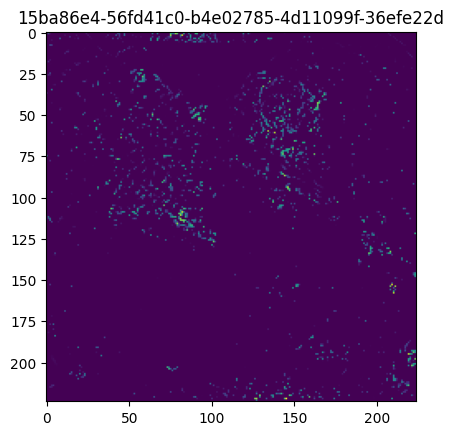

Step    1: Loss=0.113589 | Suff=0.021556 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.557171 | Suff=0.999699 | Nec=0.000000 | L1=0.484487 | TV=0.887328 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.062173 | Suff=0.011233 | Nec=0.000009 | L1=0.480830 | TV=0.846844 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055642 | Suff=0.000196 | Nec=0.000001 | L1=0.468466 | TV=0.869704 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053343 | Suff=0.000043 | Nec=0.000001 | L1=0.447945 | TV=0.852672 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.049697 | Suff=0.000019 | Nec=0.000001 | L1=0.415549 | TV=0.813189 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.044518 | Suff=0.000032 | Nec=0.000002 | L1=0.370425 | TV=0.745858 | Changed (

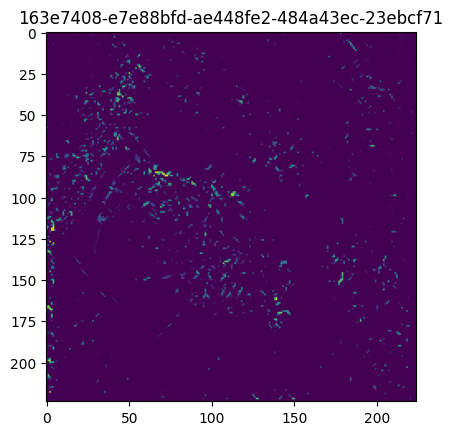

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061540 | Suff=0.001533 | Nec=0.000008 | L1=0.518986 | TV=0.887060 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059505 | Suff=0.000055 | Nec=0.000008 | L1=0.504979 | TV=0.897516 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058298 | Suff=0.000021 | Nec=0.000007 | L1=0.493599 | TV=0.892360 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056494 | Suff=0.000008 | Nec=0.000005 | L1=0.477127 | TV=0.877501 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053500 | Suff=0.000005 | Nec=0.000004 | L1=0.450485 | TV=0.844664 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.049339 | Suff=0.000009 | Nec=0.000005 | L1=0.414162 | TV=0.791639 | Changed 

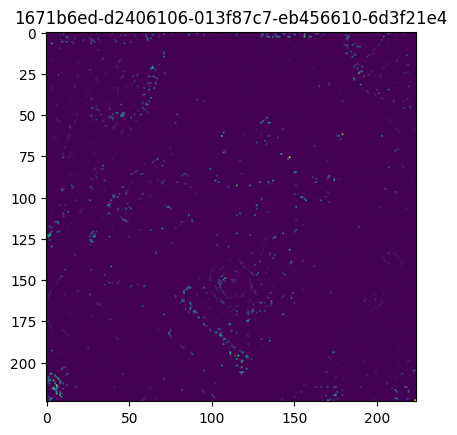

Step    1: Loss=0.114994 | Suff=0.000121 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061367 | Suff=0.002084 | Nec=0.000188 | L1=0.512679 | TV=0.896314 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059309 | Suff=0.000050 | Nec=0.000062 | L1=0.502213 | TV=0.903206 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058407 | Suff=0.000016 | Nec=0.000022 | L1=0.493953 | TV=0.899282 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057163 | Suff=0.000008 | Nec=0.000011 | L1=0.482595 | TV=0.889370 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055157 | Suff=0.000006 | Nec=0.000008 | L1=0.464547 | TV=0.869550 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052213 | Suff=0.000006 | Nec=0.000006 | L1=0.438600 | TV=0.834717 | Changed 

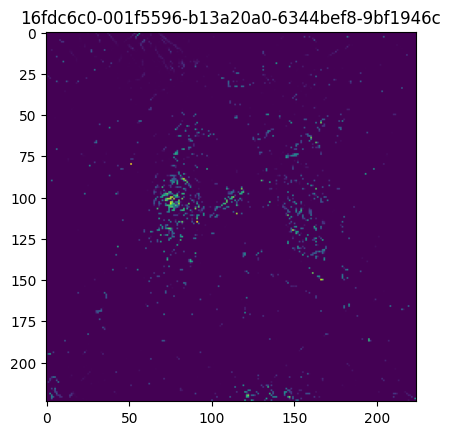

Step    1: Loss=0.115020 | Suff=0.000173 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062147 | Suff=0.003943 | Nec=0.000066 | L1=0.513219 | TV=0.882083 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058696 | Suff=0.000046 | Nec=0.000036 | L1=0.497390 | TV=0.891651 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057379 | Suff=0.000022 | Nec=0.000019 | L1=0.485174 | TV=0.884138 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055445 | Suff=0.000011 | Nec=0.000009 | L1=0.467588 | TV=0.867667 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052277 | Suff=0.000010 | Nec=0.000006 | L1=0.439402 | TV=0.832834 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.047918 | Suff=0.000014 | Nec=0.000006 | L1=0.401348 | TV=0.777280 | Changed 

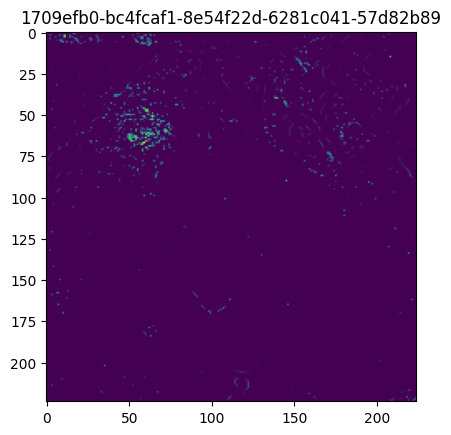

Step    1: Loss=0.102811 | Suff=0.000000 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061428 | Suff=0.002099 | Nec=0.000007 | L1=0.515790 | TV=0.879593 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058987 | Suff=0.000072 | Nec=0.000005 | L1=0.500186 | TV=0.892979 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057579 | Suff=0.000019 | Nec=0.000004 | L1=0.487025 | TV=0.886482 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055255 | Suff=0.000007 | Nec=0.000004 | L1=0.465812 | TV=0.866834 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051293 | Suff=0.000007 | Nec=0.000006 | L1=0.430629 | TV=0.822397 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.046035 | Suff=0.000016 | Nec=0.000007 | L1=0.384741 | TV=0.754960 | Changed 

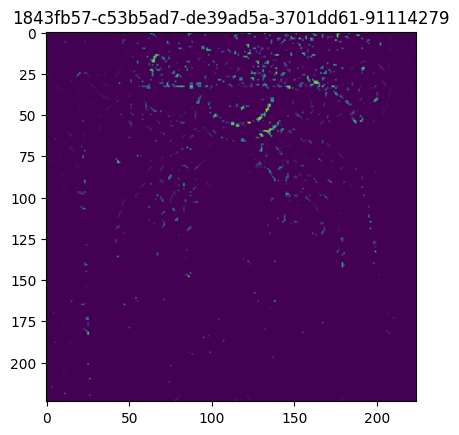

Step    1: Loss=0.102851 | Suff=0.000080 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.054452 | Suff=0.000025 | Nec=0.000003 | L1=0.459594 | TV=0.847860 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.048581 | Suff=0.000011 | Nec=0.000001 | L1=0.405358 | TV=0.803946 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.038670 | Suff=0.000016 | Nec=0.000000 | L1=0.318346 | TV=0.682692 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.026289 | Suff=0.000027 | Nec=0.000001 | L1=0.213254 | TV=0.495015 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.015779 | Suff=0.000028 | Nec=0.000000 | L1=0.126181 | TV=0.314701 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.008836 | Suff=0.000022 | Nec=0.000002 | L1=0.069685 | TV=0.185552 | Changed 

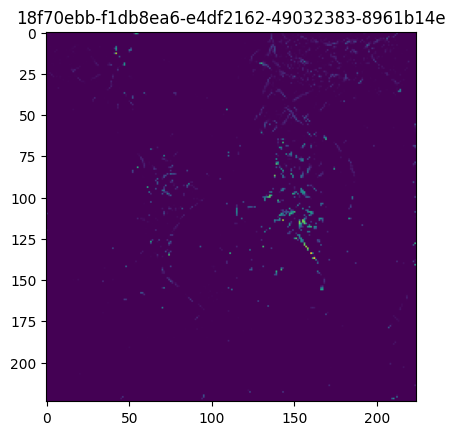

Step    1: Loss=0.114943 | Suff=0.000019 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060821 | Suff=0.001014 | Nec=0.000001 | L1=0.514736 | TV=0.883943 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058791 | Suff=0.000047 | Nec=0.000002 | L1=0.498614 | TV=0.890531 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057389 | Suff=0.000017 | Nec=0.000002 | L1=0.485567 | TV=0.882301 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055379 | Suff=0.000007 | Nec=0.000002 | L1=0.467316 | TV=0.864282 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052306 | Suff=0.000004 | Nec=0.000003 | L1=0.440043 | TV=0.829813 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048197 | Suff=0.000005 | Nec=0.000003 | L1=0.404220 | TV=0.777091 | Changed 

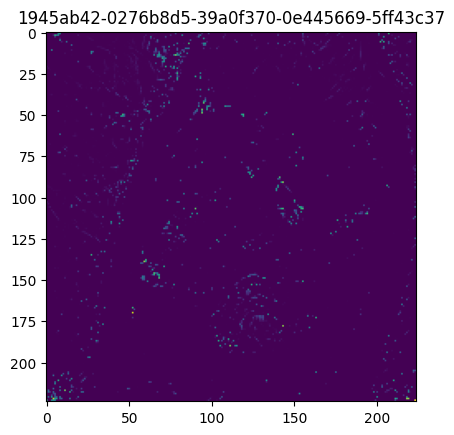

Step    1: Loss=0.115043 | Suff=0.000218 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060910 | Suff=0.000112 | Nec=0.000036 | L1=0.519941 | TV=0.884181 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059069 | Suff=0.000044 | Nec=0.000021 | L1=0.501416 | TV=0.889508 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057083 | Suff=0.000007 | Nec=0.000009 | L1=0.482935 | TV=0.878210 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053710 | Suff=0.000004 | Nec=0.000004 | L1=0.452449 | TV=0.846134 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.048326 | Suff=0.000010 | Nec=0.000004 | L1=0.405119 | TV=0.780693 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.041716 | Suff=0.000015 | Nec=0.000005 | L1=0.347897 | TV=0.691638 | Changed 

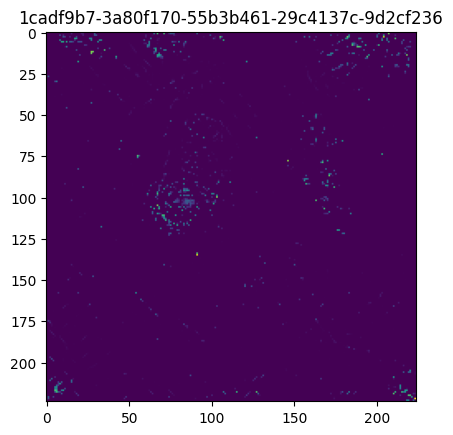

Step    1: Loss=0.115024 | Suff=0.000180 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059706 | Suff=0.000843 | Nec=0.000070 | L1=0.505326 | TV=0.871714 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057618 | Suff=0.000018 | Nec=0.000018 | L1=0.488248 | TV=0.877514 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055366 | Suff=0.000006 | Nec=0.000009 | L1=0.467385 | TV=0.862015 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.051642 | Suff=0.000004 | Nec=0.000005 | L1=0.433869 | TV=0.825035 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.046083 | Suff=0.000008 | Nec=0.000006 | L1=0.385032 | TV=0.757264 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.039514 | Suff=0.000011 | Nec=0.000008 | L1=0.328262 | TV=0.667830 | Changed 

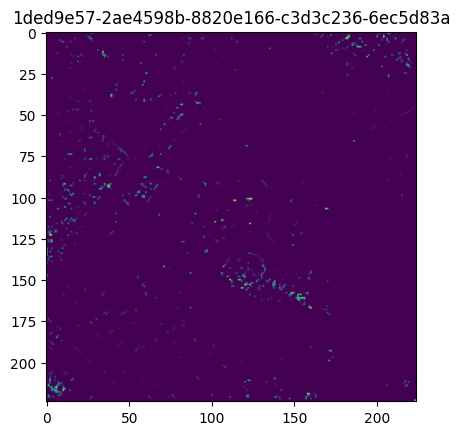

Step    1: Loss=0.103451 | Suff=0.001280 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059675 | Suff=0.000993 | Nec=0.000000 | L1=0.503794 | TV=0.879950 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058463 | Suff=0.000132 | Nec=0.000000 | L1=0.494168 | TV=0.897992 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057475 | Suff=0.000043 | Nec=0.000000 | L1=0.485195 | TV=0.893342 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055951 | Suff=0.000019 | Nec=0.000000 | L1=0.471260 | TV=0.881524 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053479 | Suff=0.000013 | Nec=0.000000 | L1=0.448989 | TV=0.857396 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050000 | Suff=0.000015 | Nec=0.000000 | L1=0.418248 | TV=0.816760 | Changed 

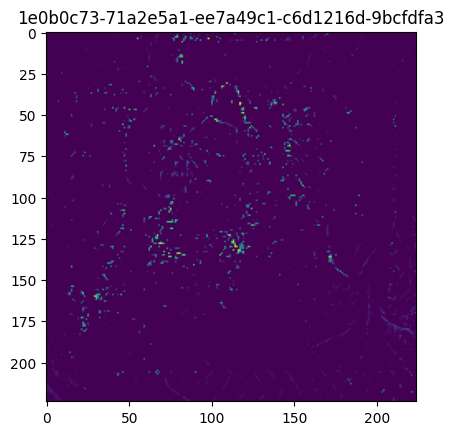

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.057246 | Suff=0.000017 | Nec=0.000010 | L1=0.488663 | TV=0.836660 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.051233 | Suff=0.000008 | Nec=0.000010 | L1=0.433516 | TV=0.787305 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.043053 | Suff=0.000021 | Nec=0.000021 | L1=0.360794 | TV=0.695278 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.033408 | Suff=0.000016 | Nec=0.000018 | L1=0.276987 | TV=0.569188 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.024435 | Suff=0.000023 | Nec=0.000023 | L1=0.200533 | TV=0.435894 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.017509 | Suff=0.000018 | Nec=0.000025 | L1=0.142468 | TV=0.324117 | Changed 

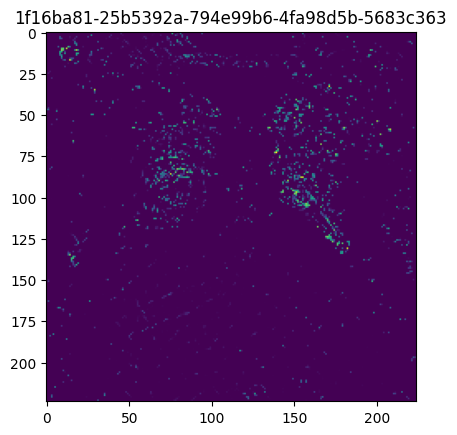

Step    1: Loss=0.115070 | Suff=0.000273 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060530 | Suff=0.000085 | Nec=0.000070 | L1=0.515531 | TV=0.889941 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059417 | Suff=0.000079 | Nec=0.000057 | L1=0.504555 | TV=0.889347 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058378 | Suff=0.000032 | Nec=0.000036 | L1=0.495099 | TV=0.883408 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056878 | Suff=0.000011 | Nec=0.000021 | L1=0.481509 | TV=0.871107 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054619 | Suff=0.000006 | Nec=0.000011 | L1=0.461165 | TV=0.849410 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.051550 | Suff=0.000005 | Nec=0.000007 | L1=0.433945 | TV=0.814982 | Changed 

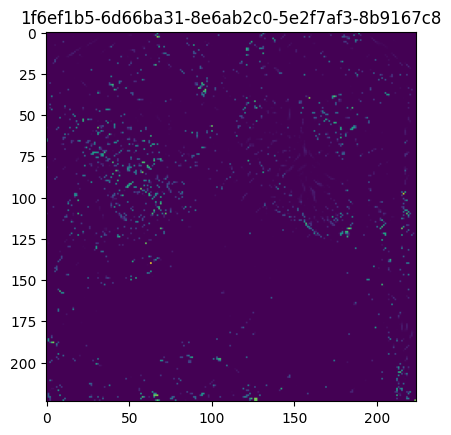

Step    1: Loss=0.115036 | Suff=0.000204 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060845 | Suff=0.000966 | Nec=0.000001 | L1=0.514305 | TV=0.893077 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059021 | Suff=0.000061 | Nec=0.000001 | L1=0.500151 | TV=0.897544 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057588 | Suff=0.000021 | Nec=0.000001 | L1=0.486855 | TV=0.889188 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055498 | Suff=0.000010 | Nec=0.000001 | L1=0.467943 | TV=0.869769 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052349 | Suff=0.000006 | Nec=0.000001 | L1=0.439995 | TV=0.834577 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048238 | Suff=0.000010 | Nec=0.000001 | L1=0.404117 | TV=0.782121 | Changed 

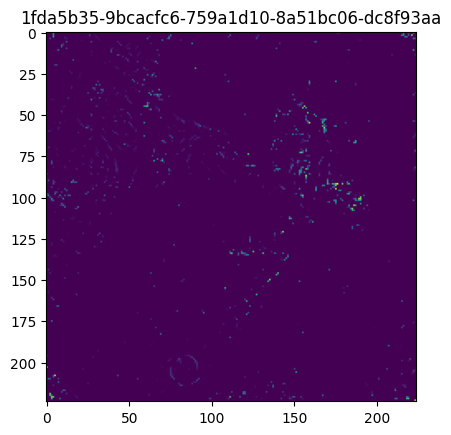

Step    1: Loss=0.114940 | Suff=0.000012 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061518 | Suff=0.000011 | Nec=0.000280 | L1=0.524761 | TV=0.889675 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060311 | Suff=0.000091 | Nec=0.000099 | L1=0.512192 | TV=0.899639 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059644 | Suff=0.000078 | Nec=0.000045 | L1=0.505941 | TV=0.898883 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058863 | Suff=0.000027 | Nec=0.000019 | L1=0.498956 | TV=0.894456 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057685 | Suff=0.000008 | Nec=0.000009 | L1=0.488349 | TV=0.884228 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055833 | Suff=0.000003 | Nec=0.000006 | L1=0.471946 | TV=0.863383 | Changed 

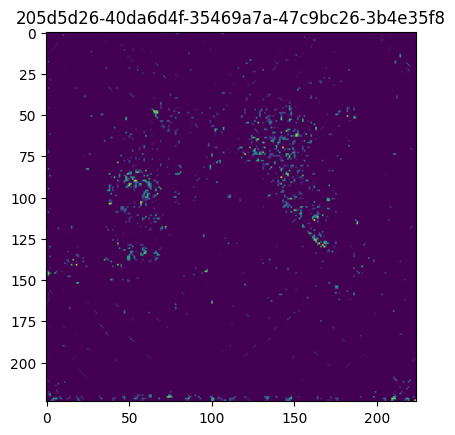

Step    1: Loss=0.115023 | Suff=0.000177 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061849 | Suff=0.003481 | Nec=0.000033 | L1=0.512296 | TV=0.886216 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058713 | Suff=0.000071 | Nec=0.000025 | L1=0.497289 | TV=0.893628 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057279 | Suff=0.000032 | Nec=0.000019 | L1=0.484068 | TV=0.884705 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055278 | Suff=0.000017 | Nec=0.000012 | L1=0.466017 | TV=0.866184 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052357 | Suff=0.000011 | Nec=0.000007 | L1=0.440152 | TV=0.833256 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048574 | Suff=0.000012 | Nec=0.000005 | L1=0.407171 | TV=0.784796 | Changed 

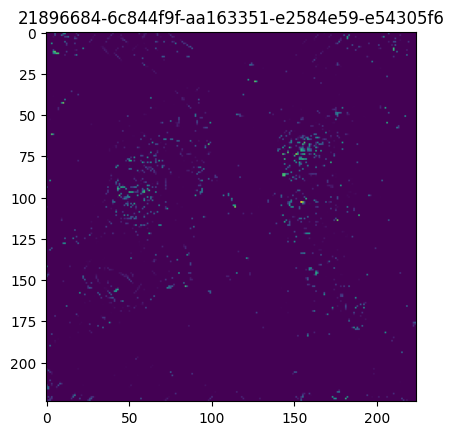

Step    1: Loss=0.102812 | Suff=0.000002 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058573 | Suff=0.000355 | Nec=0.000011 | L1=0.495359 | TV=0.885414 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057114 | Suff=0.000088 | Nec=0.000005 | L1=0.482139 | TV=0.885333 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055171 | Suff=0.000020 | Nec=0.000004 | L1=0.464716 | TV=0.868788 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.052206 | Suff=0.000012 | Nec=0.000004 | L1=0.438185 | TV=0.837897 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.047891 | Suff=0.000017 | Nec=0.000003 | L1=0.400134 | TV=0.786804 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.042680 | Suff=0.000030 | Nec=0.000002 | L1=0.354828 | TV=0.718173 | Changed 

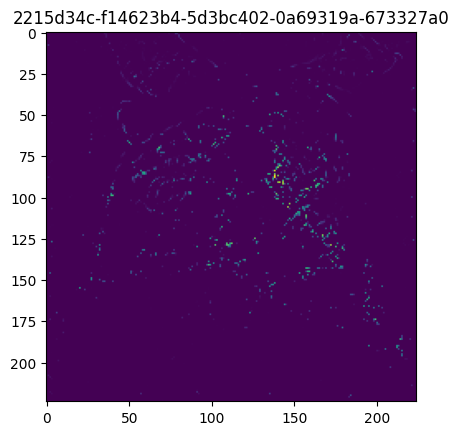

Step    1: Loss=0.114937 | Suff=0.000006 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060668 | Suff=0.000330 | Nec=0.000083 | L1=0.515266 | TV=0.893442 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059137 | Suff=0.000119 | Nec=0.000087 | L1=0.500503 | TV=0.898334 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057896 | Suff=0.000024 | Nec=0.000053 | L1=0.489500 | TV=0.890785 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056276 | Suff=0.000010 | Nec=0.000020 | L1=0.475020 | TV=0.875869 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053866 | Suff=0.000006 | Nec=0.000009 | L1=0.453632 | TV=0.849562 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050548 | Suff=0.000005 | Nec=0.000007 | L1=0.424643 | TV=0.807750 | Changed 

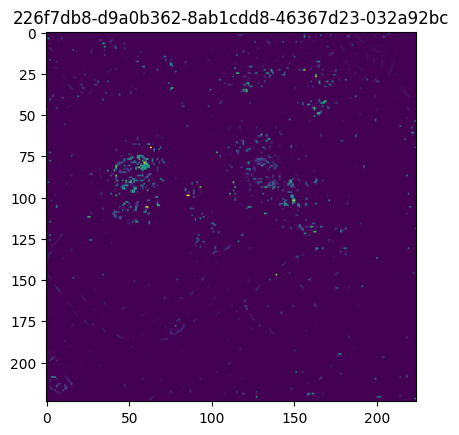

Step    1: Loss=0.121112 | Suff=0.012357 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059527 | Suff=0.000000 | Nec=0.000007 | L1=0.508156 | TV=0.870797 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058041 | Suff=0.000000 | Nec=0.000009 | L1=0.492498 | TV=0.878583 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056359 | Suff=0.000001 | Nec=0.000009 | L1=0.476811 | TV=0.867249 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053851 | Suff=0.000002 | Nec=0.000007 | L1=0.454284 | TV=0.841897 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050109 | Suff=0.000002 | Nec=0.000004 | L1=0.421434 | TV=0.796286 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.045398 | Suff=0.000003 | Nec=0.000003 | L1=0.380651 | TV=0.732960 | Changed 

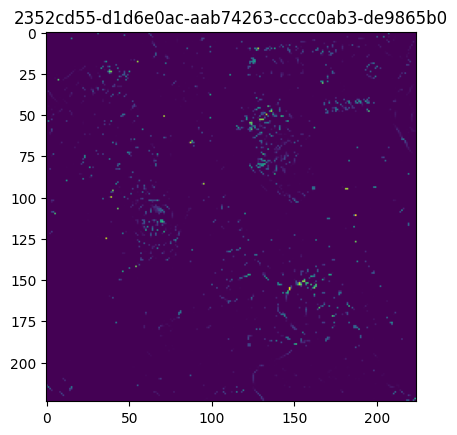

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059958 | Suff=0.000379 | Nec=0.000051 | L1=0.508169 | TV=0.892600 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058209 | Suff=0.000038 | Nec=0.000021 | L1=0.492393 | TV=0.894047 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056472 | Suff=0.000019 | Nec=0.000014 | L1=0.476496 | TV=0.880636 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054004 | Suff=0.000009 | Nec=0.000010 | L1=0.454338 | TV=0.856054 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050403 | Suff=0.000007 | Nec=0.000007 | L1=0.422584 | TV=0.813695 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.045826 | Suff=0.000016 | Nec=0.000006 | L1=0.382799 | TV=0.753519 | Changed 

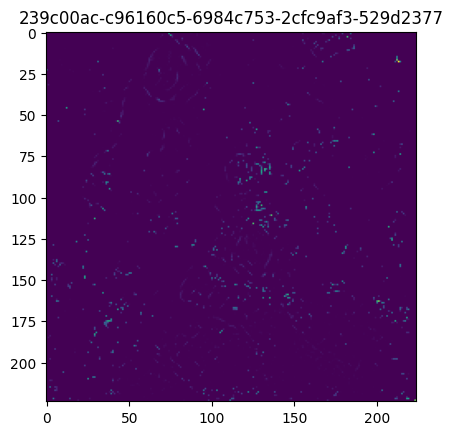

Step    1: Loss=0.114937 | Suff=0.000005 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061720 | Suff=0.002149 | Nec=0.000048 | L1=0.516803 | TV=0.894118 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059508 | Suff=0.000062 | Nec=0.000030 | L1=0.504411 | TV=0.902036 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058443 | Suff=0.000024 | Nec=0.000020 | L1=0.494473 | TV=0.897451 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056926 | Suff=0.000010 | Nec=0.000012 | L1=0.480582 | TV=0.885707 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054458 | Suff=0.000006 | Nec=0.000007 | L1=0.458448 | TV=0.860649 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050957 | Suff=0.000008 | Nec=0.000005 | L1=0.427663 | TV=0.818473 | Changed 

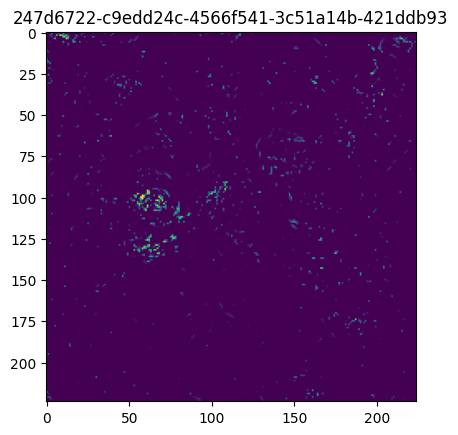

Step    1: Loss=0.114942 | Suff=0.000016 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062579 | Suff=0.002702 | Nec=0.000002 | L1=0.522263 | TV=0.900091 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060156 | Suff=0.000044 | Nec=0.000003 | L1=0.510413 | TV=0.909128 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059194 | Suff=0.000021 | Nec=0.000004 | L1=0.501237 | TV=0.905814 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057809 | Suff=0.000010 | Nec=0.000005 | L1=0.488534 | TV=0.894771 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055805 | Suff=0.000005 | Nec=0.000006 | L1=0.470620 | TV=0.873736 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053134 | Suff=0.000004 | Nec=0.000006 | L1=0.447151 | TV=0.841401 | Changed 

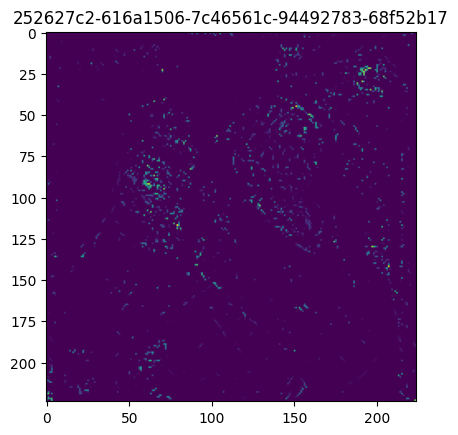

Step    1: Loss=0.114942 | Suff=0.000017 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062869 | Suff=0.004940 | Nec=0.000000 | L1=0.514165 | TV=0.898213 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059199 | Suff=0.000049 | Nec=0.000000 | L1=0.501168 | TV=0.905746 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058180 | Suff=0.000027 | Nec=0.000000 | L1=0.491531 | TV=0.901308 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056846 | Suff=0.000013 | Nec=0.000000 | L1=0.479329 | TV=0.890618 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054903 | Suff=0.000006 | Nec=0.000000 | L1=0.461956 | TV=0.870418 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052193 | Suff=0.000005 | Nec=0.000001 | L1=0.438164 | TV=0.837361 | Changed 

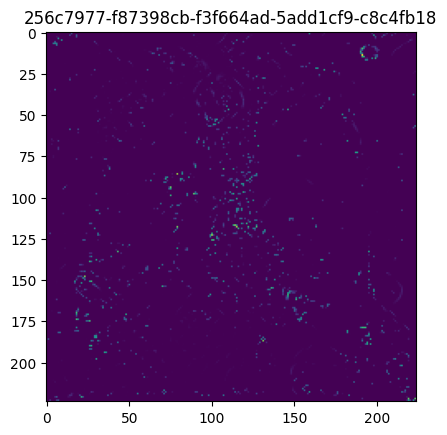

Step    1: Loss=0.114983 | Suff=0.000098 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060540 | Suff=0.000000 | Nec=0.000300 | L1=0.515244 | TV=0.886577 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058323 | Suff=0.000000 | Nec=0.000027 | L1=0.494657 | TV=0.884419 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056156 | Suff=0.000000 | Nec=0.000008 | L1=0.474667 | TV=0.868528 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.052830 | Suff=0.000000 | Nec=0.000007 | L1=0.444746 | TV=0.835243 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.047957 | Suff=0.000000 | Nec=0.000008 | L1=0.401902 | TV=0.776226 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.042171 | Suff=0.000000 | Nec=0.000011 | L1=0.351715 | TV=0.699429 | Changed 

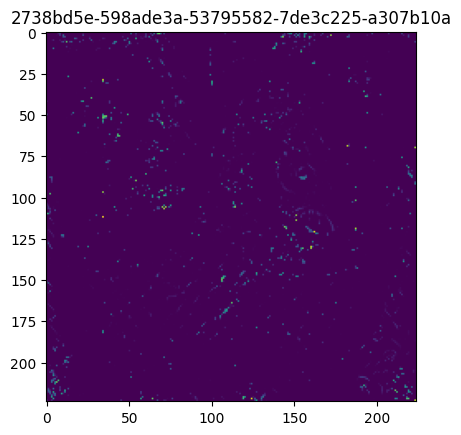

Step    1: Loss=0.115172 | Suff=0.000476 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061197 | Suff=0.000165 | Nec=0.000001 | L1=0.522402 | TV=0.887312 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059870 | Suff=0.000162 | Nec=0.000002 | L1=0.507970 | TV=0.899071 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058918 | Suff=0.000021 | Nec=0.000002 | L1=0.499466 | TV=0.896013 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057738 | Suff=0.000007 | Nec=0.000002 | L1=0.488627 | TV=0.887068 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055891 | Suff=0.000003 | Nec=0.000002 | L1=0.472045 | TV=0.868397 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053202 | Suff=0.000003 | Nec=0.000002 | L1=0.448403 | TV=0.835952 | Changed 

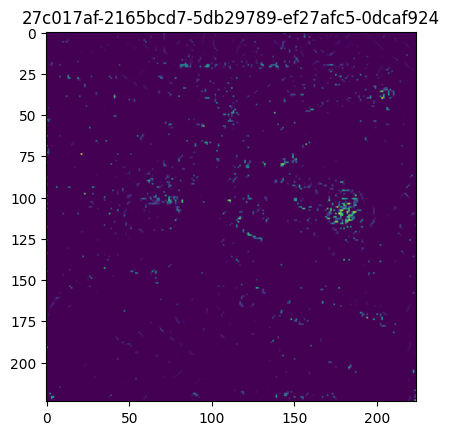

Step    1: Loss=0.115085 | Suff=0.000302 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062005 | Suff=0.000004 | Nec=0.000187 | L1=0.528840 | TV=0.902538 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060794 | Suff=0.000014 | Nec=0.000089 | L1=0.516442 | TV=0.909884 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.060061 | Suff=0.000016 | Nec=0.000046 | L1=0.509424 | TV=0.908723 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.059151 | Suff=0.000015 | Nec=0.000023 | L1=0.500986 | TV=0.903301 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057823 | Suff=0.000009 | Nec=0.000012 | L1=0.488996 | TV=0.891348 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055891 | Suff=0.000005 | Nec=0.000008 | L1=0.471896 | TV=0.869540 | Changed 

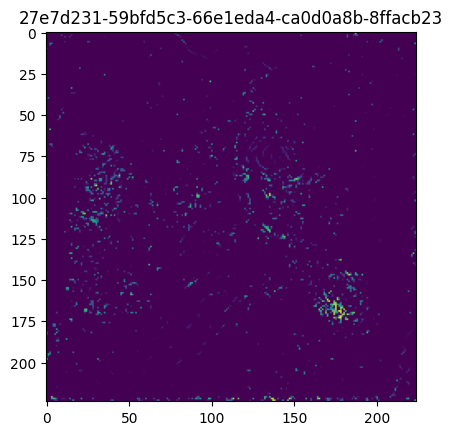

Step    1: Loss=0.114966 | Suff=0.000064 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062198 | Suff=0.002755 | Nec=0.000001 | L1=0.519113 | TV=0.890847 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059765 | Suff=0.000092 | Nec=0.000001 | L1=0.507275 | TV=0.899118 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058887 | Suff=0.000024 | Nec=0.000001 | L1=0.499228 | TV=0.895187 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057707 | Suff=0.000008 | Nec=0.000001 | L1=0.488411 | TV=0.886150 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055763 | Suff=0.000004 | Nec=0.000002 | L1=0.470907 | TV=0.866902 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052855 | Suff=0.000005 | Nec=0.000002 | L1=0.445282 | TV=0.832334 | Changed 

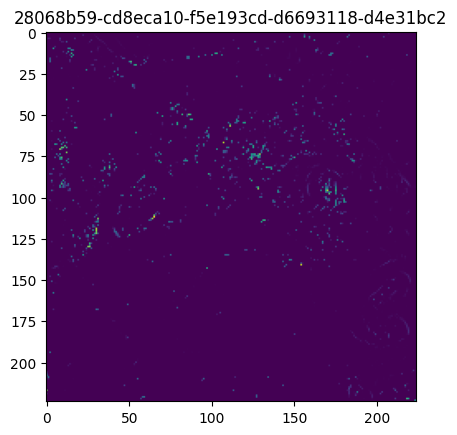

Step    1: Loss=0.114962 | Suff=0.000057 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061500 | Suff=0.001767 | Nec=0.000010 | L1=0.518847 | TV=0.872709 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059056 | Suff=0.000065 | Nec=0.000016 | L1=0.502351 | TV=0.878094 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057535 | Suff=0.000020 | Nec=0.000014 | L1=0.488264 | TV=0.869101 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055476 | Suff=0.000010 | Nec=0.000012 | L1=0.469558 | TV=0.850911 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052495 | Suff=0.000008 | Nec=0.000008 | L1=0.443081 | TV=0.817867 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048629 | Suff=0.000010 | Nec=0.000005 | L1=0.409304 | TV=0.769136 | Changed 

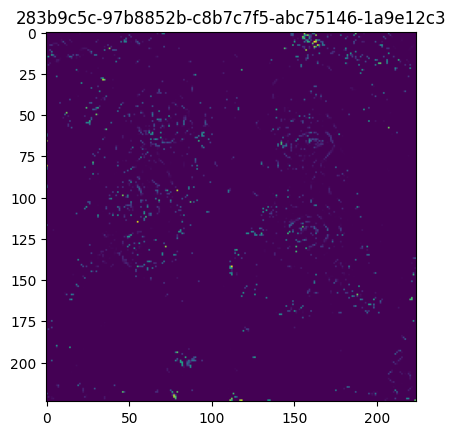

Step    1: Loss=0.114936 | Suff=0.000004 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060176 | Suff=0.000133 | Nec=0.000059 | L1=0.510951 | TV=0.898520 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058658 | Suff=0.000053 | Nec=0.000039 | L1=0.495839 | TV=0.902813 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057143 | Suff=0.000029 | Nec=0.000020 | L1=0.481868 | TV=0.893185 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054991 | Suff=0.000009 | Nec=0.000011 | L1=0.462582 | TV=0.872260 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051780 | Suff=0.000004 | Nec=0.000006 | L1=0.434238 | TV=0.835085 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.047586 | Suff=0.000010 | Nec=0.000005 | L1=0.397723 | TV=0.780666 | Changed 

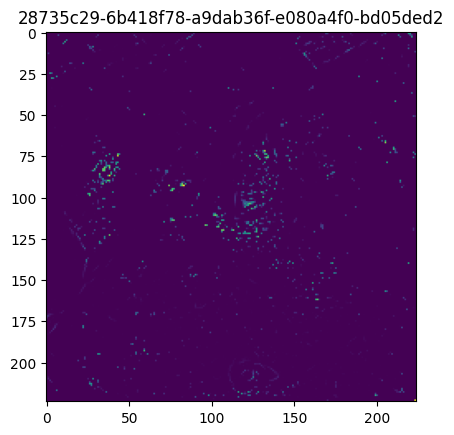

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059188 | Suff=0.000207 | Nec=0.000000 | L1=0.504001 | TV=0.868472 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.056786 | Suff=0.000021 | Nec=0.000000 | L1=0.481267 | TV=0.864841 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.053847 | Suff=0.000007 | Nec=0.000001 | L1=0.454501 | TV=0.839299 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.049107 | Suff=0.000006 | Nec=0.000000 | L1=0.412397 | TV=0.786450 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.042525 | Suff=0.000011 | Nec=0.000000 | L1=0.355131 | TV=0.700578 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.035261 | Suff=0.000008 | Nec=0.000001 | L1=0.292796 | TV=0.597741 | Changed 

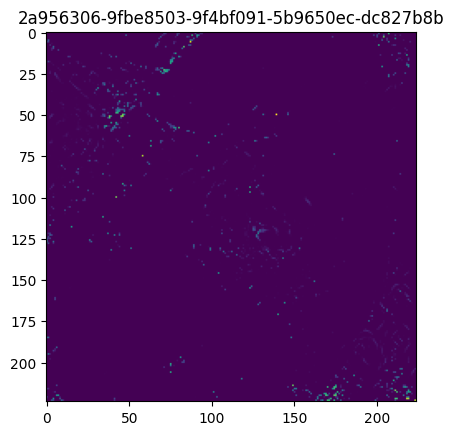

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061534 | Suff=0.000003 | Nec=0.000030 | L1=0.526144 | TV=0.890292 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060304 | Suff=0.000075 | Nec=0.000018 | L1=0.512436 | TV=0.901395 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059509 | Suff=0.000085 | Nec=0.000015 | L1=0.504595 | TV=0.899912 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058451 | Suff=0.000035 | Nec=0.000014 | L1=0.494994 | TV=0.892691 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056909 | Suff=0.000011 | Nec=0.000012 | L1=0.481165 | TV=0.878085 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054723 | Suff=0.000005 | Nec=0.000008 | L1=0.461916 | TV=0.852538 | Changed 

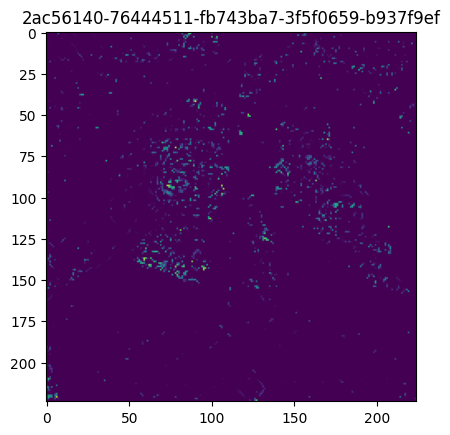

Step    1: Loss=0.114994 | Suff=0.000120 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058053 | Suff=0.000000 | Nec=0.000005 | L1=0.493597 | TV=0.869110 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.056507 | Suff=0.000000 | Nec=0.000011 | L1=0.478014 | TV=0.869977 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.054182 | Suff=0.000000 | Nec=0.000011 | L1=0.456872 | TV=0.848953 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.050814 | Suff=0.000001 | Nec=0.000007 | L1=0.426986 | TV=0.811209 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.046316 | Suff=0.000001 | Nec=0.000003 | L1=0.387585 | TV=0.755547 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.041113 | Suff=0.000001 | Nec=0.000002 | L1=0.342484 | TV=0.686330 | Changed 

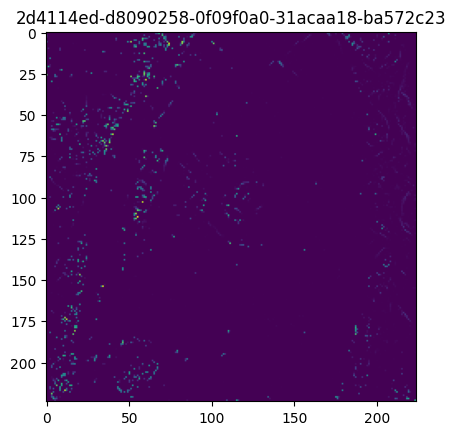

Step    1: Loss=0.102811 | Suff=0.000001 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058739 | Suff=0.000121 | Nec=0.000001 | L1=0.498651 | TV=0.881261 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057459 | Suff=0.000063 | Nec=0.000001 | L1=0.485449 | TV=0.888164 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055673 | Suff=0.000017 | Nec=0.000001 | L1=0.469102 | TV=0.875387 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.052767 | Suff=0.000009 | Nec=0.000001 | L1=0.443065 | TV=0.845540 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.048254 | Suff=0.000007 | Nec=0.000001 | L1=0.403471 | TV=0.790238 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.042606 | Suff=0.000011 | Nec=0.000001 | L1=0.354634 | TV=0.713623 | Changed 

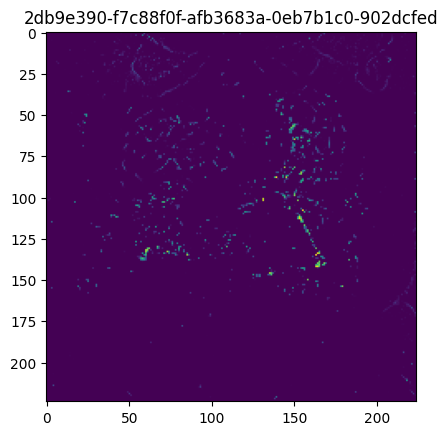

Step    1: Loss=0.115023 | Suff=0.000177 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060975 | Suff=0.000144 | Nec=0.000001 | L1=0.520832 | TV=0.881973 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059542 | Suff=0.000138 | Nec=0.000004 | L1=0.505629 | TV=0.890780 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058432 | Suff=0.000021 | Nec=0.000006 | L1=0.495649 | TV=0.885430 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057059 | Suff=0.000008 | Nec=0.000007 | L1=0.483130 | TV=0.873816 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054895 | Suff=0.000004 | Nec=0.000007 | L1=0.463799 | TV=0.850947 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.051803 | Suff=0.000003 | Nec=0.000006 | L1=0.436725 | TV=0.812624 | Changed 

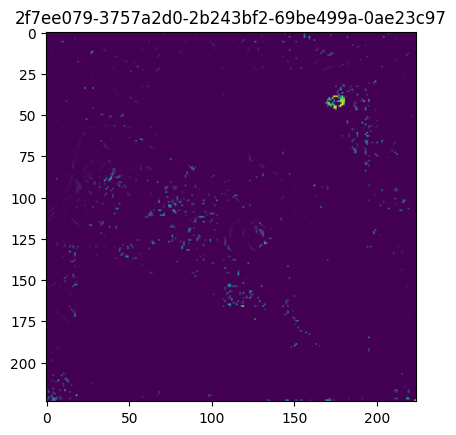

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061523 | Suff=0.001918 | Nec=0.000002 | L1=0.516268 | TV=0.893647 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059287 | Suff=0.000064 | Nec=0.000002 | L1=0.502656 | TV=0.898855 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058110 | Suff=0.000025 | Nec=0.000003 | L1=0.491726 | TV=0.892374 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056522 | Suff=0.000009 | Nec=0.000004 | L1=0.477235 | TV=0.879176 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054019 | Suff=0.000005 | Nec=0.000006 | L1=0.454887 | TV=0.852550 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050503 | Suff=0.000006 | Nec=0.000004 | L1=0.424084 | TV=0.808968 | Changed 

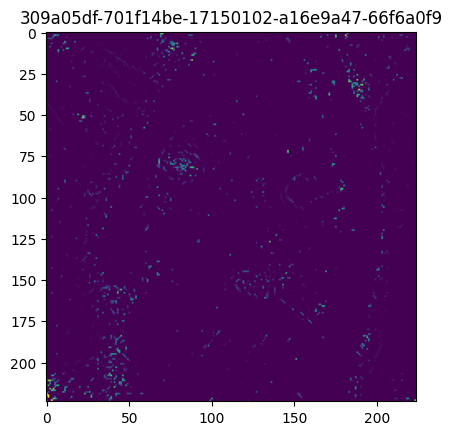

Step    1: Loss=0.114945 | Suff=0.000022 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062543 | Suff=0.002918 | Nec=0.000356 | L1=0.522652 | TV=0.864041 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059742 | Suff=0.000098 | Nec=0.000136 | L1=0.508539 | TV=0.877049 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058990 | Suff=0.000030 | Nec=0.000051 | L1=0.501846 | TV=0.876533 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058137 | Suff=0.000011 | Nec=0.000025 | L1=0.493948 | TV=0.872505 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056620 | Suff=0.000004 | Nec=0.000015 | L1=0.480146 | TV=0.859549 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054068 | Suff=0.000002 | Nec=0.000016 | L1=0.457572 | TV=0.830134 | Changed 

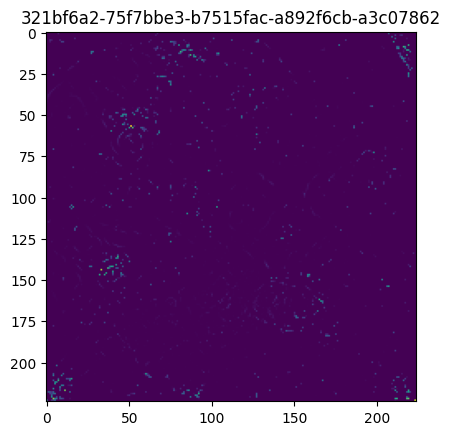

Step    1: Loss=0.115029 | Suff=0.000191 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060712 | Suff=0.000029 | Nec=0.000033 | L1=0.520164 | TV=0.866454 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059200 | Suff=0.000227 | Nec=0.000007 | L1=0.503130 | TV=0.877027 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057696 | Suff=0.000026 | Nec=0.000006 | L1=0.489841 | TV=0.869501 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055718 | Suff=0.000006 | Nec=0.000006 | L1=0.471951 | TV=0.851733 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052789 | Suff=0.000003 | Nec=0.000005 | L1=0.445964 | TV=0.818842 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048911 | Suff=0.000003 | Nec=0.000003 | L1=0.412105 | TV=0.769689 | Changed 

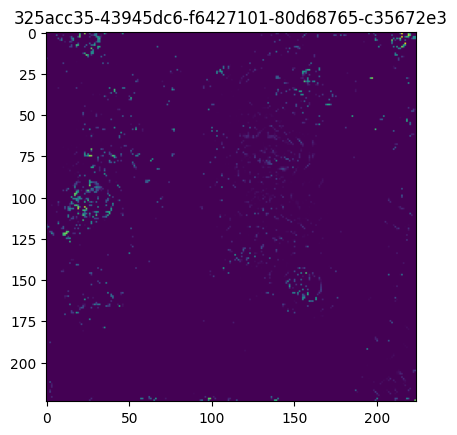

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061381 | Suff=0.000017 | Nec=0.000007 | L1=0.524834 | TV=0.888582 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060127 | Suff=0.000112 | Nec=0.000007 | L1=0.511227 | TV=0.894478 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059195 | Suff=0.000080 | Nec=0.000007 | L1=0.502466 | TV=0.890498 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057998 | Suff=0.000025 | Nec=0.000007 | L1=0.491743 | TV=0.880804 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056332 | Suff=0.000008 | Nec=0.000007 | L1=0.476856 | TV=0.863887 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054040 | Suff=0.000004 | Nec=0.000006 | L1=0.456651 | TV=0.837042 | Changed 

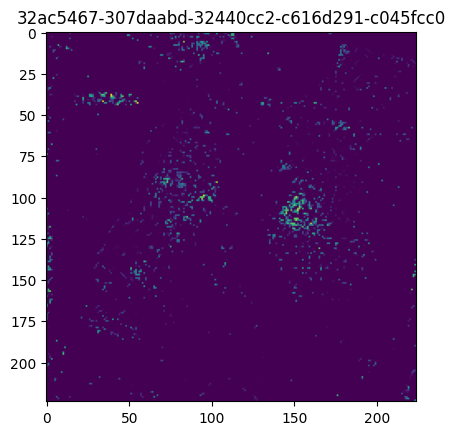

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061992 | Suff=0.001506 | Nec=0.000001 | L1=0.522110 | TV=0.902766 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059832 | Suff=0.000050 | Nec=0.000002 | L1=0.507212 | TV=0.908439 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058525 | Suff=0.000018 | Nec=0.000002 | L1=0.495035 | TV=0.901151 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056731 | Suff=0.000011 | Nec=0.000001 | L1=0.478718 | TV=0.885333 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054143 | Suff=0.000008 | Nec=0.000001 | L1=0.455696 | TV=0.856854 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050730 | Suff=0.000008 | Nec=0.000001 | L1=0.425859 | TV=0.813975 | Changed 

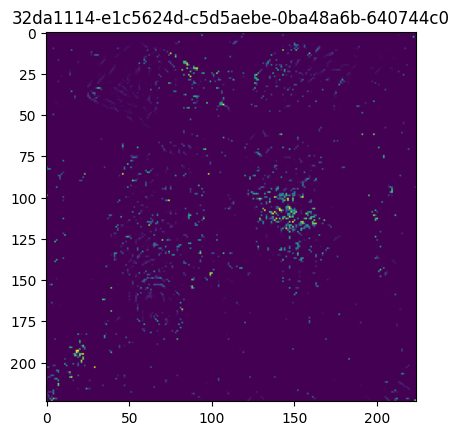

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061244 | Suff=0.001633 | Nec=0.000011 | L1=0.514691 | TV=0.895263 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059062 | Suff=0.000049 | Nec=0.000005 | L1=0.500208 | TV=0.901375 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057715 | Suff=0.000013 | Nec=0.000006 | L1=0.487768 | TV=0.892880 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055870 | Suff=0.000007 | Nec=0.000005 | L1=0.471046 | TV=0.875967 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053137 | Suff=0.000005 | Nec=0.000005 | L1=0.446776 | TV=0.845453 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.049515 | Suff=0.000006 | Nec=0.000004 | L1=0.415101 | TV=0.799946 | Changed 

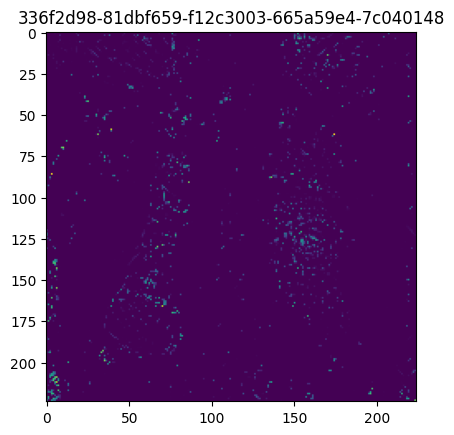

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062043 | Suff=0.003046 | Nec=0.000003 | L1=0.516354 | TV=0.888337 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059389 | Suff=0.000068 | Nec=0.000002 | L1=0.503820 | TV=0.897189 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058408 | Suff=0.000024 | Nec=0.000002 | L1=0.494671 | TV=0.892757 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057079 | Suff=0.000010 | Nec=0.000003 | L1=0.482512 | TV=0.882104 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055055 | Suff=0.000005 | Nec=0.000003 | L1=0.464335 | TV=0.861679 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052137 | Suff=0.000005 | Nec=0.000003 | L1=0.438684 | TV=0.826425 | Changed 

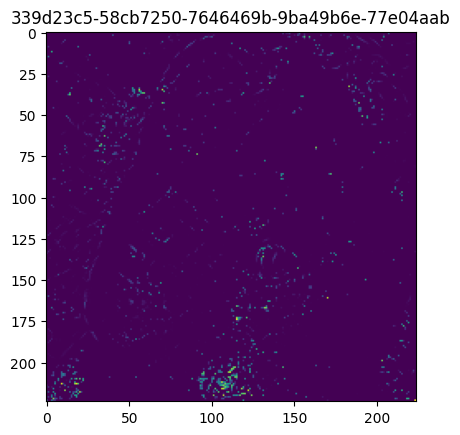

Step    1: Loss=0.114936 | Suff=0.000004 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061376 | Suff=0.000008 | Nec=0.000011 | L1=0.524385 | TV=0.892786 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060225 | Suff=0.000062 | Nec=0.000010 | L1=0.511801 | TV=0.900889 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059356 | Suff=0.000053 | Nec=0.000008 | L1=0.503511 | TV=0.897443 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058242 | Suff=0.000027 | Nec=0.000007 | L1=0.493383 | TV=0.888687 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056642 | Suff=0.000011 | Nec=0.000006 | L1=0.479074 | TV=0.872605 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054416 | Suff=0.000006 | Nec=0.000006 | L1=0.459455 | TV=0.846425 | Changed 

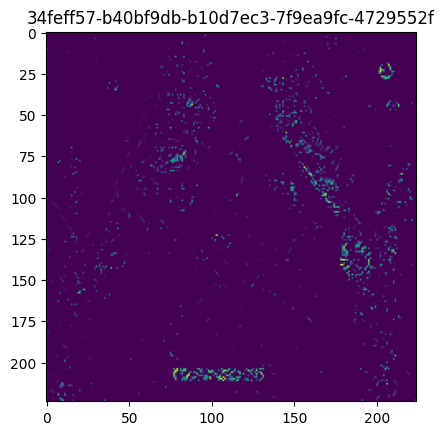

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060646 | Suff=0.000129 | Nec=0.000013 | L1=0.517355 | TV=0.883973 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057961 | Suff=0.000024 | Nec=0.000009 | L1=0.491403 | TV=0.880449 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.054801 | Suff=0.000005 | Nec=0.000006 | L1=0.462363 | TV=0.855962 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.049802 | Suff=0.000005 | Nec=0.000005 | L1=0.417726 | TV=0.802447 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.042866 | Suff=0.000012 | Nec=0.000003 | L1=0.357225 | TV=0.713579 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.035253 | Suff=0.000015 | Nec=0.000003 | L1=0.291778 | TV=0.606612 | Changed 

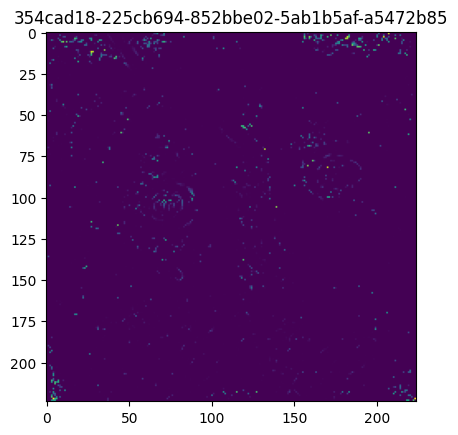

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061372 | Suff=0.000178 | Nec=0.000174 | L1=0.522899 | TV=0.890583 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060107 | Suff=0.000122 | Nec=0.000089 | L1=0.510072 | TV=0.899453 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059173 | Suff=0.000020 | Nec=0.000044 | L1=0.501753 | TV=0.896538 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058044 | Suff=0.000007 | Nec=0.000019 | L1=0.491403 | TV=0.889076 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056262 | Suff=0.000003 | Nec=0.000008 | L1=0.475348 | TV=0.872171 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053578 | Suff=0.000003 | Nec=0.000006 | L1=0.451695 | TV=0.840361 | Changed 

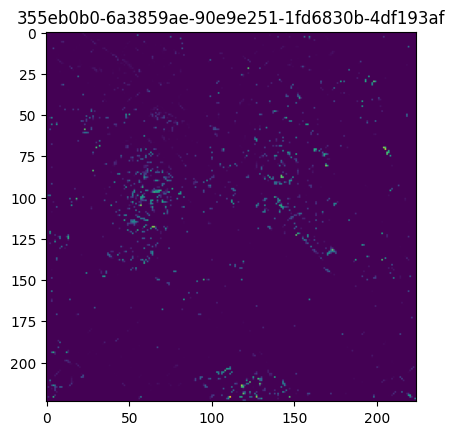

Step    1: Loss=0.114935 | Suff=0.000002 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061501 | Suff=0.000008 | Nec=0.000049 | L1=0.525255 | TV=0.894743 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060258 | Suff=0.000064 | Nec=0.000036 | L1=0.511897 | TV=0.901808 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059439 | Suff=0.000064 | Nec=0.000030 | L1=0.503982 | TV=0.899363 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058387 | Suff=0.000032 | Nec=0.000021 | L1=0.494398 | TV=0.892057 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056889 | Suff=0.000012 | Nec=0.000014 | L1=0.481011 | TV=0.877462 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054805 | Suff=0.000005 | Nec=0.000010 | L1=0.462661 | TV=0.853101 | Changed 

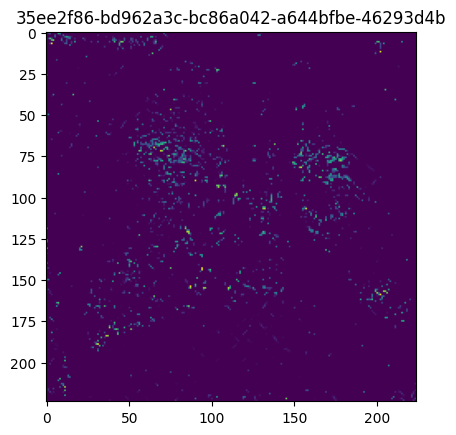

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061556 | Suff=0.000233 | Nec=0.000195 | L1=0.525053 | TV=0.883684 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060299 | Suff=0.000195 | Nec=0.000066 | L1=0.512344 | TV=0.893361 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059465 | Suff=0.000030 | Nec=0.000040 | L1=0.505100 | TV=0.891961 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058421 | Suff=0.000009 | Nec=0.000020 | L1=0.495512 | TV=0.885522 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056609 | Suff=0.000003 | Nec=0.000010 | L1=0.479169 | TV=0.868485 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053782 | Suff=0.000002 | Nec=0.000009 | L1=0.454279 | TV=0.834838 | Changed 

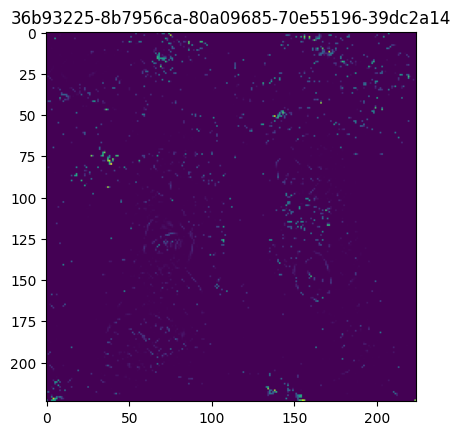

Step    1: Loss=0.114939 | Suff=0.000010 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061526 | Suff=0.000566 | Nec=0.000096 | L1=0.523577 | TV=0.883737 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059814 | Suff=0.000081 | Nec=0.000051 | L1=0.508250 | TV=0.892333 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058558 | Suff=0.000019 | Nec=0.000031 | L1=0.496708 | TV=0.886250 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056874 | Suff=0.000008 | Nec=0.000016 | L1=0.481355 | TV=0.872599 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054192 | Suff=0.000006 | Nec=0.000011 | L1=0.457435 | TV=0.844019 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050421 | Suff=0.000007 | Nec=0.000012 | L1=0.424454 | TV=0.796619 | Changed 

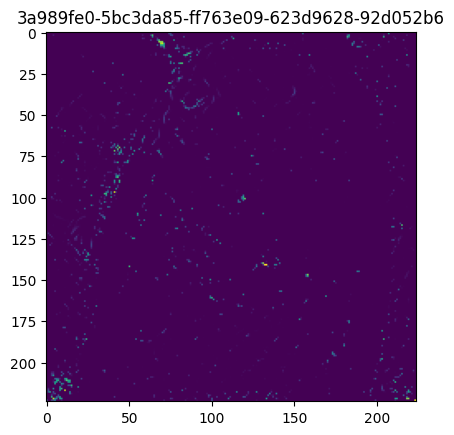

Step    1: Loss=0.116043 | Suff=0.002219 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059990 | Suff=0.000020 | Nec=0.000109 | L1=0.510422 | TV=0.888274 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058538 | Suff=0.000014 | Nec=0.000050 | L1=0.496508 | TV=0.885527 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057171 | Suff=0.000012 | Nec=0.000022 | L1=0.483802 | TV=0.877338 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055159 | Suff=0.000009 | Nec=0.000014 | L1=0.465318 | TV=0.861537 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052117 | Suff=0.000009 | Nec=0.000010 | L1=0.437896 | TV=0.831757 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048228 | Suff=0.000011 | Nec=0.000010 | L1=0.403446 | TV=0.787305 | Changed 

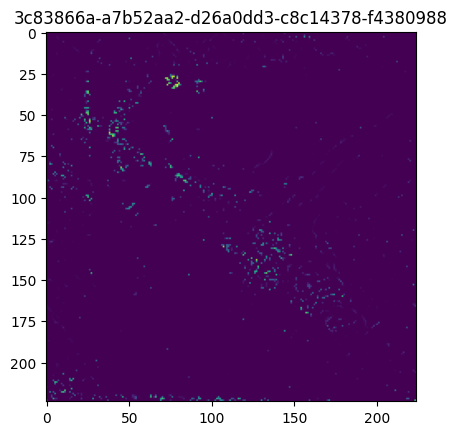

Step    1: Loss=0.114998 | Suff=0.000129 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.062540 | Suff=0.008545 | Nec=0.000000 | L1=0.495484 | TV=0.871906 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057364 | Suff=0.000018 | Nec=0.000001 | L1=0.485455 | TV=0.880907 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055771 | Suff=0.000012 | Nec=0.000001 | L1=0.470915 | TV=0.867298 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053486 | Suff=0.000010 | Nec=0.000001 | L1=0.450519 | TV=0.842860 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050431 | Suff=0.000008 | Nec=0.000001 | L1=0.423640 | TV=0.806307 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.046693 | Suff=0.000008 | Nec=0.000001 | L1=0.391096 | TV=0.757868 | Changed 

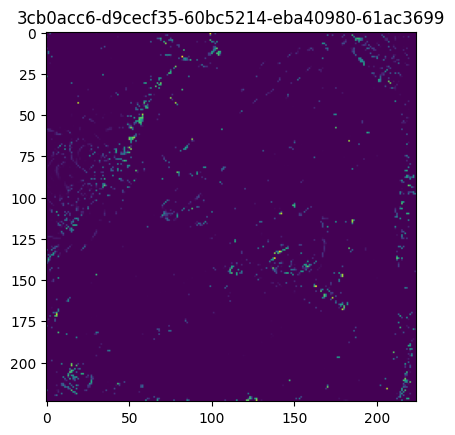

Step    1: Loss=0.170218 | Suff=0.134815 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061788 | Suff=0.000436 | Nec=0.000039 | L1=0.527229 | TV=0.882743 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060057 | Suff=0.000109 | Nec=0.000031 | L1=0.511619 | TV=0.882502 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058836 | Suff=0.000050 | Nec=0.000024 | L1=0.500491 | TV=0.875014 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057326 | Suff=0.000026 | Nec=0.000018 | L1=0.486870 | TV=0.861693 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055365 | Suff=0.000016 | Nec=0.000011 | L1=0.469403 | TV=0.841074 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052966 | Suff=0.000012 | Nec=0.000007 | L1=0.448253 | TV=0.813133 | Changed 

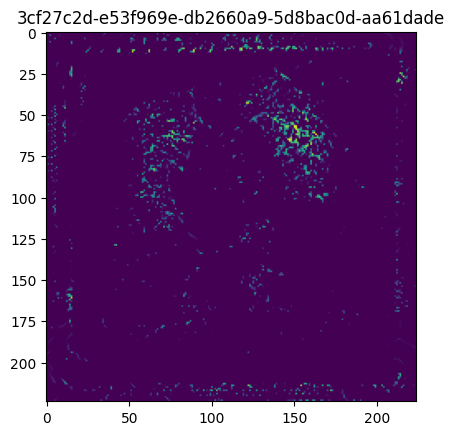

Step    1: Loss=0.114975 | Suff=0.000083 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061285 | Suff=0.000120 | Nec=0.000174 | L1=0.523901 | TV=0.874706 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059801 | Suff=0.000083 | Nec=0.000077 | L1=0.509363 | TV=0.878518 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058835 | Suff=0.000019 | Nec=0.000032 | L1=0.500418 | TV=0.876714 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057368 | Suff=0.000005 | Nec=0.000017 | L1=0.486713 | TV=0.868553 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054621 | Suff=0.000003 | Nec=0.000018 | L1=0.461704 | TV=0.843977 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050587 | Suff=0.000007 | Nec=0.000024 | L1=0.425776 | TV=0.799328 | Changed 

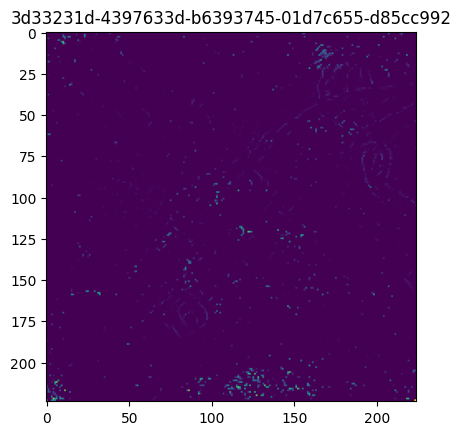

Step    1: Loss=0.114959 | Suff=0.000049 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061385 | Suff=0.001356 | Nec=0.000000 | L1=0.518044 | TV=0.890246 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059284 | Suff=0.000044 | Nec=0.000001 | L1=0.503242 | TV=0.893672 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058107 | Suff=0.000016 | Nec=0.000001 | L1=0.492199 | TV=0.887831 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056514 | Suff=0.000009 | Nec=0.000001 | L1=0.477593 | TV=0.874943 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.054028 | Suff=0.000007 | Nec=0.000001 | L1=0.455362 | TV=0.848820 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050576 | Suff=0.000011 | Nec=0.000001 | L1=0.425023 | TV=0.806796 | Changed 

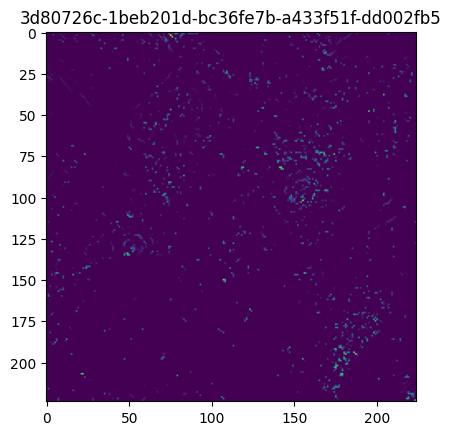

Step    1: Loss=0.126006 | Suff=0.022145 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061738 | Suff=0.000277 | Nec=0.000000 | L1=0.526225 | TV=0.897644 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060346 | Suff=0.000090 | Nec=0.000000 | L1=0.512507 | TV=0.905038 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059312 | Suff=0.000019 | Nec=0.000000 | L1=0.502942 | TV=0.900813 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058021 | Suff=0.000008 | Nec=0.000000 | L1=0.491134 | TV=0.890353 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056147 | Suff=0.000004 | Nec=0.000001 | L1=0.474386 | TV=0.870644 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053517 | Suff=0.000003 | Nec=0.000001 | L1=0.451367 | TV=0.837834 | Changed 

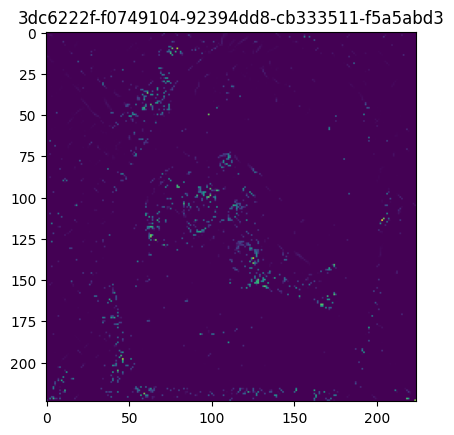

Step    1: Loss=0.114935 | Suff=0.000002 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061618 | Suff=0.000008 | Nec=0.000057 | L1=0.526759 | TV=0.890954 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060430 | Suff=0.000059 | Nec=0.000030 | L1=0.514013 | TV=0.898449 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059736 | Suff=0.000064 | Nec=0.000023 | L1=0.507163 | TV=0.897606 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058872 | Suff=0.000032 | Nec=0.000018 | L1=0.499201 | TV=0.892653 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057515 | Suff=0.000011 | Nec=0.000012 | L1=0.486923 | TV=0.881096 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055478 | Suff=0.000005 | Nec=0.000008 | L1=0.468844 | TV=0.858739 | Changed 

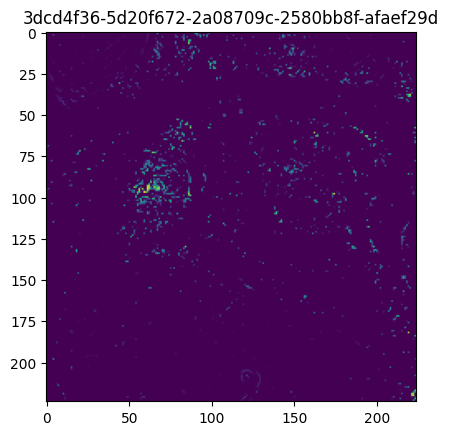

Step    1: Loss=0.114972 | Suff=0.000077 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061670 | Suff=0.000003 | Nec=0.000031 | L1=0.527659 | TV=0.888723 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060593 | Suff=0.000017 | Nec=0.000016 | L1=0.516141 | TV=0.896270 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059989 | Suff=0.000024 | Nec=0.000013 | L1=0.510122 | TV=0.895909 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.059258 | Suff=0.000019 | Nec=0.000011 | L1=0.503191 | TV=0.892436 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.058112 | Suff=0.000009 | Nec=0.000009 | L1=0.492715 | TV=0.883165 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.056319 | Suff=0.000004 | Nec=0.000008 | L1=0.476739 | TV=0.863960 | Changed 

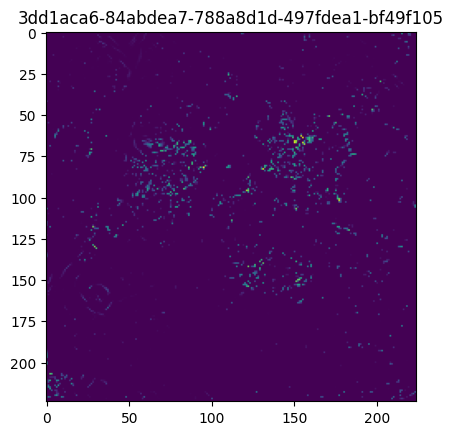

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061563 | Suff=0.000005 | Nec=0.000001 | L1=0.526891 | TV=0.887065 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060403 | Suff=0.000122 | Nec=0.000001 | L1=0.513675 | TV=0.897390 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059590 | Suff=0.000041 | Nec=0.000001 | L1=0.506081 | TV=0.896081 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058596 | Suff=0.000010 | Nec=0.000001 | L1=0.496961 | TV=0.889482 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057099 | Suff=0.000003 | Nec=0.000001 | L1=0.483452 | TV=0.875166 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054867 | Suff=0.000002 | Nec=0.000001 | L1=0.463752 | TV=0.848996 | Changed 

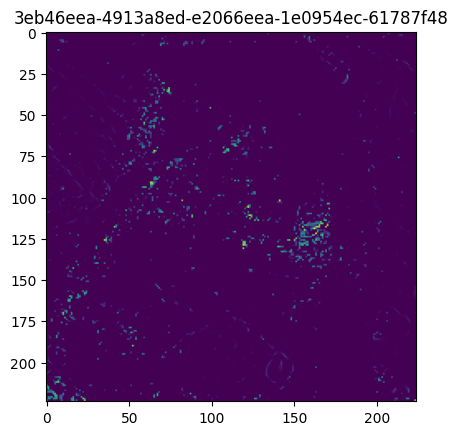

Step    1: Loss=0.114955 | Suff=0.000042 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061116 | Suff=0.000001 | Nec=0.000016 | L1=0.521670 | TV=0.894032 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059923 | Suff=0.000004 | Nec=0.000017 | L1=0.509338 | TV=0.897876 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059110 | Suff=0.000006 | Nec=0.000015 | L1=0.501548 | TV=0.894499 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057959 | Suff=0.000005 | Nec=0.000011 | L1=0.490937 | TV=0.885741 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056057 | Suff=0.000003 | Nec=0.000008 | L1=0.473844 | TV=0.866749 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053242 | Suff=0.000002 | Nec=0.000005 | L1=0.449072 | TV=0.833158 | Changed 

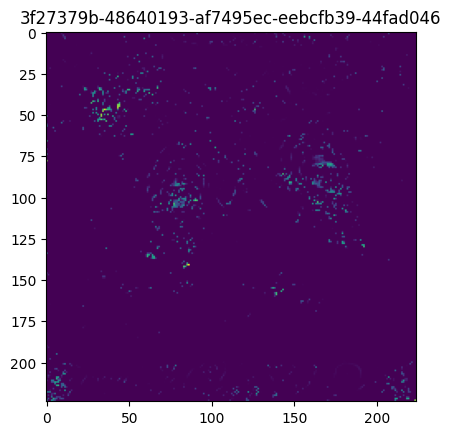

Step    1: Loss=0.114965 | Suff=0.000062 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061717 | Suff=0.001299 | Nec=0.000435 | L1=0.522070 | TV=0.864300 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059719 | Suff=0.000150 | Nec=0.000106 | L1=0.508451 | TV=0.874594 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058929 | Suff=0.000030 | Nec=0.000043 | L1=0.501525 | TV=0.874037 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057981 | Suff=0.000012 | Nec=0.000017 | L1=0.492743 | TV=0.869261 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056235 | Suff=0.000005 | Nec=0.000011 | L1=0.476958 | TV=0.853198 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053368 | Suff=0.000003 | Nec=0.000014 | L1=0.451687 | TV=0.819050 | Changed 

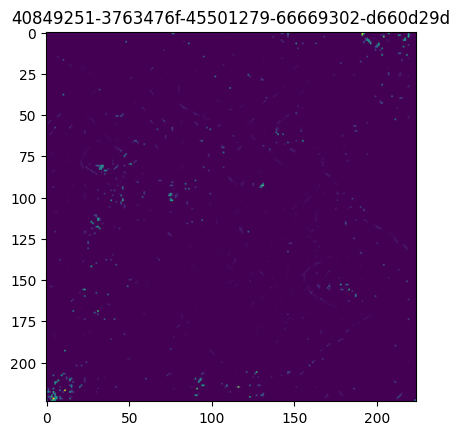

Step    1: Loss=0.118689 | Suff=0.007510 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058317 | Suff=0.000099 | Nec=0.000045 | L1=0.495223 | TV=0.872265 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.054862 | Suff=0.000015 | Nec=0.000022 | L1=0.463755 | TV=0.846830 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.050219 | Suff=0.000016 | Nec=0.000016 | L1=0.422024 | TV=0.800082 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.043923 | Suff=0.000017 | Nec=0.000019 | L1=0.366589 | TV=0.724636 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.036955 | Suff=0.000024 | Nec=0.000024 | L1=0.306333 | TV=0.629720 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.030429 | Suff=0.000020 | Nec=0.000025 | L1=0.250673 | TV=0.533885 | Changed 

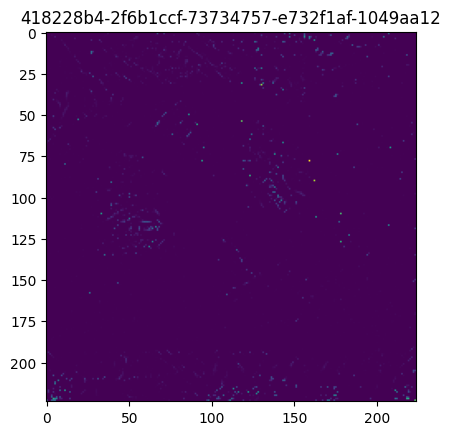

Step    1: Loss=0.154115 | Suff=0.078362 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060644 | Suff=0.000793 | Nec=0.000154 | L1=0.514357 | TV=0.873444 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059533 | Suff=0.000254 | Nec=0.000137 | L1=0.506139 | TV=0.872377 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058768 | Suff=0.000086 | Nec=0.000093 | L1=0.499962 | TV=0.868252 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057886 | Suff=0.000036 | Nec=0.000055 | L1=0.492302 | TV=0.861055 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056617 | Suff=0.000018 | Nec=0.000029 | L1=0.481073 | TV=0.848659 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054877 | Suff=0.000014 | Nec=0.000018 | L1=0.465682 | TV=0.829268 | Changed 

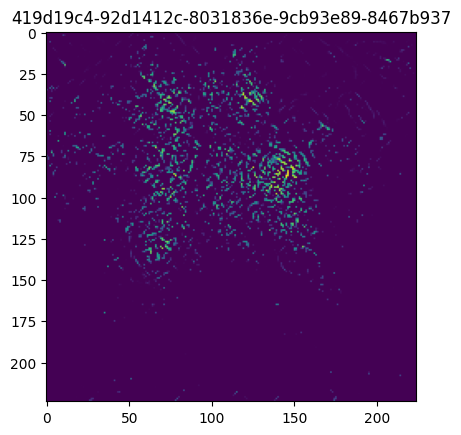

Step    1: Loss=0.114951 | Suff=0.000034 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061227 | Suff=0.000044 | Nec=0.000357 | L1=0.521873 | TV=0.883987 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059915 | Suff=0.000152 | Nec=0.000120 | L1=0.508592 | TV=0.891963 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059127 | Suff=0.000082 | Nec=0.000046 | L1=0.501653 | TV=0.889780 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058244 | Suff=0.000028 | Nec=0.000023 | L1=0.493806 | TV=0.883871 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056987 | Suff=0.000009 | Nec=0.000013 | L1=0.482512 | TV=0.872510 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055078 | Suff=0.000004 | Nec=0.000009 | L1=0.465646 | TV=0.850678 | Changed 

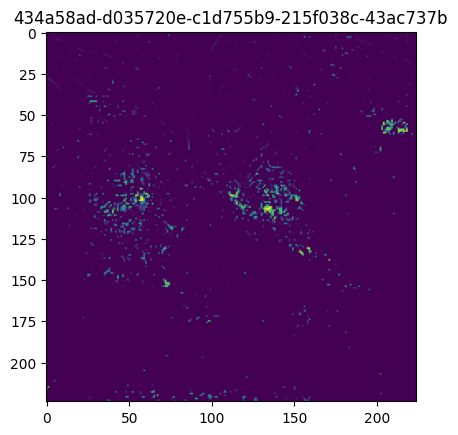

Step    1: Loss=0.118309 | Suff=0.006750 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058476 | Suff=0.000023 | Nec=0.000031 | L1=0.497591 | TV=0.868991 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.055002 | Suff=0.000016 | Nec=0.000016 | L1=0.465283 | TV=0.845784 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.049623 | Suff=0.000017 | Nec=0.000008 | L1=0.416542 | TV=0.795625 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.042106 | Suff=0.000016 | Nec=0.000017 | L1=0.350157 | TV=0.707344 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.033887 | Suff=0.000014 | Nec=0.000012 | L1=0.279347 | TV=0.593909 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.026372 | Suff=0.000021 | Nec=0.000021 | L1=0.215455 | TV=0.480520 | Changed 

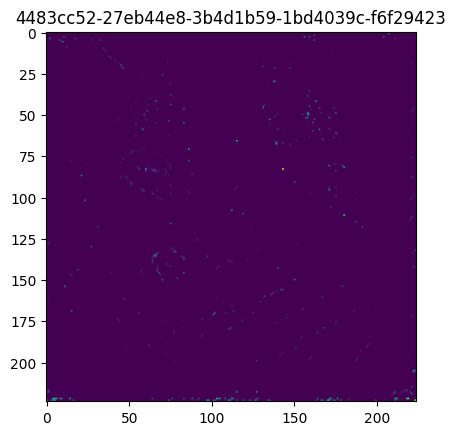

Step    1: Loss=0.102823 | Suff=0.000024 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059071 | Suff=0.002538 | Nec=0.000000 | L1=0.493401 | TV=0.846175 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057127 | Suff=0.000107 | Nec=0.000000 | L1=0.482154 | TV=0.885817 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055660 | Suff=0.000048 | Nec=0.000000 | L1=0.468675 | TV=0.876855 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.053330 | Suff=0.000009 | Nec=0.000000 | L1=0.447685 | TV=0.855754 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.049603 | Suff=0.000005 | Nec=0.000000 | L1=0.414600 | TV=0.814042 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.044599 | Suff=0.000014 | Nec=0.000000 | L1=0.370913 | TV=0.750051 | Changed 

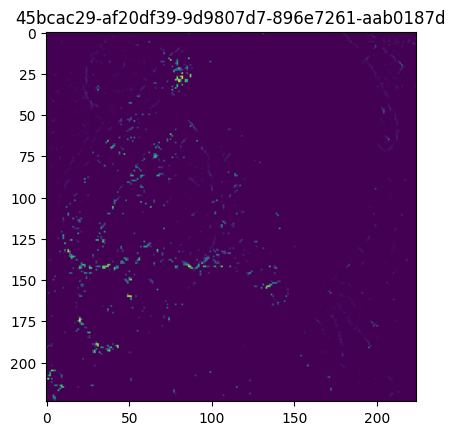

Step    1: Loss=0.114937 | Suff=0.000006 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061154 | Suff=0.000000 | Nec=0.000078 | L1=0.521635 | TV=0.895110 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060018 | Suff=0.000000 | Nec=0.000054 | L1=0.509912 | TV=0.899967 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059182 | Suff=0.000000 | Nec=0.000036 | L1=0.501988 | TV=0.896529 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058098 | Suff=0.000000 | Nec=0.000019 | L1=0.492046 | TV=0.888407 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056540 | Suff=0.000000 | Nec=0.000009 | L1=0.478013 | TV=0.873449 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054367 | Suff=0.000000 | Nec=0.000005 | L1=0.458776 | TV=0.848656 | Changed 

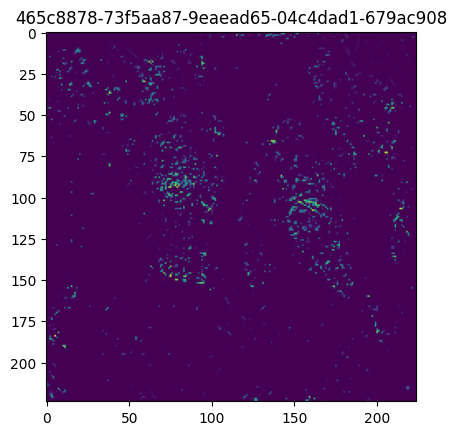

Step    1: Loss=0.114938 | Suff=0.000009 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061712 | Suff=0.000043 | Nec=0.000001 | L1=0.525812 | TV=0.910892 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060507 | Suff=0.000234 | Nec=0.000001 | L1=0.512188 | TV=0.917046 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059344 | Suff=0.000049 | Nec=0.000001 | L1=0.501942 | TV=0.912456 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057911 | Suff=0.000013 | Nec=0.000001 | L1=0.488906 | TV=0.901296 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055894 | Suff=0.000005 | Nec=0.000002 | L1=0.470854 | TV=0.880512 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053176 | Suff=0.000004 | Nec=0.000002 | L1=0.446973 | TV=0.847564 | Changed 

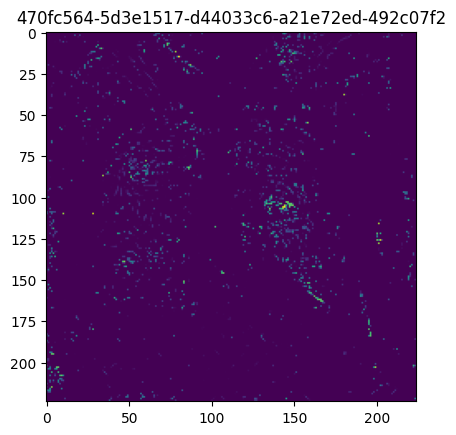

Step    1: Loss=0.115175 | Suff=0.000482 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061660 | Suff=0.000387 | Nec=0.000000 | L1=0.524704 | TV=0.899621 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060159 | Suff=0.000036 | Nec=0.000000 | L1=0.511185 | TV=0.902216 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059144 | Suff=0.000015 | Nec=0.000000 | L1=0.501600 | TV=0.897589 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057751 | Suff=0.000006 | Nec=0.000000 | L1=0.488783 | TV=0.886918 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055491 | Suff=0.000003 | Nec=0.000001 | L1=0.468441 | TV=0.864488 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052233 | Suff=0.000004 | Nec=0.000001 | L1=0.439702 | TV=0.826046 | Changed 

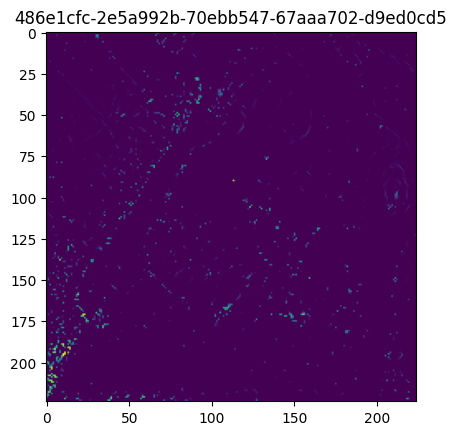

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061497 | Suff=0.000584 | Nec=0.000001 | L1=0.521623 | TV=0.904254 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060135 | Suff=0.000071 | Nec=0.000003 | L1=0.510297 | TV=0.906852 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059338 | Suff=0.000028 | Nec=0.000003 | L1=0.502809 | TV=0.904140 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058291 | Suff=0.000013 | Nec=0.000003 | L1=0.493140 | TV=0.896884 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056672 | Suff=0.000008 | Nec=0.000003 | L1=0.478447 | TV=0.882138 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054320 | Suff=0.000007 | Nec=0.000004 | L1=0.457522 | TV=0.856222 | Changed 

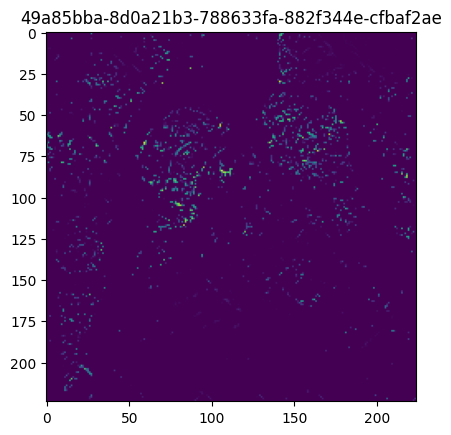

Step    1: Loss=0.114952 | Suff=0.000035 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061368 | Suff=0.000320 | Nec=0.000005 | L1=0.522602 | TV=0.894526 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059606 | Suff=0.000039 | Nec=0.000005 | L1=0.506276 | TV=0.895626 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058171 | Suff=0.000015 | Nec=0.000005 | L1=0.492891 | TV=0.887262 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056046 | Suff=0.000006 | Nec=0.000005 | L1=0.473513 | TV=0.868967 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.052691 | Suff=0.000003 | Nec=0.000005 | L1=0.443611 | TV=0.832565 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.048292 | Suff=0.000006 | Nec=0.000005 | L1=0.405050 | TV=0.778113 | Changed 

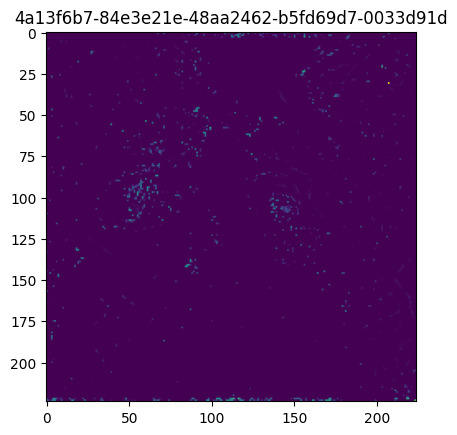

Step    1: Loss=0.114957 | Suff=0.000046 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061903 | Suff=0.000000 | Nec=0.000002 | L1=0.530048 | TV=0.889704 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060724 | Suff=0.000004 | Nec=0.000001 | L1=0.517411 | TV=0.897982 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059938 | Suff=0.000009 | Nec=0.000001 | L1=0.509770 | TV=0.895610 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058976 | Suff=0.000011 | Nec=0.000001 | L1=0.500768 | TV=0.889375 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057643 | Suff=0.000009 | Nec=0.000001 | L1=0.488635 | TV=0.877394 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055773 | Suff=0.000006 | Nec=0.000001 | L1=0.472015 | TV=0.856756 | Changed 

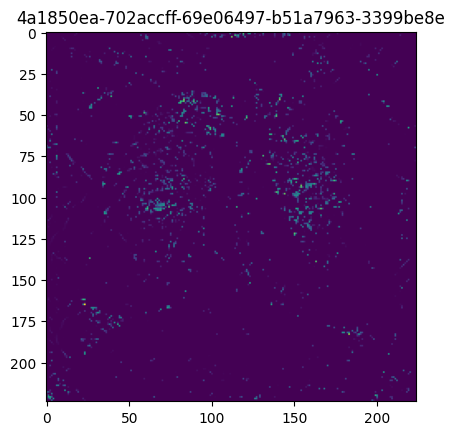

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061609 | Suff=0.000021 | Nec=0.000000 | L1=0.526981 | TV=0.890006 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060313 | Suff=0.000088 | Nec=0.000000 | L1=0.513236 | TV=0.894456 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059301 | Suff=0.000045 | Nec=0.000000 | L1=0.503717 | TV=0.890663 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057916 | Suff=0.000012 | Nec=0.000001 | L1=0.491036 | TV=0.880635 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055806 | Suff=0.000006 | Nec=0.000001 | L1=0.472055 | TV=0.859734 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052855 | Suff=0.000005 | Nec=0.000001 | L1=0.446037 | TV=0.824834 | Changed 

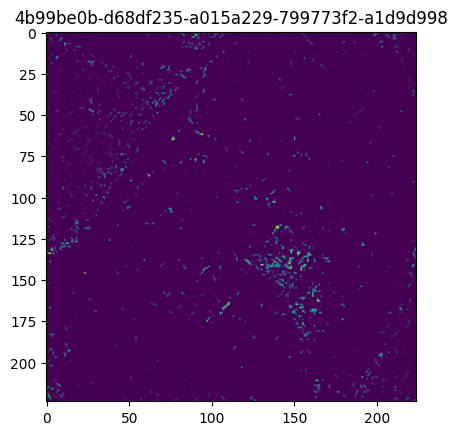

Step    1: Loss=0.102828 | Suff=0.000034 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058413 | Suff=0.000103 | Nec=0.000007 | L1=0.495922 | TV=0.876554 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.056859 | Suff=0.000078 | Nec=0.000005 | L1=0.480295 | TV=0.878771 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.054556 | Suff=0.000013 | Nec=0.000005 | L1=0.459338 | TV=0.861358 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.050718 | Suff=0.000006 | Nec=0.000004 | L1=0.425011 | TV=0.821256 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.044859 | Suff=0.000010 | Nec=0.000003 | L1=0.373875 | TV=0.746533 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.037954 | Suff=0.000028 | Nec=0.000001 | L1=0.314415 | TV=0.649816 | Changed 

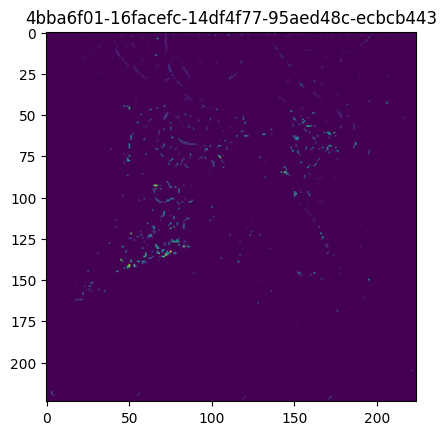

Step    1: Loss=0.115554 | Suff=0.001241 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061593 | Suff=0.000416 | Nec=0.000004 | L1=0.524115 | TV=0.897135 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060152 | Suff=0.000082 | Nec=0.000005 | L1=0.510972 | TV=0.901158 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059181 | Suff=0.000019 | Nec=0.000006 | L1=0.501982 | TV=0.896973 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057866 | Suff=0.000007 | Nec=0.000005 | L1=0.489890 | TV=0.887085 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055748 | Suff=0.000004 | Nec=0.000005 | L1=0.470814 | TV=0.866256 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052700 | Suff=0.000004 | Nec=0.000004 | L1=0.443940 | TV=0.830126 | Changed 

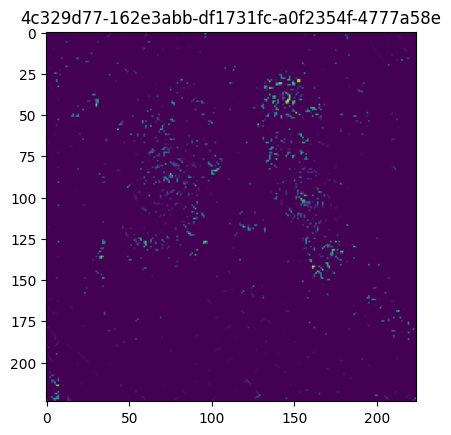

Step    1: Loss=0.114947 | Suff=0.000026 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061316 | Suff=0.000001 | Nec=0.000054 | L1=0.523830 | TV=0.890644 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060108 | Suff=0.000002 | Nec=0.000026 | L1=0.511343 | TV=0.896009 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059354 | Suff=0.000003 | Nec=0.000019 | L1=0.504105 | TV=0.893284 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058463 | Suff=0.000003 | Nec=0.000014 | L1=0.495800 | TV=0.887482 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057104 | Suff=0.000002 | Nec=0.000009 | L1=0.483476 | TV=0.875132 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055075 | Suff=0.000002 | Nec=0.000006 | L1=0.465470 | TV=0.852410 | Changed 

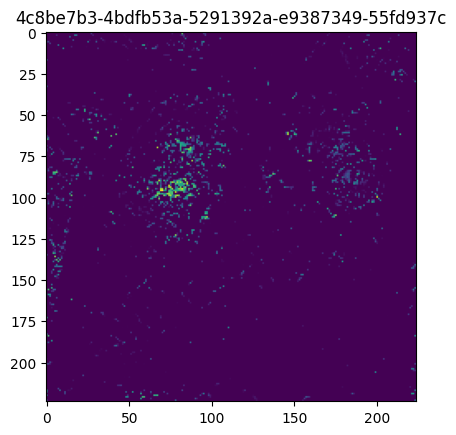

Step    1: Loss=0.114938 | Suff=0.000007 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061368 | Suff=0.000164 | Nec=0.000542 | L1=0.520917 | TV=0.892360 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060039 | Suff=0.000180 | Nec=0.000154 | L1=0.509444 | TV=0.892716 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059073 | Suff=0.000061 | Nec=0.000055 | L1=0.501325 | TV=0.888220 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057870 | Suff=0.000022 | Nec=0.000025 | L1=0.490547 | TV=0.879189 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056006 | Suff=0.000012 | Nec=0.000013 | L1=0.473795 | TV=0.861411 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053307 | Suff=0.000009 | Nec=0.000013 | L1=0.449913 | TV=0.830461 | Changed 

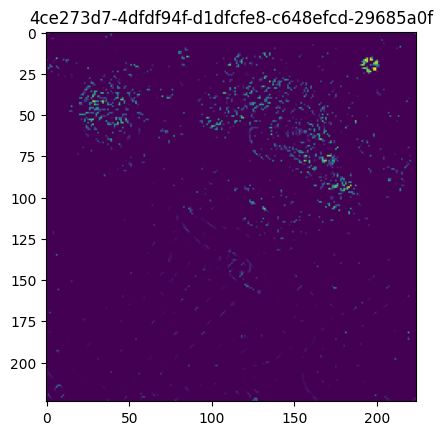

Step    1: Loss=0.114937 | Suff=0.000007 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060186 | Suff=0.000144 | Nec=0.000001 | L1=0.513906 | TV=0.872261 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057509 | Suff=0.000020 | Nec=0.000002 | L1=0.488178 | TV=0.868017 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.054238 | Suff=0.000005 | Nec=0.000003 | L1=0.458180 | TV=0.841653 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.048964 | Suff=0.000004 | Nec=0.000004 | L1=0.411146 | TV=0.784534 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.041711 | Suff=0.000005 | Nec=0.000006 | L1=0.347879 | TV=0.691734 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.033910 | Suff=0.000018 | Nec=0.000010 | L1=0.280771 | TV=0.581921 | Changed 

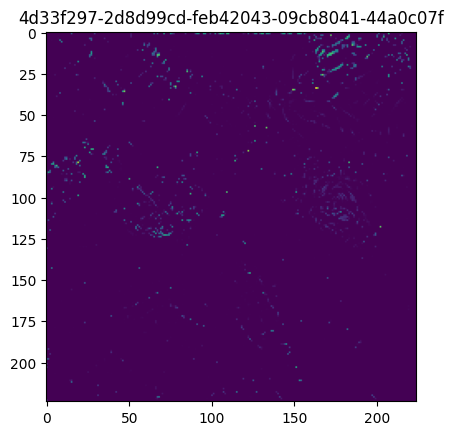

Step    1: Loss=0.115001 | Suff=0.000134 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.058442 | Suff=0.000001 | Nec=0.000001 | L1=0.500194 | TV=0.842175 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.054315 | Suff=0.000006 | Nec=0.000002 | L1=0.461347 | TV=0.817654 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.048280 | Suff=0.000007 | Nec=0.000003 | L1=0.407272 | TV=0.754739 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.039815 | Suff=0.000016 | Nec=0.000008 | L1=0.333130 | TV=0.648991 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.030763 | Suff=0.000019 | Nec=0.000019 | L1=0.255037 | TV=0.524028 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.022851 | Suff=0.000023 | Nec=0.000019 | L1=0.187673 | TV=0.406300 | Changed 

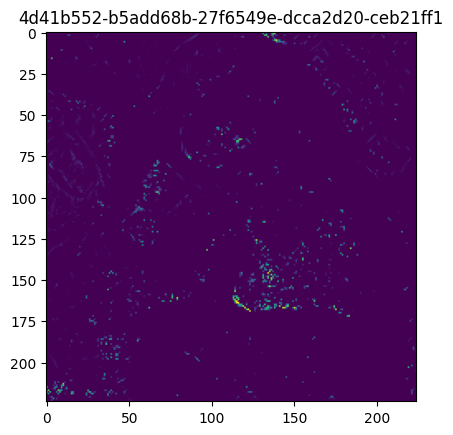

Step    1: Loss=0.114945 | Suff=0.000023 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059393 | Suff=0.000039 | Nec=0.000037 | L1=0.506974 | TV=0.865773 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.054877 | Suff=0.000008 | Nec=0.000010 | L1=0.464578 | TV=0.841035 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.048575 | Suff=0.000007 | Nec=0.000013 | L1=0.407890 | TV=0.777591 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.040194 | Suff=0.000006 | Nec=0.000008 | L1=0.334679 | TV=0.671892 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.031288 | Suff=0.000015 | Nec=0.000014 | L1=0.258277 | TV=0.544557 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.023364 | Suff=0.000009 | Nec=0.000026 | L1=0.191186 | TV=0.422785 | Changed 

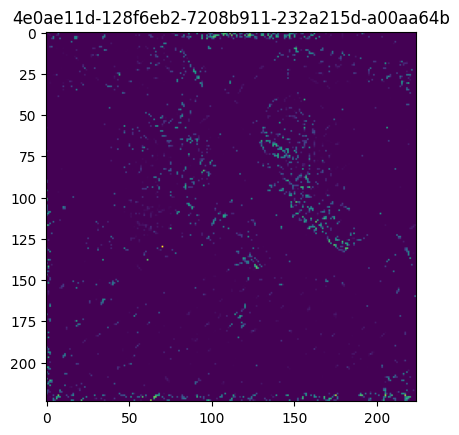

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061361 | Suff=0.000009 | Nec=0.000034 | L1=0.524424 | TV=0.889753 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060104 | Suff=0.000146 | Nec=0.000027 | L1=0.510340 | TV=0.898365 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059167 | Suff=0.000070 | Nec=0.000022 | L1=0.501653 | TV=0.895561 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057985 | Suff=0.000019 | Nec=0.000018 | L1=0.490995 | TV=0.886650 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056302 | Suff=0.000007 | Nec=0.000011 | L1=0.475966 | TV=0.869649 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053887 | Suff=0.000004 | Nec=0.000007 | L1=0.454762 | TV=0.840527 | Changed 

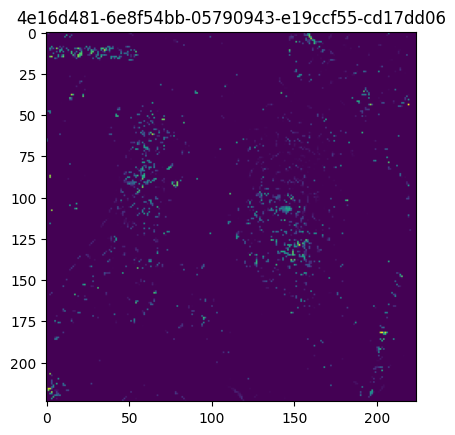

Step    1: Loss=0.116416 | Suff=0.002964 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.059996 | Suff=0.000001 | Nec=0.000028 | L1=0.513817 | TV=0.859991 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.057798 | Suff=0.000005 | Nec=0.000017 | L1=0.491856 | TV=0.860114 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.055358 | Suff=0.000008 | Nec=0.000012 | L1=0.469189 | TV=0.842954 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.051328 | Suff=0.000005 | Nec=0.000009 | L1=0.433041 | TV=0.801740 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.045489 | Suff=0.000002 | Nec=0.000015 | L1=0.381892 | TV=0.729093 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.038858 | Suff=0.000002 | Nec=0.000017 | L1=0.324553 | TV=0.639264 | Changed 

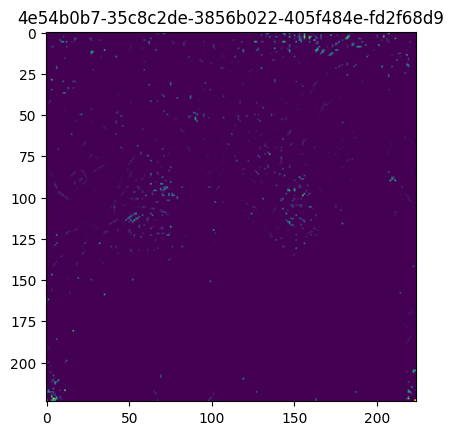

Step    1: Loss=0.104109 | Suff=0.002595 | Nec=0.005622 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060525 | Suff=0.000079 | Nec=0.000001 | L1=0.517060 | TV=0.877910 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059588 | Suff=0.000460 | Nec=0.000000 | L1=0.504303 | TV=0.892792 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058660 | Suff=0.000092 | Nec=0.000000 | L1=0.496985 | TV=0.891506 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057677 | Suff=0.000028 | Nec=0.000000 | L1=0.488111 | TV=0.885216 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056195 | Suff=0.000012 | Nec=0.000000 | L1=0.474774 | TV=0.871161 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053944 | Suff=0.000006 | Nec=0.000000 | L1=0.454940 | TV=0.844717 | Changed 

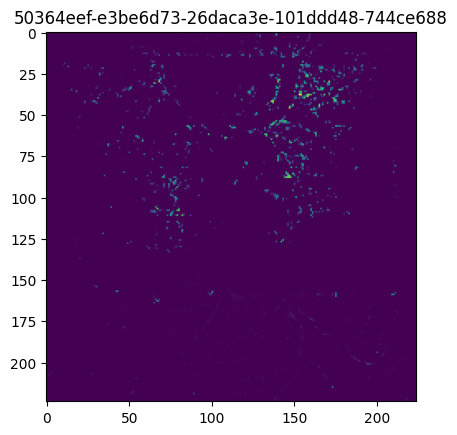

Step    1: Loss=0.114936 | Suff=0.000003 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061017 | Suff=0.000000 | Nec=0.000775 | L1=0.516494 | TV=0.897960 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059694 | Suff=0.000000 | Nec=0.000144 | L1=0.506204 | TV=0.900185 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058774 | Suff=0.000000 | Nec=0.000054 | L1=0.497970 | TV=0.894959 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057564 | Suff=0.000000 | Nec=0.000021 | L1=0.487043 | TV=0.884873 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055798 | Suff=0.000000 | Nec=0.000009 | L1=0.471224 | TV=0.867072 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053330 | Suff=0.000000 | Nec=0.000006 | L1=0.449432 | TV=0.838327 | Changed 

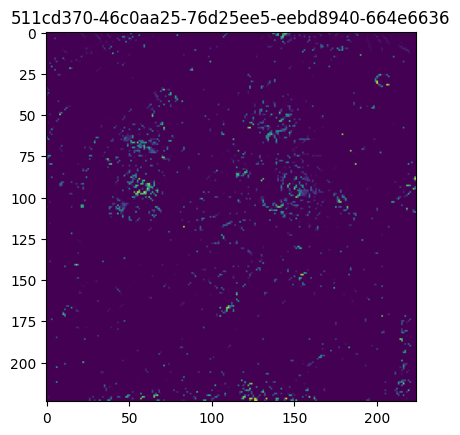

Step    1: Loss=0.114988 | Suff=0.000108 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061894 | Suff=0.000850 | Nec=0.000190 | L1=0.524859 | TV=0.888783 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060167 | Suff=0.000189 | Nec=0.000052 | L1=0.510551 | TV=0.899100 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059214 | Suff=0.000038 | Nec=0.000036 | L1=0.502130 | TV=0.896354 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058093 | Suff=0.000016 | Nec=0.000019 | L1=0.491967 | TV=0.887899 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056439 | Suff=0.000008 | Nec=0.000009 | L1=0.477190 | TV=0.871093 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.054024 | Suff=0.000006 | Nec=0.000006 | L1=0.455978 | TV=0.841963 | Changed 

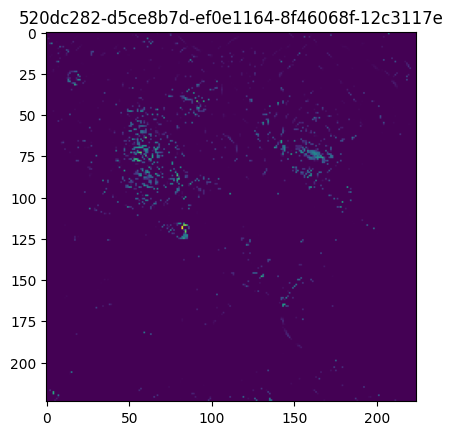

Step    1: Loss=0.114952 | Suff=0.000036 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061007 | Suff=0.000063 | Nec=0.000259 | L1=0.520320 | TV=0.881451 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059802 | Suff=0.000380 | Nec=0.000114 | L1=0.506466 | TV=0.890842 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058796 | Suff=0.000062 | Nec=0.000043 | L1=0.498648 | TV=0.887827 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057761 | Suff=0.000019 | Nec=0.000018 | L1=0.489393 | TV=0.880350 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.056199 | Suff=0.000007 | Nec=0.000009 | L1=0.475386 | TV=0.865238 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.053826 | Suff=0.000004 | Nec=0.000007 | L1=0.454498 | TV=0.837116 | Changed 

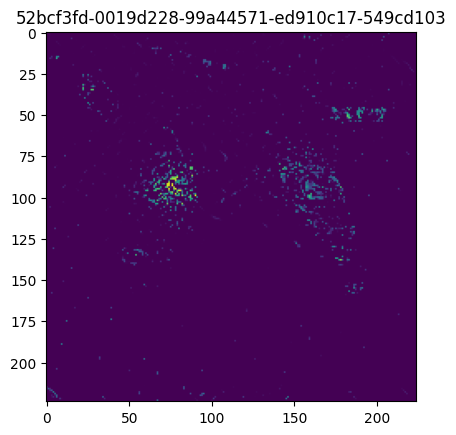

Step    1: Loss=0.114944 | Suff=0.000020 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061621 | Suff=0.000001 | Nec=0.000002 | L1=0.526208 | TV=0.899878 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060478 | Suff=0.000007 | Nec=0.000001 | L1=0.514356 | TV=0.903854 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.059702 | Suff=0.000009 | Nec=0.000001 | L1=0.506867 | TV=0.901026 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.058775 | Suff=0.000008 | Nec=0.000001 | L1=0.498262 | TV=0.894372 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.057408 | Suff=0.000005 | Nec=0.000001 | L1=0.485873 | TV=0.881720 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.055432 | Suff=0.000003 | Nec=0.000001 | L1=0.468329 | TV=0.859643 | Changed 

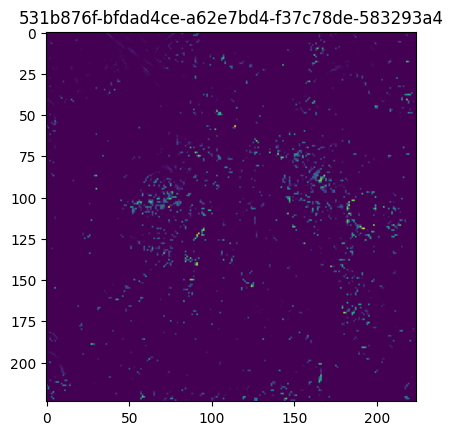

Step    1: Loss=0.114939 | Suff=0.000010 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060746 | Suff=0.000124 | Nec=0.000586 | L1=0.514703 | TV=0.892114 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059295 | Suff=0.000071 | Nec=0.000047 | L1=0.503339 | TV=0.890208 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058168 | Suff=0.000026 | Nec=0.000019 | L1=0.493122 | TV=0.883377 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.056531 | Suff=0.000011 | Nec=0.000013 | L1=0.478207 | TV=0.869832 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.053969 | Suff=0.000007 | Nec=0.000015 | L1=0.455170 | TV=0.844108 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.050503 | Suff=0.000009 | Nec=0.000023 | L1=0.424462 | TV=0.804033 | Changed 

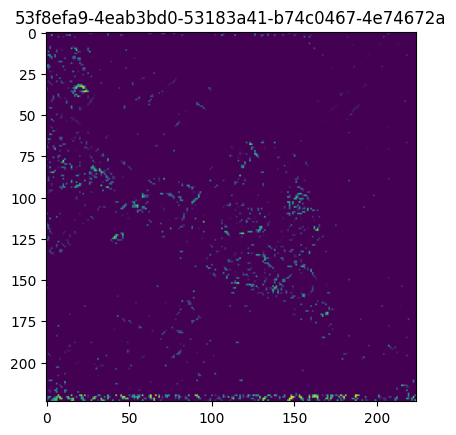

Step    1: Loss=0.114935 | Suff=0.000002 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061528 | Suff=0.000263 | Nec=0.000048 | L1=0.524742 | TV=0.889781 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.060086 | Suff=0.000108 | Nec=0.000020 | L1=0.510304 | TV=0.899162 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.058996 | Suff=0.000021 | Nec=0.000017 | L1=0.500301 | TV=0.894644 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.057608 | Suff=0.000009 | Nec=0.000014 | L1=0.487638 | TV=0.883266 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.055548 | Suff=0.000005 | Nec=0.000010 | L1=0.469187 | TV=0.862207 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.052669 | Suff=0.000005 | Nec=0.000007 | L1=0.443853 | TV=0.827767 | Changed 

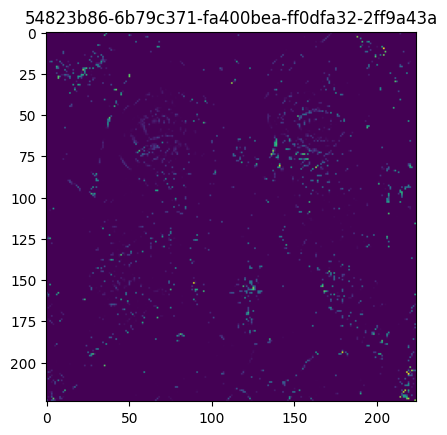

Step    1: Loss=0.114934 | Suff=0.000000 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.061088 | Suff=0.000020 | Nec=0.000000 | L1=0.522157 | TV=0.886273 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.059346 | Suff=0.000184 | Nec=0.000000 | L1=0.503187 | TV=0.893457 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057565 | Suff=0.000032 | Nec=0.000000 | L1=0.487190 | TV=0.883040 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.055152 | Suff=0.000008 | Nec=0.000000 | L1=0.465522 | TV=0.859549 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051831 | Suff=0.000004 | Nec=0.000001 | L1=0.436223 | TV=0.820669 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.047744 | Suff=0.000003 | Nec=0.000001 | L1=0.400751 | TV=0.766680 | Changed 

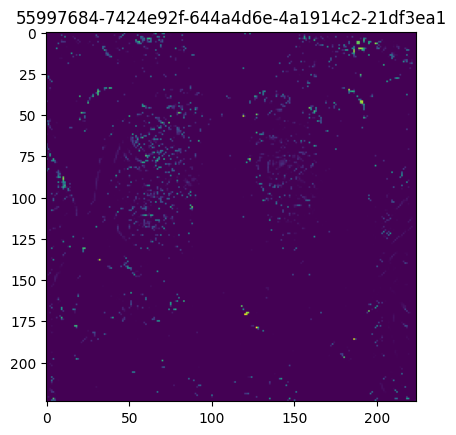

Step    1: Loss=0.115200 | Suff=0.000533 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060259 | Suff=0.000157 | Nec=0.000032 | L1=0.511278 | TV=0.903652 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058642 | Suff=0.000048 | Nec=0.000032 | L1=0.496031 | TV=0.899950 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056849 | Suff=0.000024 | Nec=0.000014 | L1=0.479545 | TV=0.887580 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054279 | Suff=0.000014 | Nec=0.000007 | L1=0.456318 | TV=0.863624 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.050663 | Suff=0.000014 | Nec=0.000004 | L1=0.424159 | TV=0.823834 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.046276 | Suff=0.000013 | Nec=0.000005 | L1=0.385674 | TV=0.769938 | Changed 

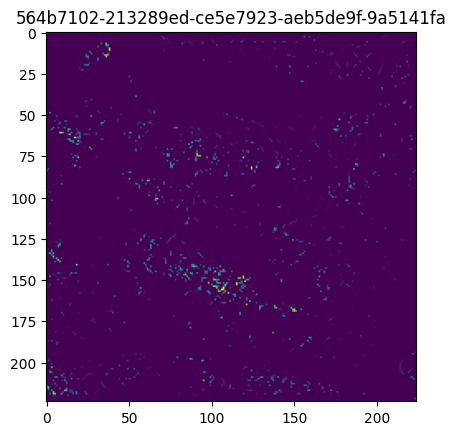

Step    1: Loss=0.114934 | Suff=0.000001 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.060201 | Suff=0.000030 | Nec=0.000180 | L1=0.514448 | TV=0.865132 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.058631 | Suff=0.000171 | Nec=0.000040 | L1=0.497227 | TV=0.880302 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.057133 | Suff=0.000021 | Nec=0.000024 | L1=0.483813 | TV=0.872929 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.054966 | Suff=0.000007 | Nec=0.000013 | L1=0.464225 | TV=0.853354 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.051488 | Suff=0.000005 | Nec=0.000007 | L1=0.433461 | TV=0.813577 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.046864 | Suff=0.000007 | Nec=0.000007 | L1=0.393207 | TV=0.753627 | Changed 

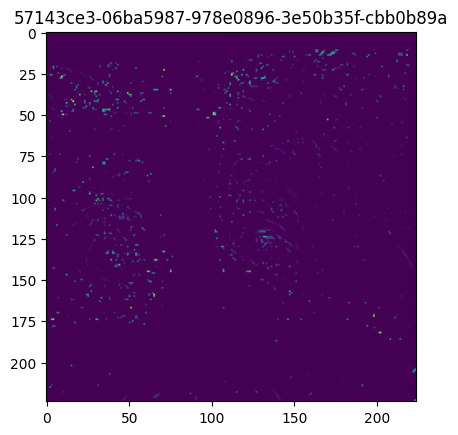

'\nfile_paths = updated_df[\'full_path\'].tolist()\nfor full_path in file_paths:\n    # nicer prefix:\n    basename = os.path.basename(full_path)\n    prefix   = os.path.splitext(basename)[0]\n\n    # load + preprocess\n    pil_img = load_dicom_as_pil(full_path)\n    x       = test_transform(pil_img).unsqueeze(0).to(device)\n\n    final_mask, mask_history, changed_class = optimize_mask(\n        model,\n        x,\n        alpha=0.5,\n        init_mask=torch.ones_like(x),\n        output_dir=output_dir,\n        prefix=prefix\n    )\n\n\nfor full_path in file_paths:\n    # derive a nice prefix from the filename, e.g. "patient123_slice45"\n    # should just be the dicom number (before dcm)\n    prefix = full_path.split(\'.\')[0]\n\n    # load + preprocess\n    pil_img = load_dicom_as_pil(full_path)\n    x       = test_transform(pil_img).unsqueeze(0).to(device)\n\n    final_mask, mask_history, changed_class = optimize_mask(model, x, alpha=0.5, init_mask=torch.ones_like(x), output_dir=out

In [ ]:
file_paths = updated_df['full_path'].tolist()
for full_path in file_paths:
    # grab “foo.dcm” out of the whole path
    basename = os.path.basename(full_path)
    # strip only the “.dcm” off of that
    prefix   = os.path.splitext(basename)[0]

    # now prefix is unique for each file
    pil_img = load_jpg_as_pil(full_path)
    x       = test_transform(pil_img).unsqueeze(0).to(device)

    final_mask, mask_history, changed_class = optimize_mask(
        model,
        x,
        alpha=0.5,
        output_dir=output_dir,   # (if you want to save rather than plt.show)
        prefix=prefix
    )

    # if you want to inspect them inline:
    plt.imshow(final_mask.squeeze().cpu().numpy(), cmap='viridis')
    plt.title(prefix)
    plt.show()



'''
file_paths = updated_df['full_path'].tolist()
for full_path in file_paths:
    # nicer prefix:
    basename = os.path.basename(full_path)
    prefix   = os.path.splitext(basename)[0]

    # load + preprocess
    pil_img = load_dicom_as_pil(full_path)
    x       = test_transform(pil_img).unsqueeze(0).to(device)

    final_mask, mask_history, changed_class = optimize_mask(
        model,
        x,
        alpha=0.5,
        init_mask=torch.ones_like(x),
        output_dir=output_dir,
        prefix=prefix
    )


for full_path in file_paths:
    # derive a nice prefix from the filename, e.g. "patient123_slice45"
    # should just be the dicom number (before dcm)
    prefix = full_path.split('.')[0]

    # load + preprocess
    pil_img = load_dicom_as_pil(full_path)
    x       = test_transform(pil_img).unsqueeze(0).to(device)

    final_mask, mask_history, changed_class = optimize_mask(model, x, alpha=0.5, init_mask=torch.ones_like(x), output_dir=output_dir, prefix=prefix)
'''

# Testing on one image and then one mask

In [ ]:
from PIL import Image

example_path = updated_df.iloc[0]['full_path']
pil_img = Image.open(example_path).convert("L")
x = test_transform(pil_img).unsqueeze(0).to(device)

## Optimize one mask

Step    1: Loss=0.129868 | Suff=0.000002 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.115815 | Suff=0.981315 | Nec=0.000011 | L1=0.439733 | TV=0.718309 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.086106 | Suff=0.968558 | Nec=0.000019 | L1=0.340208 | TV=0.520663 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.056332 | Suff=0.972336 | Nec=0.000018 | L1=0.228181 | TV=0.334957 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.033111 | Suff=0.966931 | Nec=0.000025 | L1=0.136483 | TV=0.194375 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.018490 | Suff=0.919614 | Nec=0.000013 | L1=0.075946 | TV=0.108821 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.011815 | Suff=0.924758 | Nec=0.000025 | L1=0.045557 | TV=0.072342 | Changed (keep

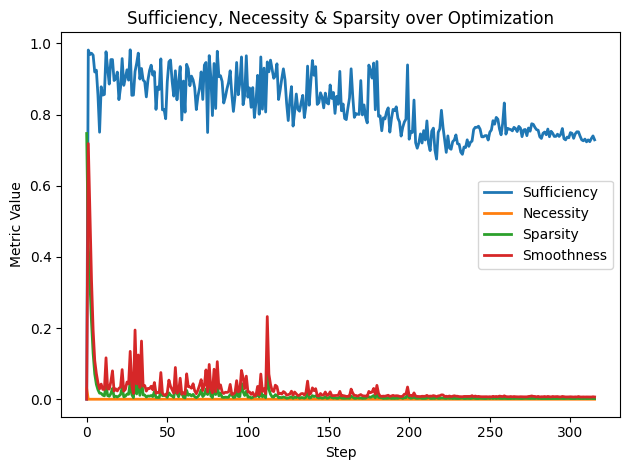

In [ ]:
final_mask, mask_history, changed_class = optimize_mask(model, x, alpha=0.5, init_mask=torch.ones_like(x), output_dir=output_dir, prefix=None)


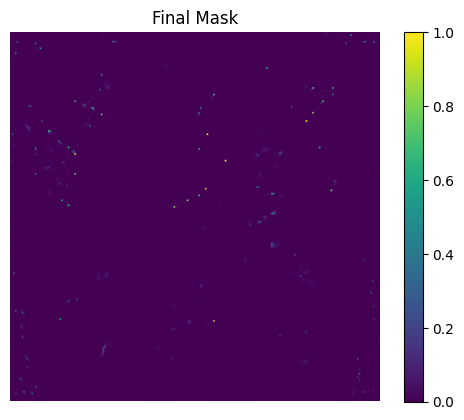

In [ ]:
plt.imshow(final_mask.squeeze().cpu().numpy(), cmap='viridis')
plt.title("Final Mask")
plt.colorbar()
plt.axis('off')
plt.show()

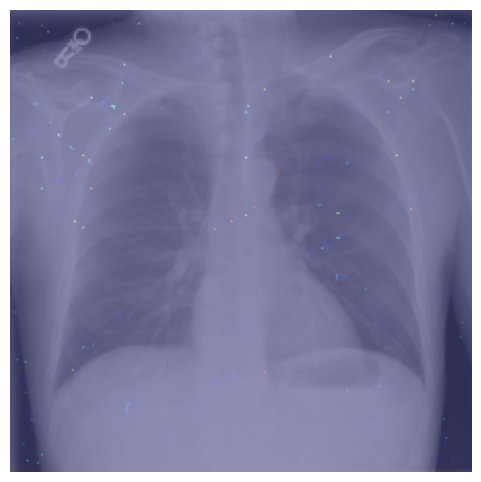

In [ ]:
# 1. Get your mask as a 2D numpy array
mask_np = final_mask.detach().cpu().squeeze().numpy()   # shape (H,W)

# 2. Get the exact image that was fed to the model
#    (i.e. after resize but before normalize)
# If your test_transform is something like Compose([Resize, ToTensor, Normalize]),
# you can manually re‐apply only the Resize + ToTensor:
from torchvision import transforms
resize_only = transforms.Compose([
    transforms.Resize((mask_np.shape[0], mask_np.shape[1])),
    transforms.ToTensor()
])
img_tensor = resize_only(pil_img)           # shape (C,H,W), values in [0,1]
img_np     = img_tensor.squeeze().numpy()   # shape (H,W)

# 3. Plot them together
import matplotlib.pyplot as plt
plt.figure(figsize=(6,6))
plt.imshow(img_np, cmap='gray', vmin=0, vmax=1)
plt.imshow(mask_np, cmap='jet', alpha=0.3)
plt.axis('off')
plt.show()


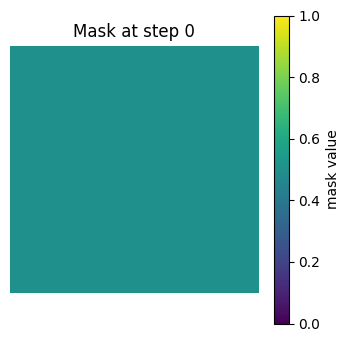

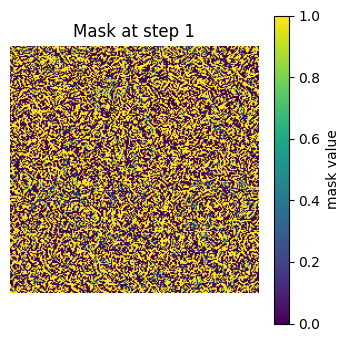

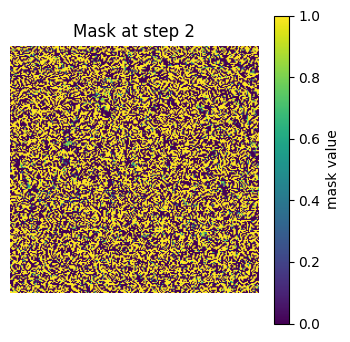

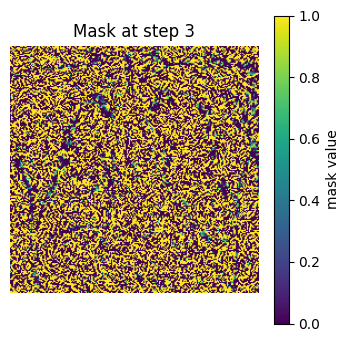

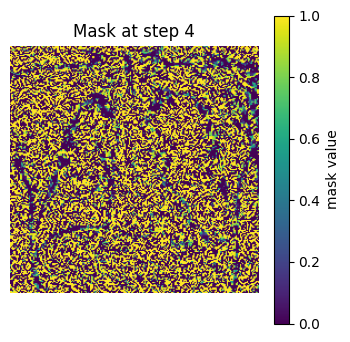

...

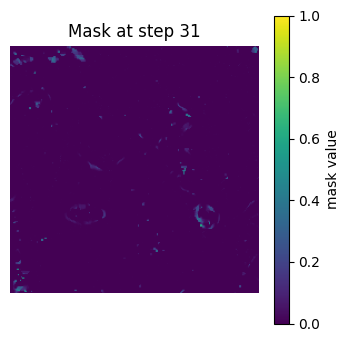

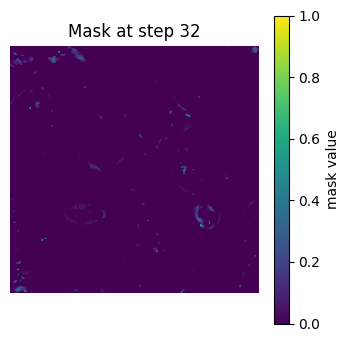

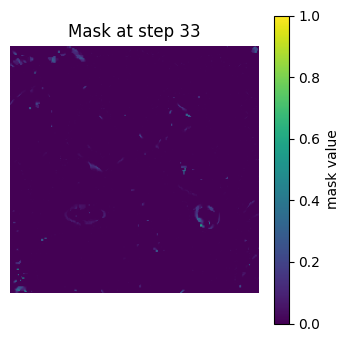

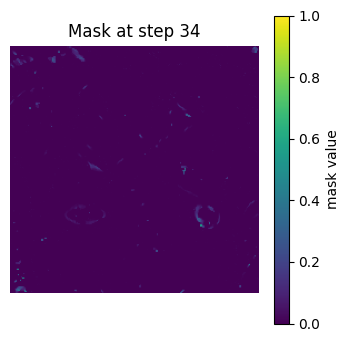

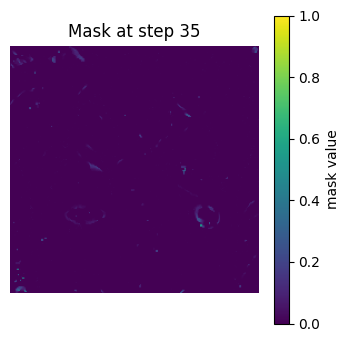

In [ ]:
import matplotlib.pyplot as plt

for step, m in enumerate(mask_history):
    m_np = m.detach().cpu().squeeze().numpy()   # shape (H,W)
    plt.figure(figsize=(4,4))
    plt.title(f"Mask at step {step}")
    plt.imshow(m_np, cmap='viridis', vmin=0, vmax=1)
    plt.colorbar(label='mask value')
    plt.axis('off')
    plt.show()


## Proving Necessity and Sufficiency

Step    1: Loss=0.129868 | Suff=0.000020 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.056237 | Suff=0.970935 | Nec=0.000003 | L1=0.478839 | TV=0.834998 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.051275 | Suff=0.972144 | Nec=0.000004 | L1=0.433628 | TV=0.790836 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   30: Loss=0.044662 | Suff=0.974198 | Nec=0.000010 | L1=0.374803 | TV=0.717263 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.037086 | Suff=0.972968 | Nec=0.000012 | L1=0.308573 | TV=0.621668 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.029685 | Suff=0.967285 | Nec=0.000010 | L1=0.245011 | TV=0.517373 | Changed (keep): True | Changed (remove): True | LR=5.000000e-01
Step   60: Loss=0.023319 | Suff=0.971270 | Nec=0.000012 | L1=0.191057 | TV=0.420158 | Changed (keep

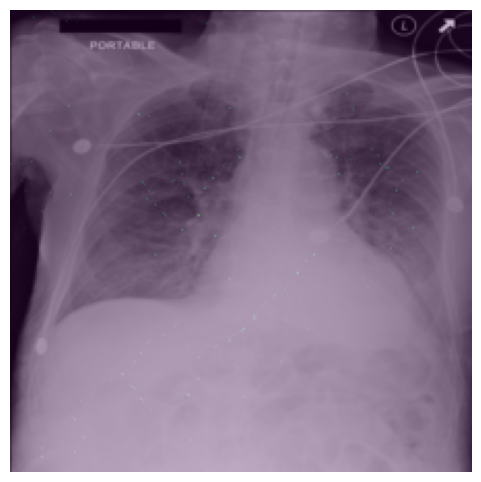

In [85]:
# ─── Single‐DICOM mask optimization (necessary only) ─────────────────────────────
import os
import pydicom
from PIL import Image
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# 1) Point to your external drive directories (edit these!)
external_root     = "/Volumes/Extra Storage"  
dicom_dir         = os.path.join(external_root, "test_data", "test_data")      # where your .dcm files live
output_dir_single = os.path.join(external_root, "local_ADS_data", "results_single")  # where you want outputs
os.makedirs(output_dir_single, exist_ok=True)

# 2) Choose the DICOM ID to process
dicom_id = "4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c"  # ← replace with your ID
dicom_path = os.path.join(dicom_dir, f"{dicom_id}.dcm")

# 3) Load + preprocess for your model
ds  = pydicom.dcmread(dicom_path)
arr = ds.pixel_array.astype("float32")
arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-8)
pil_img = Image.fromarray((arr * 255).round().astype("uint8"))

# test_transform should already be defined above
x = test_transform(pil_img).unsqueeze(0).to(device)  # shape (1,1,H,W)

# 4) Run optimize_mask for necessary only (alpha=0.0)
#    this will also save <dicom_id>_final_mask.pt under output_dir_single
final_mask, mask_history, changed_class = optimize_mask(
    model,
    x,
    alpha=0.0,
    output_dir=output_dir_single,
    prefix=dicom_id
)

# 5) Save the final mask as a PNG
mask_np = final_mask.squeeze().cpu().numpy()  # (H, W)
plt.imsave(
    os.path.join(output_dir_single, f"{dicom_id}_final_mask_necessary.png"),
    mask_np,
    cmap="viridis"
)

# 6) Overlay mask on the original image and save + display
#    resize the raw PIL image to match mask dimensions
resize = transforms.Resize(mask_np.shape)
img_resized = resize(pil_img)

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
ax.imshow(mask_np,      cmap="viridis",  alpha=0.3)
ax.axis("off")
fig.savefig(
    os.path.join(output_dir_single, f"{dicom_id}_overlay.png"),
    bbox_inches="tight",
    pad_inches=0
)
plt.show()


Inverse-mask prediction probs for 4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c: [0.007545406464487314, 0.08147445321083069, 0.19874468445777893, 0.7122354507446289]


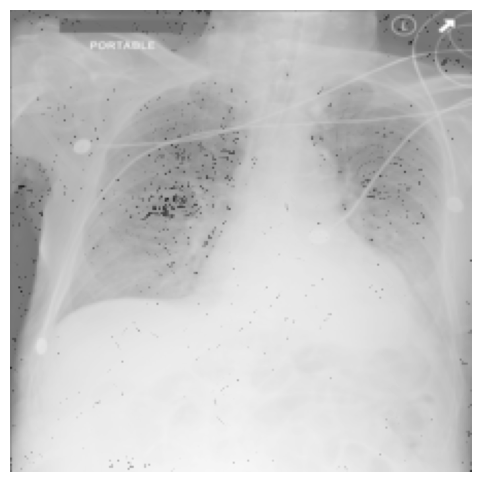

In [82]:
# ─── Apply inverse mask & re-predict ───────────────────────────────────────────
import os
import torch
import matplotlib.pyplot as plt

# assume these are already in scope from the previous cell:
#   dicom_id, arr, pil_img, img_resized, x (input tensor), final_mask, model, device, output_dir_single

# 1) Create inverse mask
inv_mask = 1.0 - final_mask  # tensor shape (1,1,H,W)

# 2) Mask out necessary regions by multiplying
x_inv = x * inv_mask

# 3) Run the model on the inverse-masked image
model.eval()
with torch.no_grad():
    logits_inv = model(x_inv)
    probs_inv  = torch.softmax(logits_inv, dim=1).cpu().numpy().flatten()

# Print the new probabilities
print(f"Inverse-mask prediction probs for {dicom_id}: {probs_inv.tolist()}")

# (optional) write probs to a .txt or .csv
with open(os.path.join(output_dir_single, f"{dicom_id}_inverse_probs.txt"), "w") as f:
    f.write(",".join(f"{p:.4f}" for p in probs_inv))

# 4) Save the original DICOM as a PNG
plt.imsave(
    os.path.join(output_dir_single, f"{dicom_id}_original.png"),
    arr,
    cmap="gray"
)

# 5) Save & display overlay of the inverse mask
inv_mask_np = inv_mask.squeeze().cpu().numpy()  # (H, W)

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
ax.imshow(inv_mask_np, cmap="gray", alpha=0.45)  # red highlights blocked‐out areas
ax.axis("off")

fig.savefig(
    os.path.join(output_dir_single, f"{dicom_id}_inverse_overlay.png"),
    bbox_inches="tight",
    pad_inches=0
)
plt.show()


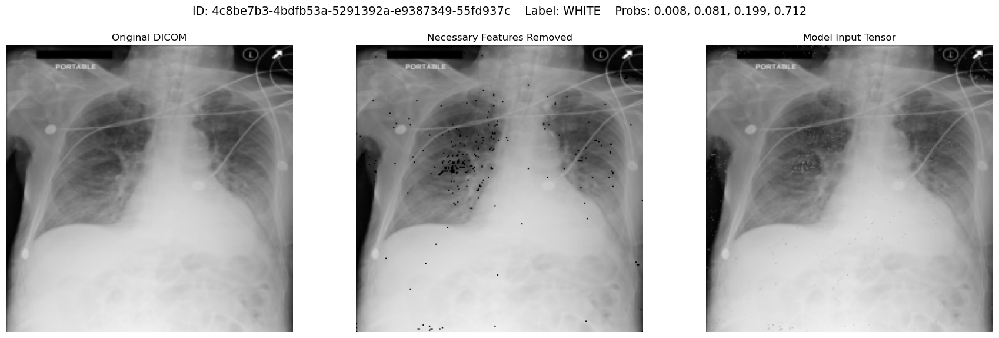

In [83]:
# ─── 3-Panel Summary Figure: Original / Inverse-Mask / Model Input ─────────────────────
import os
import numpy as np
import matplotlib.pyplot as plt

# assume in scope:
#   dicom_id          → str
#   true_label        → str
#   probs_inv         → 1D NumPy array of new probs
#   arr               → raw DICOM array (H,W)
#   img_resized       → PIL image resized to mask size
#   inv_mask          → torch tensor (1,1,H,W)
#   x_inv             → torch tensor (1,1,H,W) that you actually fed to the model
#   output_dir_single → path to save outputs

# 1) Prep NumPy arrays
inv_mask_np = inv_mask.squeeze().cpu().numpy()  # (H, W), floats 0–1
mask_bool   = inv_mask_np < 0.7
true_label = "WHITE"

img_np = np.array(img_resized)
if img_np.ndim == 3:            # drop RGB→gray if needed
    img_gray = img_np[...,0]
else:
    img_gray = img_np

# build the blackened image for panel #2
panel2 = img_gray.copy()
panel2[mask_bool] = 0

# panel #3: model input tensor → convert to NumPy
tensor_np = x_inv.squeeze().cpu().numpy()
# if your test_transform normalized (e.g. mean/std), you may need to unnormalize here.
# But if x_inv is in [0,1], this will plot correctly as-is.

# 2) Create the figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
header = (
    f"ID: {dicom_id}    "
    f"Label: {true_label}    "
    f"Probs: {', '.join(f'{p:.3f}' for p in probs_inv)}"
)
fig.suptitle(header, fontsize=14, y=0.98)

# Panel 1: Original
axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original DICOM")
axes[0].axis("off")

# Panel 2: Inverse-mask applied (black spots)
axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Necessary Features Removed")
axes[1].axis("off")

# Panel 3: Actual model input tensor
axes[2].imshow(tensor_np, cmap="gray", vmin=tensor_np.min(), vmax=tensor_np.max())
axes[2].set_title("Model Input Tensor")
axes[2].axis("off")

# 3) Save & show
out_path = os.path.join(output_dir_single, f"{dicom_id}_3panel_summary.png")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # leave space for suptitle
fig.savefig(out_path, dpi=150)
plt.show()


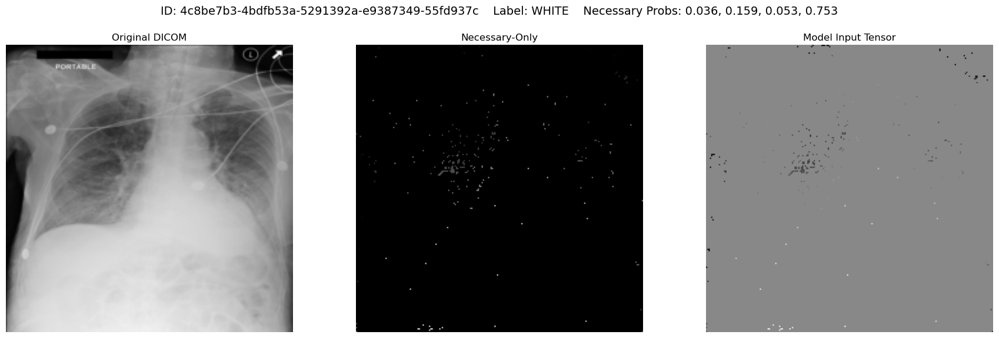

In [84]:
# ─── 3-Panel Necessary-Only Summary Figure: Original / Necessary-Only / Model Input ─────────────────
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# assumes in scope:
#   dicom_id          → str
#   true_label        → str
#   arr               → raw DICOM array (H,W)
#   img_resized       → PIL image resized to mask size
#   final_mask        → torch tensor (1,1,H,W)
#   x                 → original input tensor (1,1,H,W)
#   model, device     → your network and torch device
#   output_dir_single → path to save outputs

# 1) Threshold your final_mask to pick out “necessary” pixels
thresh = 0.3
mask_np        = final_mask.squeeze().cpu().numpy()    # (H, W), floats 0–1
necessary_bool = mask_np > thresh                      # True where necessary

# 2) Prepare the original grayscale image
img_np = np.array(img_resized)
img_gray = img_np[...,0] if img_np.ndim == 3 else img_np

# 3) Build the “necessary-only” visualization for panel #2
panel2 = img_gray.copy()
panel2[~necessary_bool] = 0   # zero-out everything that isn’t necessary

# 4) Create the actual model input tensor: mask out non-necessary pixels
mask_tensor   = (final_mask > thresh).float().to(device)  # (1,1,H,W)
x_necc        = (x * mask_tensor).to(device)

# 5) Re-predict on that tensor
model.eval()
with torch.no_grad():
    logits_necc = model(x_necc)
    probs_necc  = torch.softmax(logits_necc, dim=1).cpu().numpy().flatten()

# 6) Prep the model-input panel (#3)
tensor_np = x_necc.squeeze().cpu().numpy()

# 7) Plot all three panels with header
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
header = (
    f"ID: {dicom_id}    "
    f"Label: {true_label}    "
    f"Necessary Probs: {', '.join(f'{p:.3f}' for p in probs_necc)}"
)
fig.suptitle(header, fontsize=14, y=0.98)

# Panel 1: Original
axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original DICOM")
axes[0].axis("off")

# Panel 2: Necessary-only
axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Necessary-Only")
axes[1].axis("off")

# Panel 3: Actual model input tensor
axes[2].imshow(tensor_np, cmap="gray", vmin=tensor_np.min(), vmax=tensor_np.max())
axes[2].set_title("Model Input Tensor")
axes[2].axis("off")

# 8) Save & show
out_path = os.path.join(output_dir_single, f"{dicom_id}_necessary_3panel_summary.png")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.savefig(out_path, dpi=150)
plt.show()


Step    1: Loss=0.100020 | Suff=0.000020 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.057088 | Suff=0.000000 | Nec=0.013584 | L1=0.483098 | TV=0.877870 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.056029 | Suff=0.000000 | Nec=0.267416 | L1=0.472671 | TV=0.876206 | Changed (keep): False | Changed (remove): False | LR=5.000000e-01
Step   30: Loss=0.053292 | Suff=0.000000 | Nec=0.192655 | L1=0.447368 | TV=0.855489 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.048612 | Suff=0.000000 | Nec=0.202558 | L1=0.405539 | TV=0.805791 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.041764 | Suff=0.000000 | Nec=0.256735 | L1=0.345881 | TV=0.717579 | Changed (keep): False | Changed (remove): False | LR=5.000000e-01
Step   60: Loss=0.033996 | Suff=0.000000 | Nec=0.233791 | L1=0.279398 | TV=0.605646 | Change

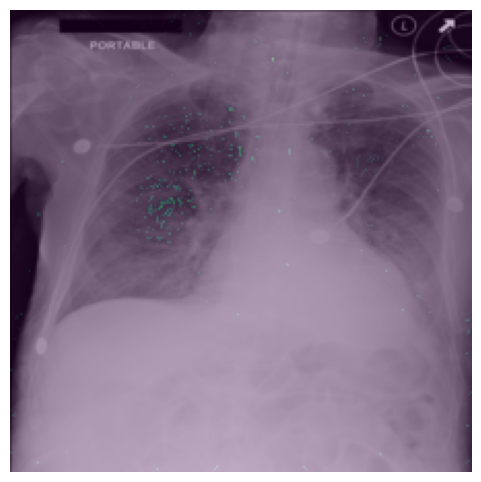

In [ ]:
'''
# ─── Single‐DICOM mask optimization (necessary only) ─────────────────────────────
import os
import pydicom
from PIL import Image
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# 1) Point to your external drive directories (edit these!)
external_root     = "/Volumes/Extra Storage"  
dicom_dir         = os.path.join(external_root, "test_data", "test_data")      # where your .dcm files live
output_dir_single = os.path.join(external_root, "local_ADS_data", "results_single")  # where you want outputs
os.makedirs(output_dir_single, exist_ok=True)

# 2) Choose the DICOM ID to process
dicom_id = "4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c"  # ← replace with your ID
dicom_path = os.path.join(dicom_dir, f"{dicom_id}.dcm")

# 3) Load + preprocess for your model
ds  = pydicom.dcmread(dicom_path)
arr = ds.pixel_array.astype("float32")
arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-8)
pil_img = Image.fromarray((arr * 255).round().astype("uint8"))

# test_transform should already be defined above
x = test_transform(pil_img).unsqueeze(0).to(device)  # shape (1,1,H,W)

# 4) Run optimize_mask for necessary only (alpha=0.0)
#    this will also save <dicom_id>_final_mask.pt under output_dir_single
final_mask, mask_history, changed_class = optimize_mask(
    model,
    x,
    alpha=1.0,
    output_dir=output_dir_single,
    prefix=dicom_id
)

# 5) Save the final mask as a PNG
mask_np = final_mask.squeeze().cpu().numpy()  # (H, W)
plt.imsave(
    os.path.join(output_dir_single, f"{dicom_id}_final_mask.png"),
    mask_np,
    cmap="viridis"
)

# 6) Overlay mask on the original image and save + display
#    resize the raw PIL image to match mask dimensions
resize = transforms.Resize(mask_np.shape)
img_resized = resize(pil_img)

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
ax.imshow(mask_np,      cmap="viridis",  alpha=0.3)
ax.axis("off")
fig.savefig(
    os.path.join(output_dir_single, f"{dicom_id}_overlay.png"),
    bbox_inches="tight",
    pad_inches=0
)
plt.show()
'''


Step    1: Loss=0.100020 | Suff=0.000020 | Nec=0.029868 | L1=1.000000 | TV=0.000000 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   10: Loss=0.057088 | Suff=0.000000 | Nec=0.013584 | L1=0.483098 | TV=0.877870 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   20: Loss=0.056029 | Suff=0.000000 | Nec=0.267416 | L1=0.472671 | TV=0.876206 | Changed (keep): False | Changed (remove): False | LR=5.000000e-01
Step   30: Loss=0.053292 | Suff=0.000000 | Nec=0.192655 | L1=0.447368 | TV=0.855489 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   40: Loss=0.048612 | Suff=0.000000 | Nec=0.202558 | L1=0.405539 | TV=0.805791 | Changed (keep): False | Changed (remove): True | LR=5.000000e-01
Step   50: Loss=0.041764 | Suff=0.000000 | Nec=0.256735 | L1=0.345881 | TV=0.717579 | Changed (keep): False | Changed (remove): False | LR=5.000000e-01
Step   60: Loss=0.033996 | Suff=0.000000 | Nec=0.233791 | L1=0.279398 | TV=0.605646 | Change

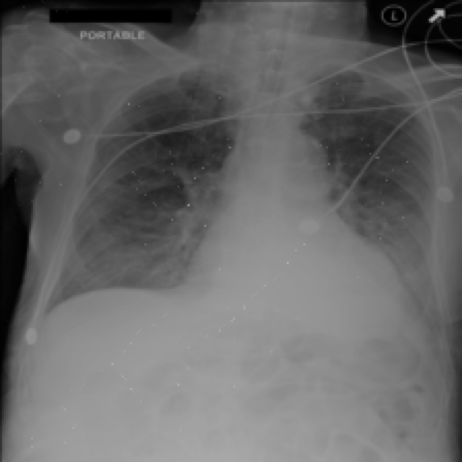

In [76]:
# ─── Single‐DICOM mask optimization (mode-aware, non-overwriting) ─────────────────
import os
import pydicom
from PIL import Image
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

# 0) Choose your mode and set alpha accordingly
mode  = "sufficient"     # e.g. "necessary" or "sufficient"
alpha = 1.0

# 1) Paths (edit these!)
external_root     = "/Volumes/Extra Storage"
dicom_dir         = os.path.join(external_root, "test_data", "test_data")
output_dir_single = os.path.join(external_root, "local_ADS_data", "results_single")
os.makedirs(output_dir_single, exist_ok=True)

# 2) DICOM ID + file
dicom_id   = "4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c"
dicom_path = os.path.join(dicom_dir, f"{dicom_id}.dcm")
prefix     = f"{dicom_id}_{mode}"

# 3) Load & preprocess
ds   = pydicom.dcmread(dicom_path)
arr  = ds.pixel_array.astype("float32")
arr  = (arr - arr.min())/(arr.max()-arr.min()+1e-8)
pil  = Image.fromarray((arr*255).round().astype("uint8"))
x    = test_transform(pil).unsqueeze(0).to(device)  # (1,1,H,W)

# 4) Optimize or reload mask
mask_pt = os.path.join(output_dir_single, f"{prefix}_final_mask.pt")
final_mask, mask_history, changed_class = optimize_mask(
        model, x, alpha=alpha,
        output_dir=output_dir_single,
        prefix=prefix
    )

# 5) Save final_mask as PNG (if missing)
mask_png = os.path.join(output_dir_single, f"{prefix}_final_mask.png")
if not os.path.exists(mask_png):
    mask_np = final_mask.squeeze().cpu().numpy()
    plt.imsave(mask_png, mask_np, cmap="gray")
    print(f"Saved mask PNG: {mask_png}")

# 6) Build & save overlay
resize      = transforms.Resize(final_mask.shape[-2:])
img_resized = resize(pil)
overlay_png = os.path.join(output_dir_single, f"{prefix}_overlay.png")
if not os.path.exists(overlay_png):
    mask_np = final_mask.squeeze().cpu().numpy()
    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
    ax.imshow(mask_np,      cmap="gray", alpha=0.3)
    ax.axis("off")
    fig.savefig(overlay_png, bbox_inches="tight", pad_inches=0)
    plt.close(fig)
    print(f"Saved overlay PNG: {overlay_png}")

# 7) Display what we have
print("Done. Files written (or re-used) with prefix:", prefix)
img = Image.open(overlay_png)
display(img)


Inverse-mask prediction probs for 4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c: [0.00038563122507184744, 0.0023516868241131306, 0.00046757873496972024, 0.996795117855072]


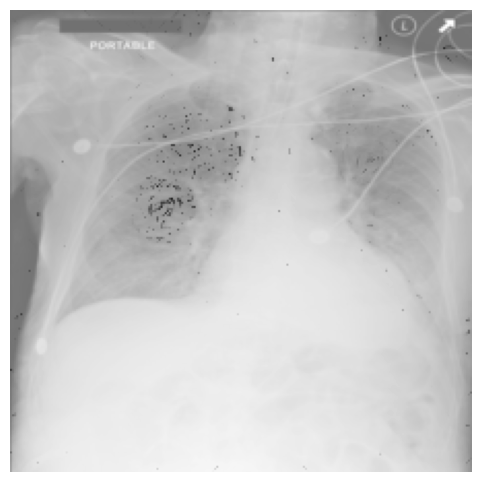

In [ ]:
'''
# ─── Apply inverse mask & re-predict ───────────────────────────────────────────
import os
import torch
import matplotlib.pyplot as plt

# assume these are already in scope from the previous cell:
#   dicom_id, arr, pil_img, img_resized, x (input tensor), final_mask, model, device, output_dir_single

# 1) Create inverse mask
inv_mask = 1.0 - final_mask  # tensor shape (1,1,H,W)

# 2) Mask out necessary regions by multiplying
x_inv = x * inv_mask

# 3) Run the model on the inverse-masked image
model.eval()
with torch.no_grad():
    logits_inv = model(x_inv)
    probs_inv  = torch.softmax(logits_inv, dim=1).cpu().numpy().flatten()

# Print the new probabilities
print(f"Inverse-mask prediction probs for {dicom_id}: {probs_inv.tolist()}")

# (optional) write probs to a .txt or .csv
with open(os.path.join(output_dir_single, f"{dicom_id}_inverse_probs.txt"), "w") as f:
    f.write(",".join(f"{p:.4f}" for p in probs_inv))

# 4) Save the original DICOM as a PNG
plt.imsave(
    os.path.join(output_dir_single, f"{dicom_id}_original.png"),
    arr,
    cmap="gray"
)

# 5) Save & display overlay of the inverse mask
inv_mask_np = inv_mask.squeeze().cpu().numpy()  # (H, W)

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
ax.imshow(inv_mask_np, cmap="gray", alpha=0.45)  # red highlights blocked‐out areas
ax.axis("off")

fig.savefig(
    os.path.join(output_dir_single, f"{dicom_id}_inverse_overlay.png"),
    bbox_inches="tight",
    pad_inches=0
)
plt.show()
'''



Saved inverse‐mask probs → /Volumes/Extra Storage/local_ADS_data/results_single/4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c_sufficient_inverse_probs.txt
Sufficient‐mode inverse‐mask prediction probs for 4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c: [0.008162649348378181, 0.12060631066560745, 0.5222256183624268, 0.34900540113449097]
Saved original image → /Volumes/Extra Storage/local_ADS_data/results_single/4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c_sufficient_original.png
Saved inverse overlay → /Volumes/Extra Storage/local_ADS_data/results_single/4c8be7b3-4bdfb53a-5291392a-e9387349-55fd937c_sufficient_inverse_overlay.png


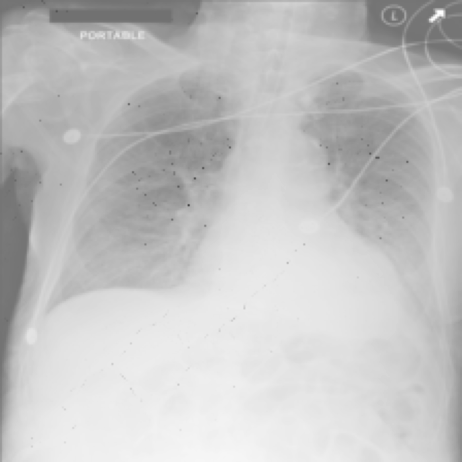

In [74]:
# ─── Apply Inverse Mask & Re‐predict (mode‐aware, non‐overwriting) ─────────────────
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

# assumes in scope from the previous cell:
#   dicom_id, mode, prefix,
#   arr, pil, img_resized,
#   x, final_mask,
#   model, device,
#   output_dir_single

# 1) Create inverse mask & masked input
inv_mask   = 1.0 - final_mask              # (1,1,H,W)
x_inv      = (x * inv_mask).to(device)     # only non‐necessary pixels

# 2) Predict & save probs if missing
probs_file = os.path.join(output_dir_single, f"{prefix}_inverse_probs.txt")
if not os.path.exists(probs_file):
    model.eval()
    with torch.no_grad():
        logits_inv = model(x_inv)
        probs_inv  = torch.softmax(logits_inv, dim=1).cpu().numpy().flatten()
    # write them out
    with open(probs_file, "w") as f:
        f.write(",".join(f"{p:.4f}" for p in probs_inv))
    print(f"Saved inverse‐mask probs → {probs_file}")
else:
    # reload for display
    probs_inv = np.loadtxt(probs_file, delimiter=",")
    print(f"Loaded existing probs → {probs_file}")

print(f"{mode.title()}‐mode inverse‐mask prediction probs for {dicom_id}: {probs_inv.tolist()}")

# 3) Save original DICOM PNG if missing
orig_png = os.path.join(output_dir_single, f"{prefix}_original.png")
if not os.path.exists(orig_png):
    plt.imsave(orig_png, arr, cmap="gray")
    print(f"Saved original image → {orig_png}")

# 4) Save & display semi‐transparent inverse overlay if missing
overlay_png = os.path.join(output_dir_single, f"{prefix}_inverse_overlay.png")
if not os.path.exists(overlay_png):
    inv_np = inv_mask.squeeze().cpu().numpy()
    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img_resized, cmap="gray", vmin=0, vmax=255)
    ax.imshow(inv_np,      cmap="gray", alpha=0.45)
    ax.axis("off")
    fig.savefig(overlay_png, bbox_inches="tight", pad_inches=0)
    plt.close(fig)
    print(f"Saved inverse overlay → {overlay_png}")

# 5) Display the overlay inline
from PIL import Image
display(Image.open(overlay_png))


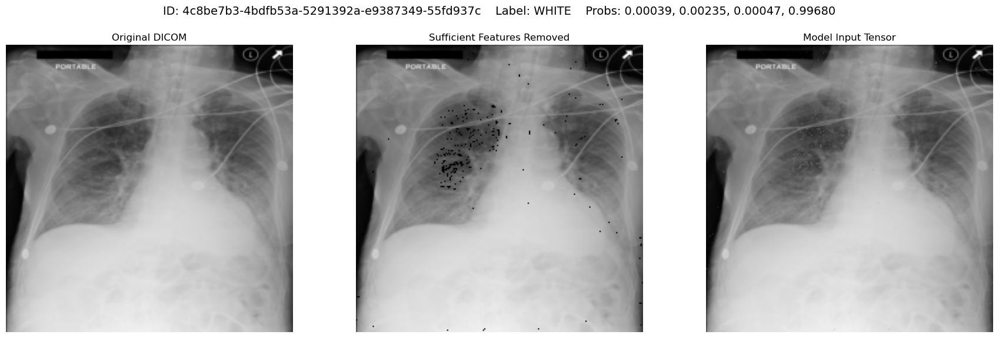

In [ ]:
'''
# ─── 3-Panel Summary Figure: Original / Inverse-Mask / Model Input ─────────────────────
import os
import numpy as np
import matplotlib.pyplot as plt

# assume in scope:
#   dicom_id          → str
#   true_label        → str
#   probs_inv         → 1D NumPy array of new probs
#   arr               → raw DICOM array (H,W)
#   img_resized       → PIL image resized to mask size
#   inv_mask          → torch tensor (1,1,H,W)
#   x_inv             → torch tensor (1,1,H,W) that you actually fed to the model
#   output_dir_single → path to save outputs

# 1) Prep NumPy arrays
inv_mask_np = inv_mask.squeeze().cpu().numpy()  # (H, W), floats 0–1
mask_bool   = inv_mask_np < 0.85
true_label = "WHITE"

img_np = np.array(img_resized)
if img_np.ndim == 3:            # drop RGB→gray if needed
    img_gray = img_np[...,0]
else:
    img_gray = img_np

# build the blackened image for panel #2
panel2 = img_gray.copy()
panel2[mask_bool] = 0

# panel #3: model input tensor → convert to NumPy
tensor_np = x_inv.squeeze().cpu().numpy()
# if your test_transform normalized (e.g. mean/std), you may need to unnormalize here.
# But if x_inv is in [0,1], this will plot correctly as-is.

# 2) Create the figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
header = (
    f"ID: {dicom_id}    "
    f"Label: {true_label}    "
    f"Probs: {', '.join(f'{p:.5f}' for p in probs_inv)}"
)
fig.suptitle(header, fontsize=14, y=0.98)

# Panel 1: Original
axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original DICOM")
axes[0].axis("off")

# Panel 2: Inverse-mask applied (black spots)
axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Sufficient Features Removed")
axes[1].axis("off")

# Panel 3: Actual model input tensor
axes[2].imshow(tensor_np, cmap="gray", vmin=tensor_np.min(), vmax=tensor_np.max())
axes[2].set_title("Model Input Tensor")
axes[2].axis("off")

# 3) Save & show
out_path = os.path.join(output_dir_single, f"{dicom_id}_3panel_summary.png")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # leave space for suptitle
fig.savefig(out_path, dpi=150)
plt.show()
'''


In [ ]:
# ─── 3-Panel Non-overwriting Summary Figure (mode-aware) ───────────────────────
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# in scope from previous cells:
#   dicom_id, true_label, probs_inv,
#   arr, img_resized, inv_mask, x_inv,
#   mode, prefix, output_dir_single

# define output path
out_path = os.path.join(output_dir_single, f"{prefix}_3panel_summary.png")

# only create if it doesn't already exist
if not os.path.exists(out_path):
    # 1) Prep NumPy arrays
    inv_mask_np = inv_mask.squeeze().cpu().numpy()      # (H, W), floats 0–1
    mask_bool   = inv_mask_np < 0.85                    # same threshold as before

    img_np = np.array(img_resized)
    img_gray = img_np[...,0] if img_np.ndim == 3 else img_np

    # 2) Build panel #2: black‐out “necessary” spots
    panel2 = img_gray.copy()
    panel2[mask_bool] = 0

    # 3) Prep panel #3: the tensor fed to model
    tensor_np = x_inv.squeeze().cpu().numpy()

    # 4) Create figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    header = (
        f"ID: {dicom_id}    "
        f"Label: {true_label}    "
        f"{mode.title()} Probs: {', '.join(f'{p:.5f}' for p in probs_inv)}"
    )
    fig.suptitle(header, fontsize=14, y=0.98)

    # Panel 1: Original
    axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
    axes[0].set_title("Original DICOM")
    axes[0].axis("off")

    # Panel 2: Inverse-mask applied (black spots)
    axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
    axes[1].set_title("Necessary Features Removed")
    axes[1].axis("off")

    # Panel 3: Model input tensor
    axes[2].imshow(tensor_np, cmap="gray",
                   vmin=tensor_np.min(), vmax=tensor_np.max())
    axes[2].set_title("Model Input Tensor")
    axes[2].axis("off")

    # 5) Save & close
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig.savefig(out_path, dpi=150)
    plt.close(fig)
    print(f"Saved 3-panel summary → {out_path}")

# display the output
display(Image.open(out_path))


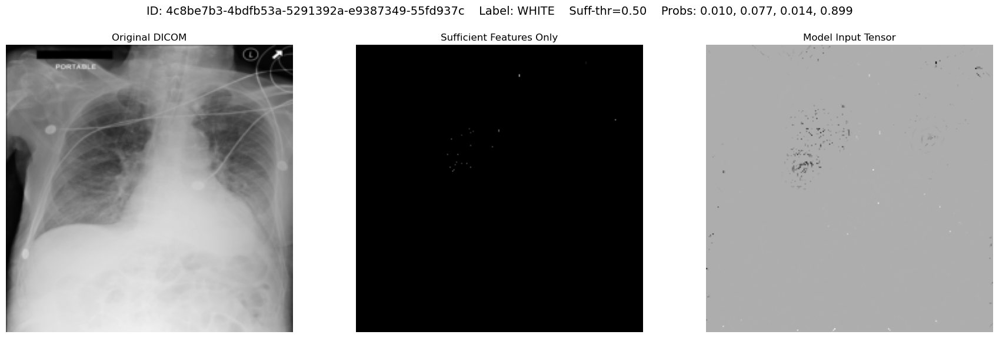

In [ ]:
'''
# ─── 3-Panel Sufficiency Figure (background auto-added) ─────────────────────────
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# assume in scope:
#   dicom_id, true_label, arr, img_resized, final_mask, x, model, device, output_dir_single

# 1) Threshold your mask to pick “sufficient” pixels
thresh    = 0.5
mask_np   = final_mask.squeeze().cpu().numpy()    # (H, W)
suff_bool = mask_np > thresh

# 2) Build a “sufficiency only” visualization for panel 2
img_np = np.array(img_resized)
img_gray = img_np[...,0] if img_np.ndim==3 else img_np

panel2 = img_gray.copy()
panel2[~suff_bool] = 0   # zero-out everything that isn’t sufficient

# 3) Create the actual model input tensor: just mask out non-sufficient pixels
x_suff = (x * final_mask).to(device)

# 4) Re-run the model on that tensor
model.eval()
with torch.no_grad():
    logits_suff = model(x_suff)
    probs_suff  = torch.softmax(logits_suff, dim=1).cpu().numpy().flatten()

# 5) Prep panel 3 from x_suff
tensor_np = x_suff.squeeze().cpu().numpy()

# 6) Plot all three panels with header
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
header = (
    f"ID: {dicom_id}    "
    f"Label: {true_label}    "
    f"Suff-thr={thresh:.2f}    "
    f"Probs: {', '.join(f'{p:.3f}' for p in probs_suff)}"
)
fig.suptitle(header, fontsize=14, y=0.98)

# Panel 1: original
axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original DICOM")
axes[0].axis("off")

# Panel 2: sufficiency-only
axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Sufficient Features Only")
axes[1].axis("off")

# Panel 3: actual model input tensor
axes[2].imshow(tensor_np, cmap="gray", vmin=tensor_np.min(), vmax=tensor_np.max())
axes[2].set_title("Model Input Tensor")
axes[2].axis("off")

# 7) Save & show
out_path = os.path.join(output_dir_single, f"{dicom_id}_sufficiency_summary.png")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.savefig(out_path, dpi=150)
plt.show()
'''


In [ ]:
# ─── 3-Panel Sufficiency Figure (mode-aware, non-overwriting) ─────────────────
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

# assumes in scope:
#   dicom_id, true_label, arr, img_resized, final_mask, x, model, device,
#   output_dir_single, mode, prefix

# 1) define output path
out_path = os.path.join(output_dir_single, f"{prefix}_3panel_sufficiency.png")

if not os.path.exists(out_path):
    # 2) threshold mask
    thresh     = 0.5
    mask_np    = final_mask.squeeze().cpu().numpy()    # (H, W)
    suff_bool  = mask_np > thresh

    # 3) prepare original gray image
    img_np     = np.array(img_resized)
    img_gray   = img_np[...,0] if img_np.ndim==3 else img_np

    # 4) build panel #2 (sufficient-only)
    panel2     = img_gray.copy()
    panel2[~suff_bool] = 0

    # 5) build the tensor fed to model (background will be auto-added)
    x_suff     = (x * final_mask).to(device)

    # 6) re-run prediction
    model.eval()
    with torch.no_grad():
        logits_suff = model(x_suff)
        probs_suff  = torch.softmax(logits_suff, dim=1).cpu().numpy().flatten()

    # 7) prep panel #3
    tensor_np  = x_suff.squeeze().cpu().numpy()

    # 8) plot 3-panel figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    header = (
        f"ID: {dicom_id}    "
        f"Label: {true_label}    "
        f"{mode.title()} Probs: {', '.join(f'{p:.3f}' for p in probs_suff)}"
    )
    fig.suptitle(header, fontsize=14, y=0.98)

    axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
    axes[0].set_title("Original DICOM");      axes[0].axis("off")

    axes[1].imshow(panel2, cmap="gray", vmin=0, vmax=255)
    axes[1].set_title("Sufficient Features Only"); axes[1].axis("off")

    axes[2].imshow(tensor_np, cmap="gray",
                   vmin=tensor_np.min(), vmax=tensor_np.max())
    axes[2].set_title("Model Input Tensor");    axes[2].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig.savefig(out_path, dpi=150)
    plt.show()
else:
    display(Image.open(out_path))
    print(f"Loaded existing sufficiency figure → {out_path}")
